In [1]:
!pip install torch
!pip install torchvision
!pip install matplotlib
!pip install tqdm


[notice] A new release of pip is available: 23.2.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.2.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.2.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.2.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [20]:
import os
import torch
import torchvision
import torch.nn as nn

from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.utils import make_grid

import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

In [3]:
if not os.path.exists('data'):
    os.makedirs('data')

batch_size = 16

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean = [0.5], std = [0.5])
])

mnist_data = datasets.MNIST(
    root = 'data/',
    train = True,
    transform = transform,
    download = True
)

mnist_dataloader = DataLoader(
    dataset = mnist_data, batch_size = batch_size,
    shuffle = True, drop_last = True
)

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|███████████████████████████████████████████████████████████████████| 9912422/9912422 [00:09<00:00, 1029601.66it/s]


Extracting data/MNIST\raw\train-images-idx3-ubyte.gz to data/MNIST\raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|████████████████████████████████████████████████████████████████████████| 28881/28881 [00:00<00:00, 112601.30it/s]


Extracting data/MNIST\raw\train-labels-idx1-ubyte.gz to data/MNIST\raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|████████████████████████████████████████████████████████████████████| 1648877/1648877 [00:01<00:00, 901571.20it/s]


Extracting data/MNIST\raw\t10k-images-idx3-ubyte.gz to data/MNIST\raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|█████████████████████████████████████████████████████████████████████████| 4542/4542 [00:00<00:00, 2265492.78it/s]

Extracting data/MNIST\raw\t10k-labels-idx1-ubyte.gz to data/MNIST\raw



In [4]:
len(mnist_data)

60000

In [5]:
len(mnist_dataloader)

3750

In [7]:
dataiter = iter(mnist_dataloader)
images, labels = next(dataiter)
images.shape

torch.Size([16, 1, 28, 28])

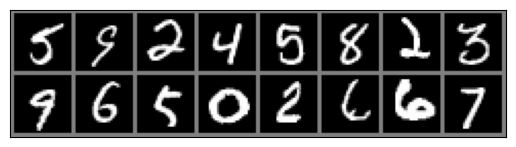

In [8]:
def display(img):
    img = img / 2 + 0.5
    img = img.permute(1, 2, 0)
    npimg = img.numpy()

    plt.imshow(npimg)
    plt.xticks([])
    plt.yticks([])
    plt.show()

display(make_grid(images, 8))

In [17]:
latent_noise_size = 128

image_size = 784

In [21]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        self.main = nn.Sequential(
            nn.Linear(latent_noise_size, 64),
            nn.ReLU(),

            nn.Linear(64, 128),
            nn.ReLU(),

            nn.Linear(128, 256),
            nn.ReLU(),

            nn.Linear(256, image_size),
            nn.Tanh()
        )

    def forward(self, x):
        return self.main(x)

In [22]:
generator = Generator()

print(generator)

Generator(
  (main): Sequential(
    (0): Linear(in_features=128, out_features=64, bias=True)
    (1): ReLU()
    (2): Linear(in_features=64, out_features=128, bias=True)
    (3): ReLU()
    (4): Linear(in_features=128, out_features=256, bias=True)
    (5): ReLU()
    (6): Linear(in_features=256, out_features=784, bias=True)
    (7): Tanh()
  )
)


In [23]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.main = nn.Sequential(
            nn.Linear(image_size, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(p = 0.2),

            nn.Linear(256, 128),
            nn.LeakyReLU(0.2),
            nn.Dropout(p = 0.2),

            nn.Linear(128, 64),
            nn.LeakyReLU(0.2),
            nn.Dropout(p = 0.2),

            nn.Linear(64, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

In [24]:
discriminator = Discriminator()

print(discriminator)

Discriminator(
  (main): Sequential(
    (0): Linear(in_features=784, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=256, out_features=128, bias=True)
    (4): LeakyReLU(negative_slope=0.2)
    (5): Dropout(p=0.2, inplace=False)
    (6): Linear(in_features=128, out_features=64, bias=True)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Dropout(p=0.2, inplace=False)
    (9): Linear(in_features=64, out_features=1, bias=True)
    (10): Sigmoid()
  )
)


In [26]:
z = torch.randn(32, latent_noise_size)

sample_generated_output = generator(z)

sample_generated_output

tensor([[ 0.0638,  0.0294,  0.0856,  ...,  0.0310,  0.0539, -0.0313],
        [ 0.1056, -0.0152,  0.0234,  ...,  0.0194,  0.0230, -0.0145],
        [ 0.0753, -0.0165,  0.0631,  ..., -0.0252,  0.0248, -0.0422],
        ...,
        [ 0.0398,  0.0087,  0.0732,  ..., -0.0275, -0.0272,  0.0207],
        [ 0.0883, -0.0940,  0.0370,  ..., -0.0303,  0.0345, -0.0652],
        [ 0.0720, -0.0038,  0.0272,  ...,  0.0015, -0.0299, -0.0324]],
       grad_fn=<TanhBackward0>)

In [27]:
sample_generated_output.shape

torch.Size([32, 784])

In [28]:
torch.min(sample_generated_output).item(), torch.max(sample_generated_output).item()

(-0.23498351871967316, 0.20023654401302338)

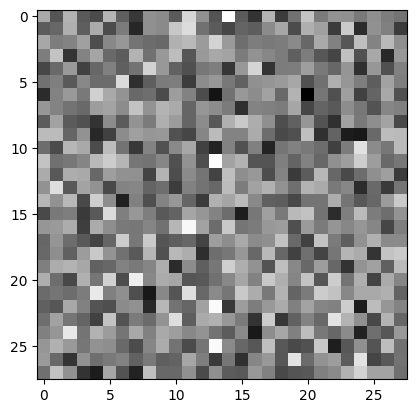

In [30]:
generated_images = sample_generated_output.reshape(32, 1, 28, 28)

random_image = generated_images[16, 0, :, :]

plt.imshow(random_image.detach().numpy(), cmap = 'gray')

In [31]:
generated_images.shape

torch.Size([32, 1, 28, 28])

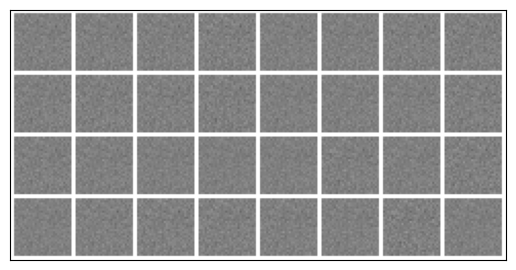

In [32]:
display(make_grid(generated_images, nrow = 8, pad_value = 1.0))

In [34]:
discriminator.eval()

with torch.no_grad():
    prediction = discriminator(generated_images.reshape(-1, 784))

print(prediction[:15])

tensor([[0.5071],
        [0.5069],
        [0.5073],
        [0.5073],
        [0.5067],
        [0.5072],
        [0.5071],
        [0.5069],
        [0.5069],
        [0.5066],
        [0.5071],
        [0.5071],
        [0.5070],
        [0.5074],
        [0.5072]])


In [35]:
discriminator.eval()

with torch.no_grad():
    prediction_real = discriminator(images.reshape(-1, 784))

print(prediction[:15])

tensor([[0.5071],
        [0.5069],
        [0.5073],
        [0.5073],
        [0.5067],
        [0.5072],
        [0.5071],
        [0.5069],
        [0.5069],
        [0.5066],
        [0.5071],
        [0.5071],
        [0.5070],
        [0.5074],
        [0.5072]])


In [36]:
criterion = nn.BCELoss()

In [37]:
import torch.optim as optim

optimizer_D = optim.Adam(discriminator.parameters(), lr = 0.0002)
optimizer_G = optim.Adam(generator.parameters(), lr = 0.0002)

print(optimizer_D)
print(optimizer_G)

Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0002
    maximize: False
    weight_decay: 0
)
Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0002
    maximize: False
    weight_decay: 0
)


In [42]:
real_image_labels = torch.full((batch_size,), 1., dtype = torch.float)
fake_image_labels = torch.full((batch_size,), 0., dtype = torch.float)

In [43]:
fixed_noise = torch.randn(batch_size, latent_noise_size)

  0%|                                                                                           | 0/50 [00:00<?, ?it/s]

-------------------------------------
                Epoch 1:
                Step: 0 |
                D_real Loss: 0.6922 |
                D_fake Loss: 0.7080 |
                D_total Loss: 1.4003 |
                G_Loss: 0.679 |
                Real_score 0.500 |
                Fake_score 0.507
            


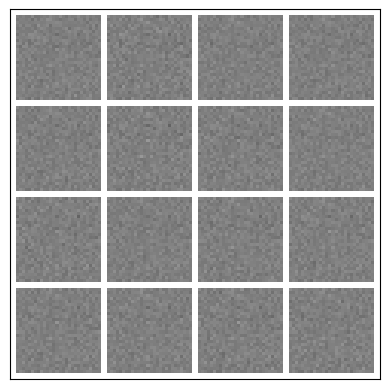

-------------------------------------
                Epoch 1:
                Step: 500 |
                D_real Loss: 0.0282 |
                D_fake Loss: 0.1533 |
                D_total Loss: 0.1816 |
                G_Loss: 2.455 |
                Real_score 0.976 |
                Fake_score 0.136
            


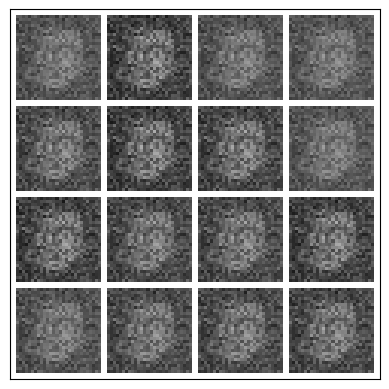

-------------------------------------
                Epoch 1:
                Step: 1000 |
                D_real Loss: 0.7685 |
                D_fake Loss: 0.4652 |
                D_total Loss: 1.2337 |
                G_Loss: 2.387 |
                Real_score 0.634 |
                Fake_score 0.334
            


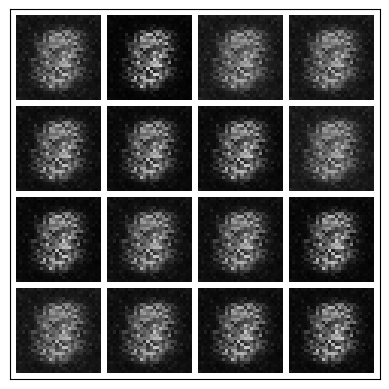

-------------------------------------
                Epoch 1:
                Step: 1500 |
                D_real Loss: 0.1058 |
                D_fake Loss: 0.6881 |
                D_total Loss: 0.7939 |
                G_Loss: 1.364 |
                Real_score 0.903 |
                Fake_score 0.421
            


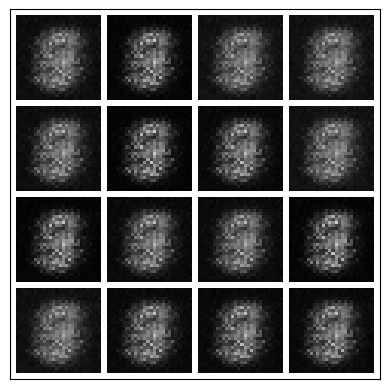

-------------------------------------
                Epoch 1:
                Step: 2000 |
                D_real Loss: 0.0582 |
                D_fake Loss: 0.0342 |
                D_total Loss: 0.0924 |
                G_Loss: 4.551 |
                Real_score 0.957 |
                Fake_score 0.033
            


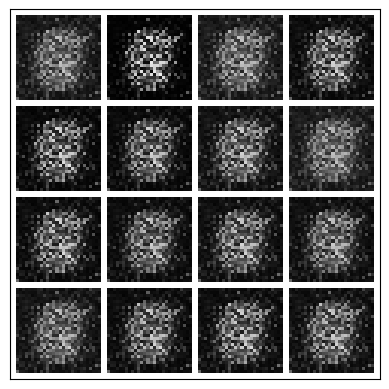

-------------------------------------
                Epoch 1:
                Step: 2500 |
                D_real Loss: 0.0353 |
                D_fake Loss: 0.2312 |
                D_total Loss: 0.2665 |
                G_Loss: 2.464 |
                Real_score 0.969 |
                Fake_score 0.183
            


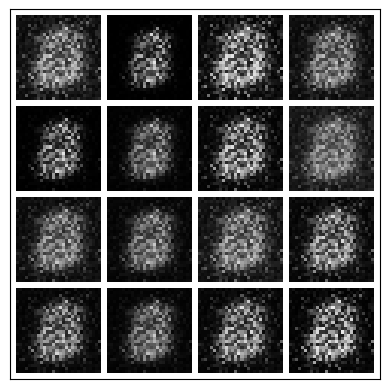

-------------------------------------
                Epoch 1:
                Step: 3000 |
                D_real Loss: 0.0398 |
                D_fake Loss: 0.1458 |
                D_total Loss: 0.1856 |
                G_Loss: 4.127 |
                Real_score 0.970 |
                Fake_score 0.111
            


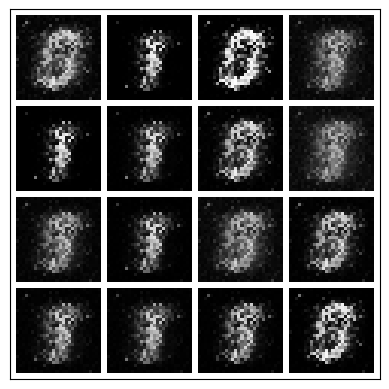

-------------------------------------
                Epoch 1:
                Step: 3500 |
                D_real Loss: 0.1519 |
                D_fake Loss: 0.0124 |
                D_total Loss: 0.1643 |
                G_Loss: 5.764 |
                Real_score 0.921 |
                Fake_score 0.012
            


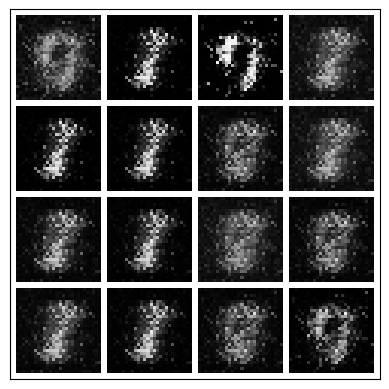

  2%|█▋                                                                                 | 1/50 [01:06<54:36, 66.86s/it]

-------------------------------------
                Epoch 2:
                Step: 0 |
                D_real Loss: 0.2081 |
                D_fake Loss: 0.2543 |
                D_total Loss: 0.4624 |
                G_Loss: 2.538 |
                Real_score 0.898 |
                Fake_score 0.201
            


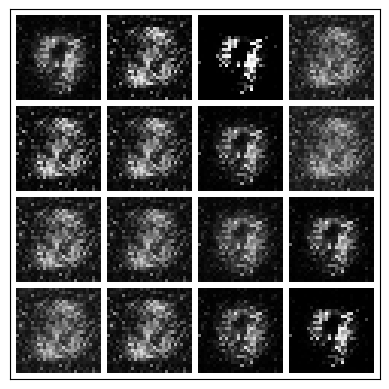

-------------------------------------
                Epoch 2:
                Step: 500 |
                D_real Loss: 0.0512 |
                D_fake Loss: 0.0356 |
                D_total Loss: 0.0868 |
                G_Loss: 3.950 |
                Real_score 0.962 |
                Fake_score 0.034
            


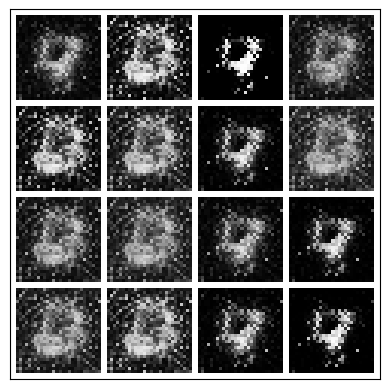

-------------------------------------
                Epoch 2:
                Step: 1000 |
                D_real Loss: 0.1404 |
                D_fake Loss: 0.1095 |
                D_total Loss: 0.2499 |
                G_Loss: 4.689 |
                Real_score 0.926 |
                Fake_score 0.092
            


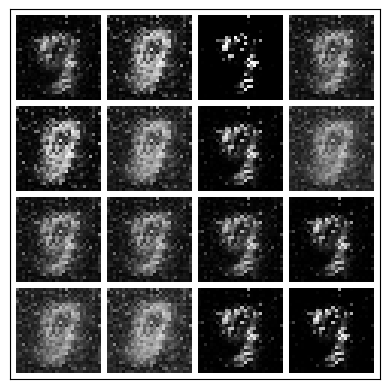

-------------------------------------
                Epoch 2:
                Step: 1500 |
                D_real Loss: 0.1809 |
                D_fake Loss: 0.1220 |
                D_total Loss: 0.3029 |
                G_Loss: 3.811 |
                Real_score 0.940 |
                Fake_score 0.075
            


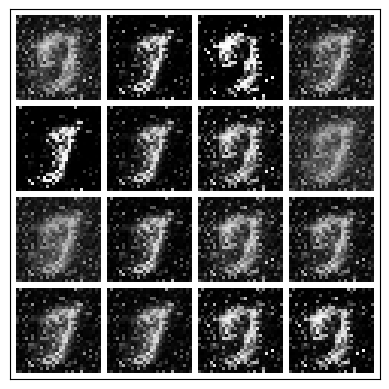

-------------------------------------
                Epoch 2:
                Step: 2000 |
                D_real Loss: 0.1100 |
                D_fake Loss: 0.1667 |
                D_total Loss: 0.2767 |
                G_Loss: 3.383 |
                Real_score 0.917 |
                Fake_score 0.138
            


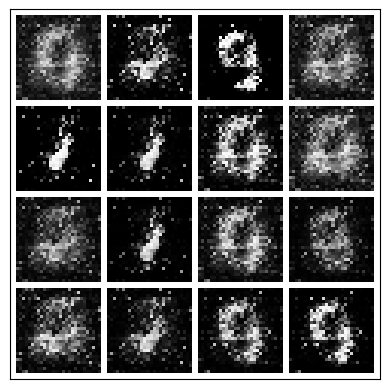

-------------------------------------
                Epoch 2:
                Step: 2500 |
                D_real Loss: 0.0214 |
                D_fake Loss: 0.1577 |
                D_total Loss: 0.1791 |
                G_Loss: 2.499 |
                Real_score 0.981 |
                Fake_score 0.137
            


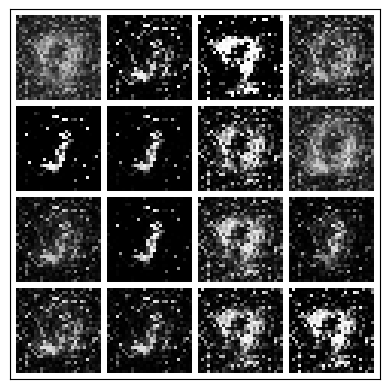

-------------------------------------
                Epoch 2:
                Step: 3000 |
                D_real Loss: 0.0139 |
                D_fake Loss: 0.0173 |
                D_total Loss: 0.0312 |
                G_Loss: 4.682 |
                Real_score 0.987 |
                Fake_score 0.017
            


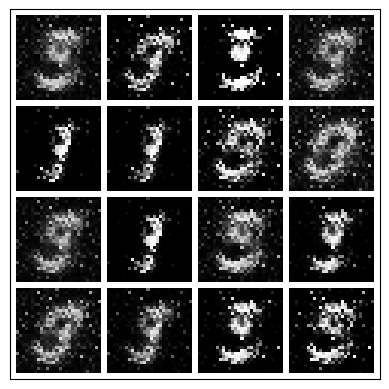

-------------------------------------
                Epoch 2:
                Step: 3500 |
                D_real Loss: 0.0840 |
                D_fake Loss: 0.0399 |
                D_total Loss: 0.1239 |
                G_Loss: 3.776 |
                Real_score 0.926 |
                Fake_score 0.038
            


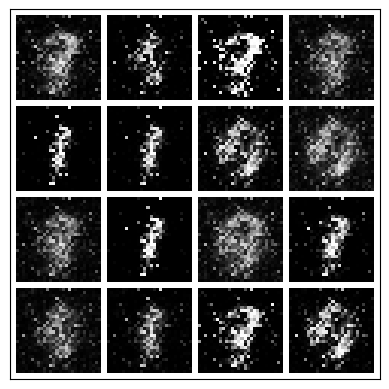

  4%|███▎                                                                               | 2/50 [02:17<55:08, 68.92s/it]

-------------------------------------
                Epoch 3:
                Step: 0 |
                D_real Loss: 0.2945 |
                D_fake Loss: 0.0175 |
                D_total Loss: 0.3120 |
                G_Loss: 6.181 |
                Real_score 0.810 |
                Fake_score 0.017
            


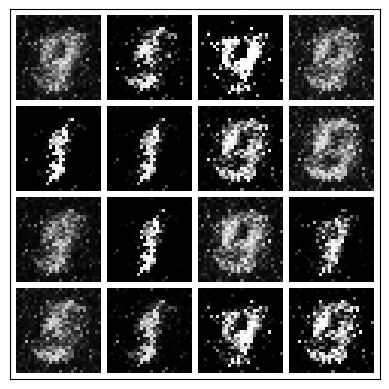

-------------------------------------
                Epoch 3:
                Step: 500 |
                D_real Loss: 0.1185 |
                D_fake Loss: 0.2739 |
                D_total Loss: 0.3924 |
                G_Loss: 3.277 |
                Real_score 0.923 |
                Fake_score 0.152
            


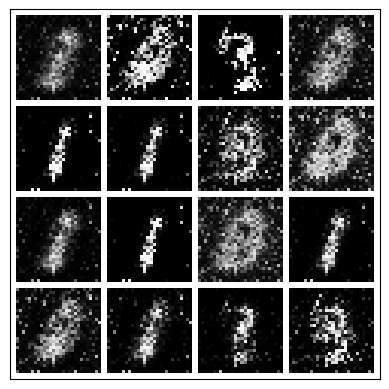

-------------------------------------
                Epoch 3:
                Step: 1000 |
                D_real Loss: 0.0685 |
                D_fake Loss: 0.1889 |
                D_total Loss: 0.2574 |
                G_Loss: 2.521 |
                Real_score 0.948 |
                Fake_score 0.163
            


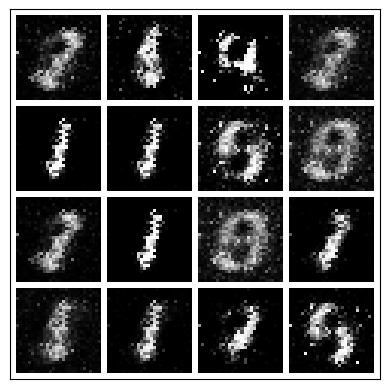

-------------------------------------
                Epoch 3:
                Step: 1500 |
                D_real Loss: 0.0561 |
                D_fake Loss: 0.2001 |
                D_total Loss: 0.2562 |
                G_Loss: 2.628 |
                Real_score 0.951 |
                Fake_score 0.170
            


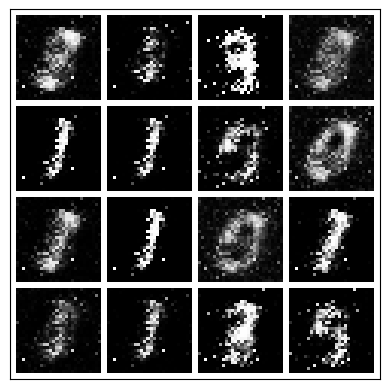

-------------------------------------
                Epoch 3:
                Step: 2000 |
                D_real Loss: 0.2466 |
                D_fake Loss: 0.1402 |
                D_total Loss: 0.3868 |
                G_Loss: 2.129 |
                Real_score 0.844 |
                Fake_score 0.126
            


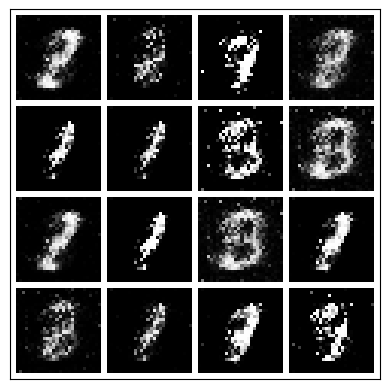

-------------------------------------
                Epoch 3:
                Step: 2500 |
                D_real Loss: 0.0287 |
                D_fake Loss: 0.8881 |
                D_total Loss: 0.9168 |
                G_Loss: 2.787 |
                Real_score 0.973 |
                Fake_score 0.416
            


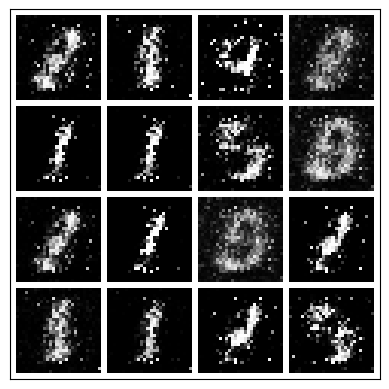

-------------------------------------
                Epoch 3:
                Step: 3000 |
                D_real Loss: 0.3157 |
                D_fake Loss: 0.1026 |
                D_total Loss: 0.4182 |
                G_Loss: 2.909 |
                Real_score 0.891 |
                Fake_score 0.095
            


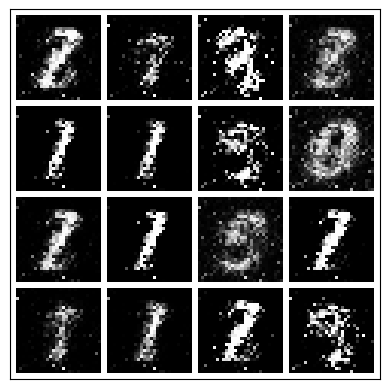

-------------------------------------
                Epoch 3:
                Step: 3500 |
                D_real Loss: 0.0912 |
                D_fake Loss: 0.2881 |
                D_total Loss: 0.3793 |
                G_Loss: 2.582 |
                Real_score 0.922 |
                Fake_score 0.212
            


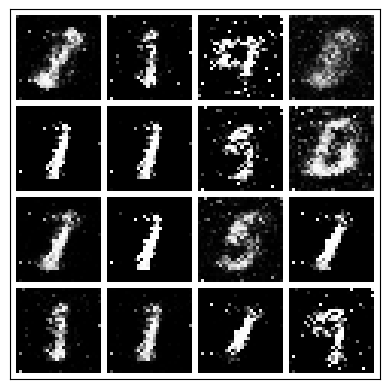

  6%|████▉                                                                              | 3/50 [03:28<54:59, 70.21s/it]

-------------------------------------
                Epoch 4:
                Step: 0 |
                D_real Loss: 0.0938 |
                D_fake Loss: 0.1895 |
                D_total Loss: 0.2833 |
                G_Loss: 2.170 |
                Real_score 0.923 |
                Fake_score 0.158
            


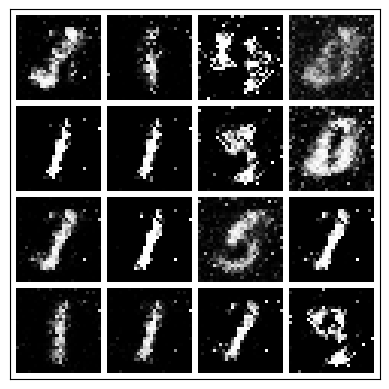

-------------------------------------
                Epoch 4:
                Step: 500 |
                D_real Loss: 0.3379 |
                D_fake Loss: 0.0693 |
                D_total Loss: 0.4071 |
                G_Loss: 3.198 |
                Real_score 0.805 |
                Fake_score 0.066
            


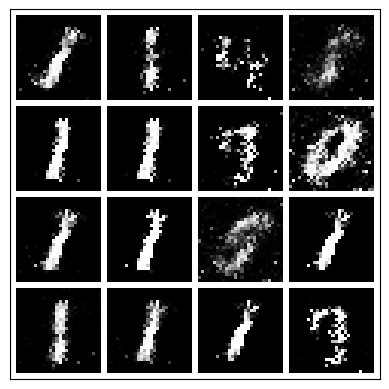

-------------------------------------
                Epoch 4:
                Step: 1000 |
                D_real Loss: 0.4204 |
                D_fake Loss: 0.0378 |
                D_total Loss: 0.4582 |
                G_Loss: 4.174 |
                Real_score 0.800 |
                Fake_score 0.037
            


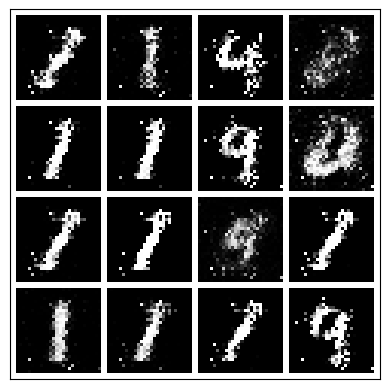

-------------------------------------
                Epoch 4:
                Step: 1500 |
                D_real Loss: 0.3245 |
                D_fake Loss: 0.1302 |
                D_total Loss: 0.4547 |
                G_Loss: 2.890 |
                Real_score 0.814 |
                Fake_score 0.107
            


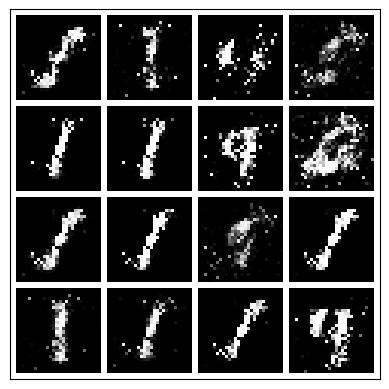

-------------------------------------
                Epoch 4:
                Step: 2000 |
                D_real Loss: 0.0526 |
                D_fake Loss: 0.1183 |
                D_total Loss: 0.1709 |
                G_Loss: 3.222 |
                Real_score 0.962 |
                Fake_score 0.106
            


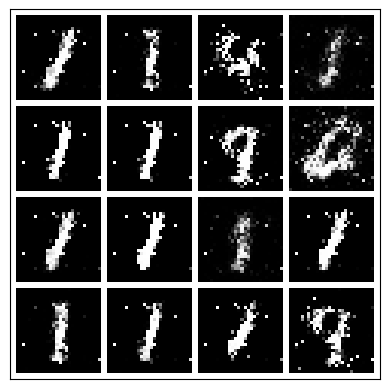

-------------------------------------
                Epoch 4:
                Step: 2500 |
                D_real Loss: 0.2602 |
                D_fake Loss: 0.3013 |
                D_total Loss: 0.5615 |
                G_Loss: 4.209 |
                Real_score 0.858 |
                Fake_score 0.087
            


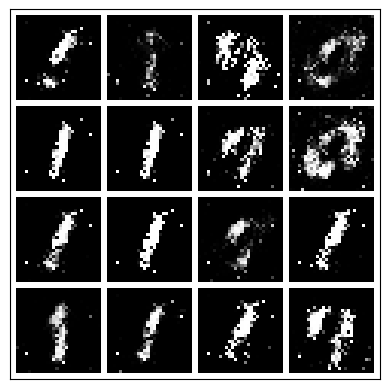

-------------------------------------
                Epoch 4:
                Step: 3000 |
                D_real Loss: 0.1476 |
                D_fake Loss: 0.0660 |
                D_total Loss: 0.2137 |
                G_Loss: 3.343 |
                Real_score 0.884 |
                Fake_score 0.061
            


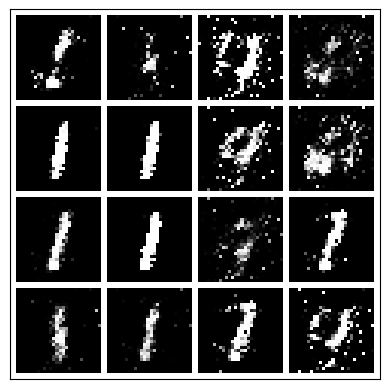

-------------------------------------
                Epoch 4:
                Step: 3500 |
                D_real Loss: 0.2946 |
                D_fake Loss: 0.0313 |
                D_total Loss: 0.3259 |
                G_Loss: 3.338 |
                Real_score 0.844 |
                Fake_score 0.030
            


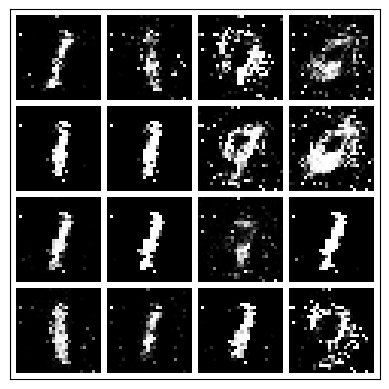

  8%|██████▋                                                                            | 4/50 [04:44<55:23, 72.26s/it]

-------------------------------------
                Epoch 5:
                Step: 0 |
                D_real Loss: 0.3164 |
                D_fake Loss: 0.1692 |
                D_total Loss: 0.4857 |
                G_Loss: 2.781 |
                Real_score 0.826 |
                Fake_score 0.143
            


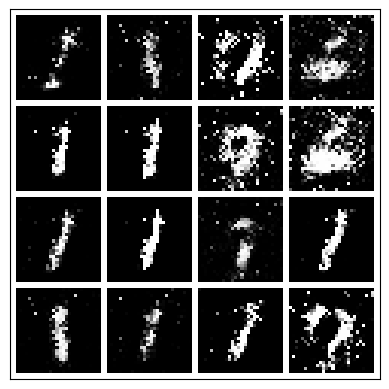

-------------------------------------
                Epoch 5:
                Step: 500 |
                D_real Loss: 0.1346 |
                D_fake Loss: 0.1001 |
                D_total Loss: 0.2347 |
                G_Loss: 2.642 |
                Real_score 0.906 |
                Fake_score 0.086
            


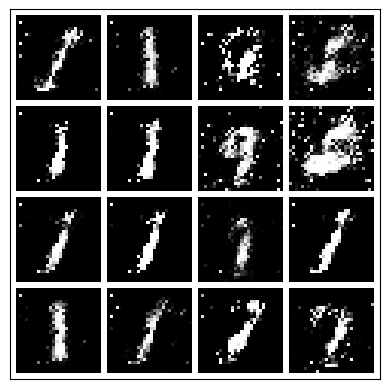

-------------------------------------
                Epoch 5:
                Step: 1000 |
                D_real Loss: 0.1878 |
                D_fake Loss: 0.4752 |
                D_total Loss: 0.6630 |
                G_Loss: 2.224 |
                Real_score 0.878 |
                Fake_score 0.306
            


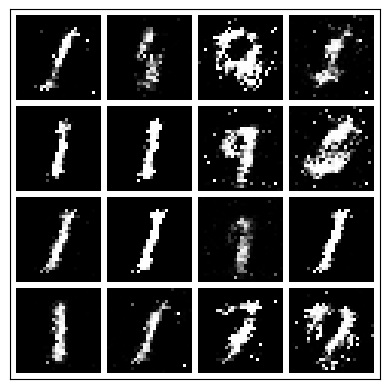

-------------------------------------
                Epoch 5:
                Step: 1500 |
                D_real Loss: 0.6120 |
                D_fake Loss: 0.1899 |
                D_total Loss: 0.8019 |
                G_Loss: 2.439 |
                Real_score 0.697 |
                Fake_score 0.146
            


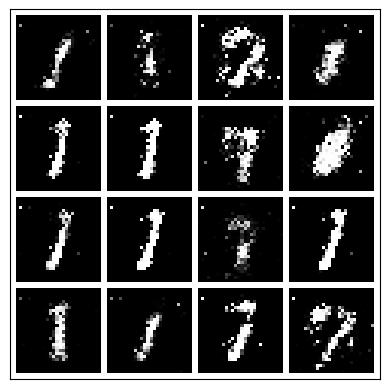

-------------------------------------
                Epoch 5:
                Step: 2000 |
                D_real Loss: 0.2644 |
                D_fake Loss: 0.1219 |
                D_total Loss: 0.3863 |
                G_Loss: 2.866 |
                Real_score 0.867 |
                Fake_score 0.106
            


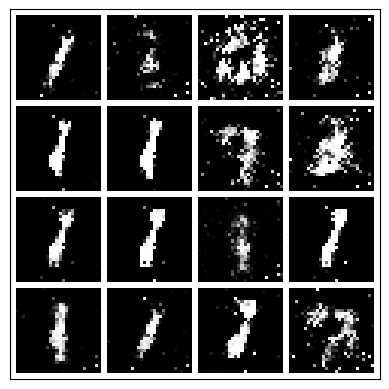

-------------------------------------
                Epoch 5:
                Step: 2500 |
                D_real Loss: 0.2715 |
                D_fake Loss: 0.2032 |
                D_total Loss: 0.4747 |
                G_Loss: 1.620 |
                Real_score 0.830 |
                Fake_score 0.173
            


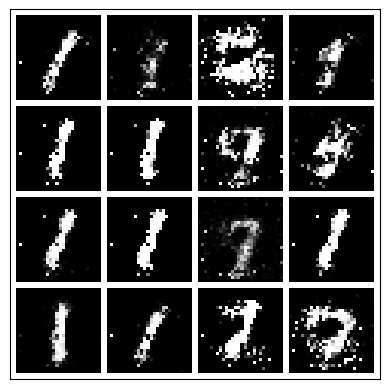

-------------------------------------
                Epoch 5:
                Step: 3000 |
                D_real Loss: 0.3934 |
                D_fake Loss: 0.1870 |
                D_total Loss: 0.5804 |
                G_Loss: 2.637 |
                Real_score 0.836 |
                Fake_score 0.145
            


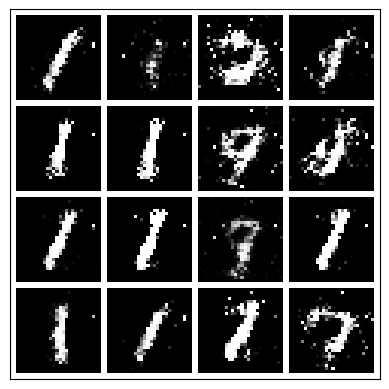

-------------------------------------
                Epoch 5:
                Step: 3500 |
                D_real Loss: 0.1822 |
                D_fake Loss: 0.1462 |
                D_total Loss: 0.3284 |
                G_Loss: 2.242 |
                Real_score 0.901 |
                Fake_score 0.126
            


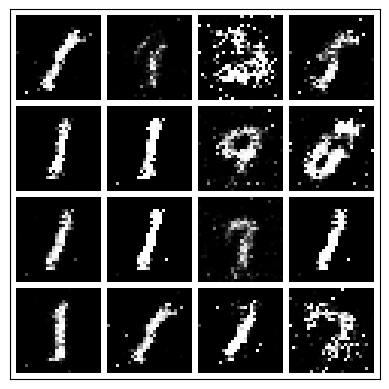

 10%|████████▎                                                                          | 5/50 [05:59<55:04, 73.43s/it]

-------------------------------------
                Epoch 6:
                Step: 0 |
                D_real Loss: 0.3948 |
                D_fake Loss: 0.2448 |
                D_total Loss: 0.6396 |
                G_Loss: 2.090 |
                Real_score 0.813 |
                Fake_score 0.172
            


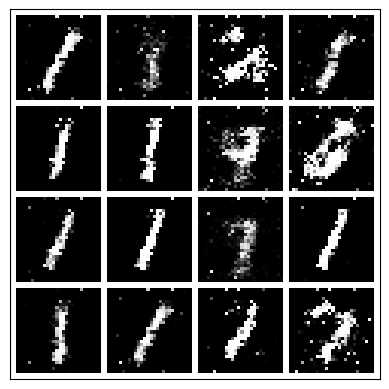

-------------------------------------
                Epoch 6:
                Step: 500 |
                D_real Loss: 0.3488 |
                D_fake Loss: 0.2224 |
                D_total Loss: 0.5712 |
                G_Loss: 1.777 |
                Real_score 0.801 |
                Fake_score 0.191
            


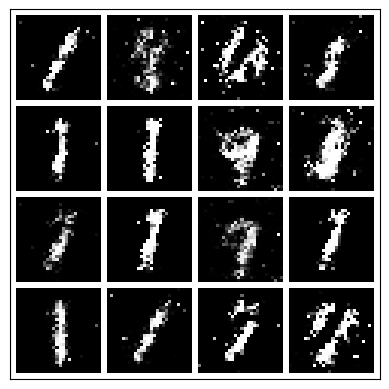

-------------------------------------
                Epoch 6:
                Step: 1000 |
                D_real Loss: 0.6473 |
                D_fake Loss: 0.2646 |
                D_total Loss: 0.9120 |
                G_Loss: 2.064 |
                Real_score 0.656 |
                Fake_score 0.203
            


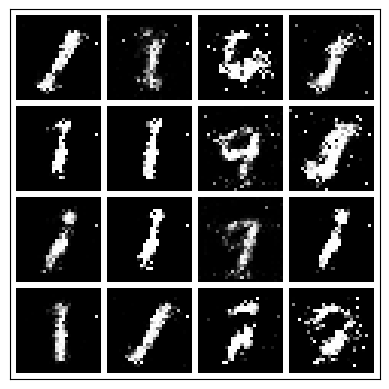

-------------------------------------
                Epoch 6:
                Step: 1500 |
                D_real Loss: 0.3553 |
                D_fake Loss: 0.4298 |
                D_total Loss: 0.7852 |
                G_Loss: 1.252 |
                Real_score 0.754 |
                Fake_score 0.312
            


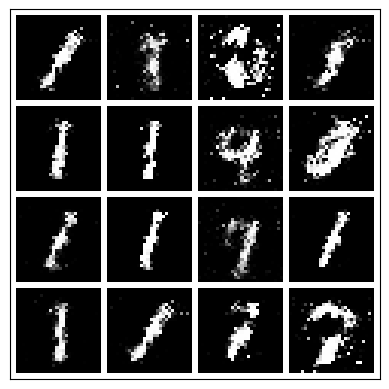

-------------------------------------
                Epoch 6:
                Step: 2000 |
                D_real Loss: 0.2470 |
                D_fake Loss: 0.5667 |
                D_total Loss: 0.8138 |
                G_Loss: 1.679 |
                Real_score 0.869 |
                Fake_score 0.254
            


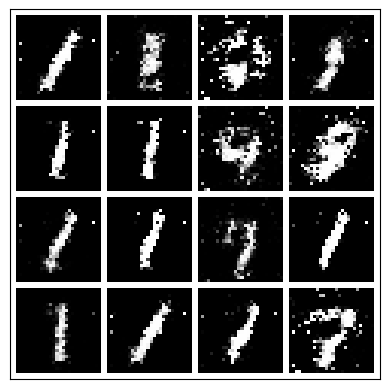

-------------------------------------
                Epoch 6:
                Step: 2500 |
                D_real Loss: 0.3352 |
                D_fake Loss: 0.3744 |
                D_total Loss: 0.7096 |
                G_Loss: 2.327 |
                Real_score 0.822 |
                Fake_score 0.204
            


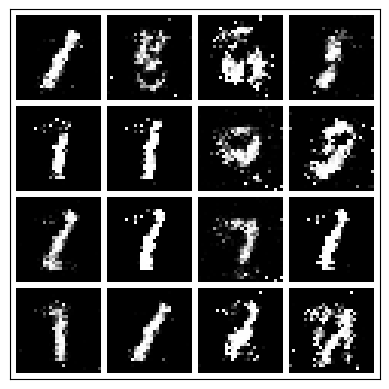

-------------------------------------
                Epoch 6:
                Step: 3000 |
                D_real Loss: 0.5954 |
                D_fake Loss: 0.3124 |
                D_total Loss: 0.9078 |
                G_Loss: 1.628 |
                Real_score 0.665 |
                Fake_score 0.246
            


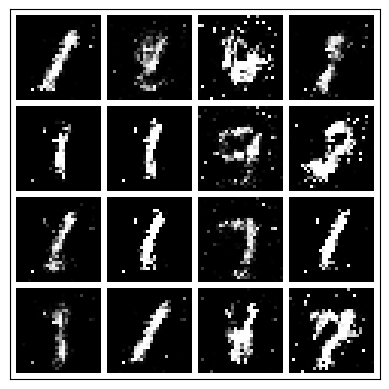

-------------------------------------
                Epoch 6:
                Step: 3500 |
                D_real Loss: 0.2701 |
                D_fake Loss: 0.5054 |
                D_total Loss: 0.7755 |
                G_Loss: 1.812 |
                Real_score 0.830 |
                Fake_score 0.270
            


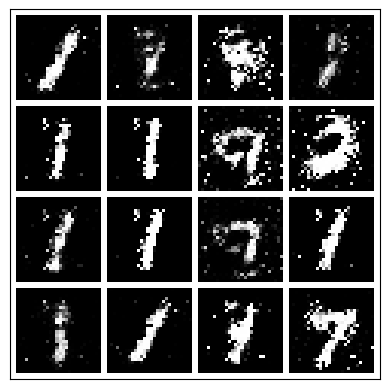

 12%|█████████▉                                                                         | 6/50 [07:19<55:21, 75.49s/it]

-------------------------------------
                Epoch 7:
                Step: 0 |
                D_real Loss: 0.3881 |
                D_fake Loss: 0.1769 |
                D_total Loss: 0.5650 |
                G_Loss: 2.655 |
                Real_score 0.760 |
                Fake_score 0.155
            


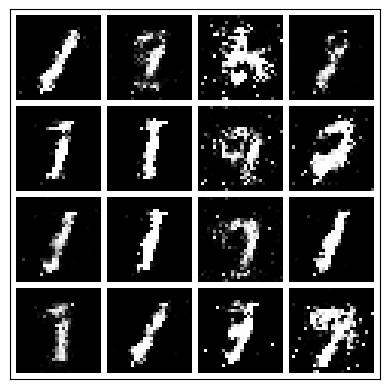

-------------------------------------
                Epoch 7:
                Step: 500 |
                D_real Loss: 0.5664 |
                D_fake Loss: 0.2155 |
                D_total Loss: 0.7819 |
                G_Loss: 2.292 |
                Real_score 0.692 |
                Fake_score 0.181
            


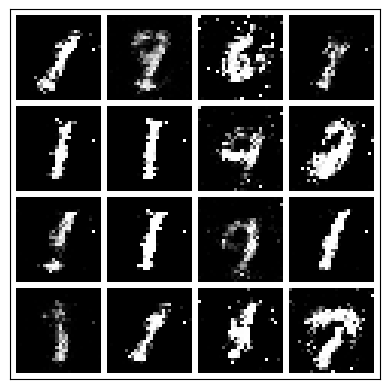

-------------------------------------
                Epoch 7:
                Step: 1000 |
                D_real Loss: 0.3866 |
                D_fake Loss: 0.3525 |
                D_total Loss: 0.7391 |
                G_Loss: 1.983 |
                Real_score 0.825 |
                Fake_score 0.243
            


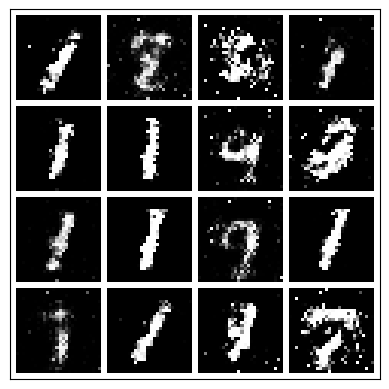

-------------------------------------
                Epoch 7:
                Step: 1500 |
                D_real Loss: 0.4656 |
                D_fake Loss: 0.3293 |
                D_total Loss: 0.7948 |
                G_Loss: 1.764 |
                Real_score 0.716 |
                Fake_score 0.250
            


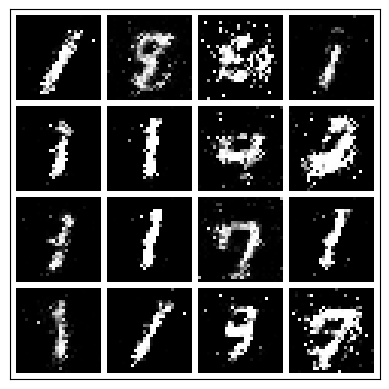

-------------------------------------
                Epoch 7:
                Step: 2000 |
                D_real Loss: 0.9408 |
                D_fake Loss: 0.3268 |
                D_total Loss: 1.2676 |
                G_Loss: 1.250 |
                Real_score 0.545 |
                Fake_score 0.183
            


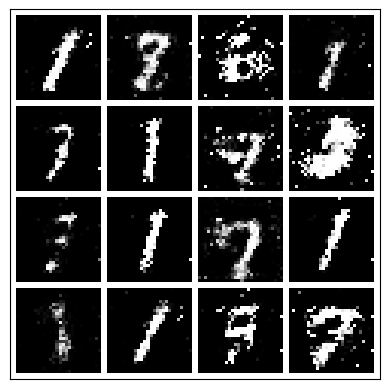

-------------------------------------
                Epoch 7:
                Step: 2500 |
                D_real Loss: 0.3664 |
                D_fake Loss: 0.4877 |
                D_total Loss: 0.8541 |
                G_Loss: 1.963 |
                Real_score 0.777 |
                Fake_score 0.308
            


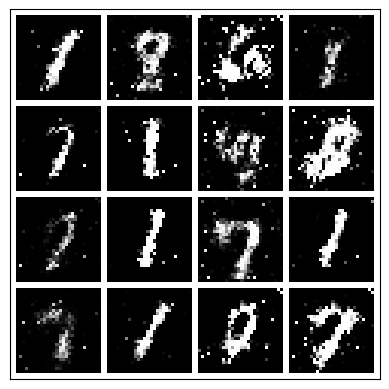

-------------------------------------
                Epoch 7:
                Step: 3000 |
                D_real Loss: 0.2021 |
                D_fake Loss: 0.3016 |
                D_total Loss: 0.5037 |
                G_Loss: 1.838 |
                Real_score 0.860 |
                Fake_score 0.240
            


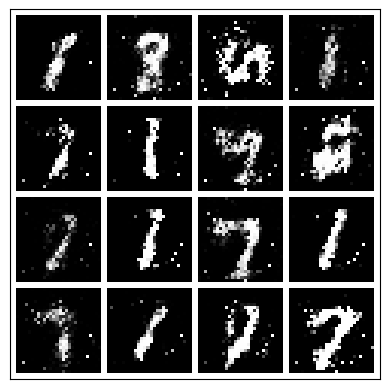

-------------------------------------
                Epoch 7:
                Step: 3500 |
                D_real Loss: 0.2896 |
                D_fake Loss: 0.1636 |
                D_total Loss: 0.4533 |
                G_Loss: 2.248 |
                Real_score 0.811 |
                Fake_score 0.146
            


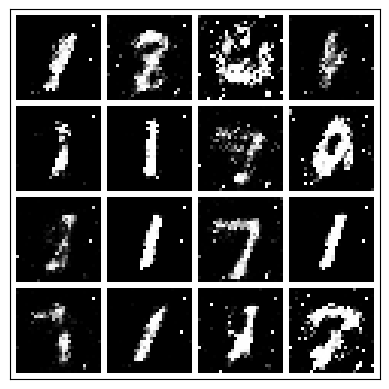

 14%|███████████▌                                                                       | 7/50 [08:38<54:53, 76.60s/it]

-------------------------------------
                Epoch 8:
                Step: 0 |
                D_real Loss: 0.4343 |
                D_fake Loss: 0.4654 |
                D_total Loss: 0.8997 |
                G_Loss: 1.684 |
                Real_score 0.726 |
                Fake_score 0.273
            


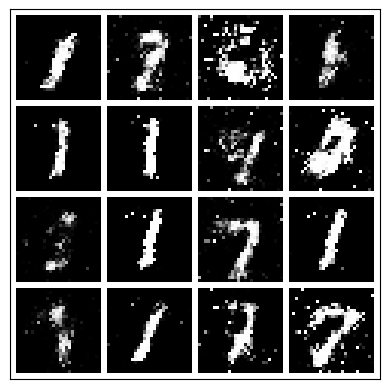

-------------------------------------
                Epoch 8:
                Step: 500 |
                D_real Loss: 0.1774 |
                D_fake Loss: 0.2295 |
                D_total Loss: 0.4069 |
                G_Loss: 1.951 |
                Real_score 0.850 |
                Fake_score 0.197
            


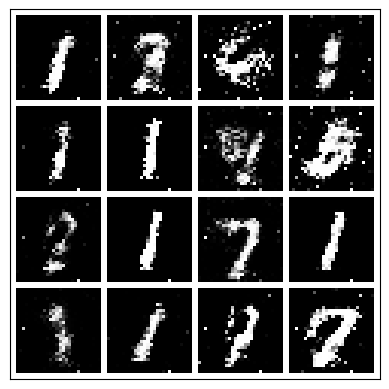

-------------------------------------
                Epoch 8:
                Step: 1000 |
                D_real Loss: 0.2661 |
                D_fake Loss: 0.3941 |
                D_total Loss: 0.6602 |
                G_Loss: 1.748 |
                Real_score 0.818 |
                Fake_score 0.278
            


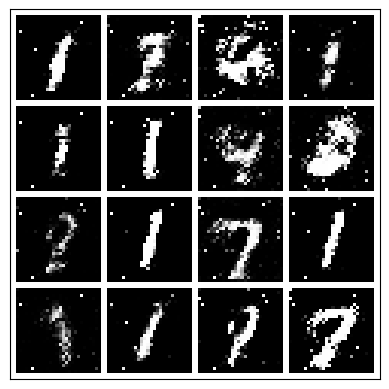

-------------------------------------
                Epoch 8:
                Step: 1500 |
                D_real Loss: 0.2686 |
                D_fake Loss: 0.4257 |
                D_total Loss: 0.6943 |
                G_Loss: 1.665 |
                Real_score 0.807 |
                Fake_score 0.286
            


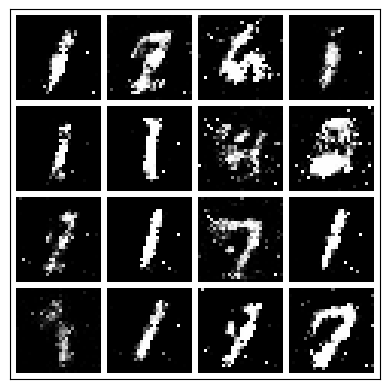

-------------------------------------
                Epoch 8:
                Step: 2000 |
                D_real Loss: 0.4876 |
                D_fake Loss: 0.5070 |
                D_total Loss: 0.9946 |
                G_Loss: 1.300 |
                Real_score 0.689 |
                Fake_score 0.273
            


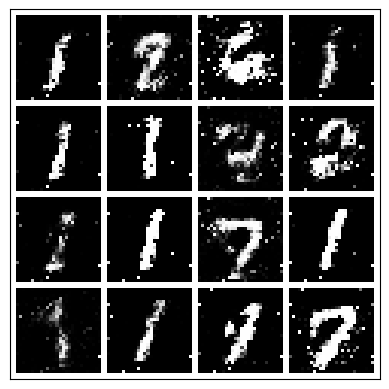

-------------------------------------
                Epoch 8:
                Step: 2500 |
                D_real Loss: 0.7996 |
                D_fake Loss: 0.2718 |
                D_total Loss: 1.0714 |
                G_Loss: 1.320 |
                Real_score 0.588 |
                Fake_score 0.223
            


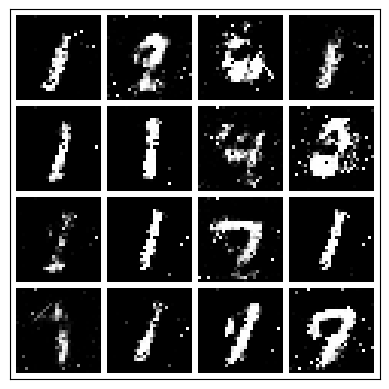

-------------------------------------
                Epoch 8:
                Step: 3000 |
                D_real Loss: 0.1565 |
                D_fake Loss: 0.3763 |
                D_total Loss: 0.5328 |
                G_Loss: 1.819 |
                Real_score 0.873 |
                Fake_score 0.245
            


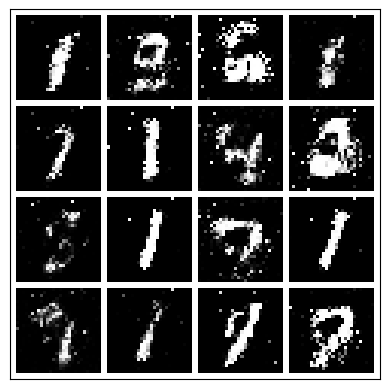

-------------------------------------
                Epoch 8:
                Step: 3500 |
                D_real Loss: 0.4867 |
                D_fake Loss: 0.3486 |
                D_total Loss: 0.8353 |
                G_Loss: 1.833 |
                Real_score 0.738 |
                Fake_score 0.256
            


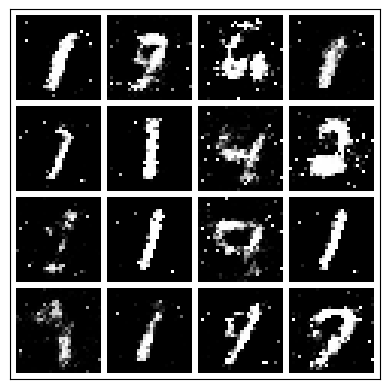

 16%|█████████████▎                                                                     | 8/50 [09:54<53:31, 76.48s/it]

-------------------------------------
                Epoch 9:
                Step: 0 |
                D_real Loss: 0.4031 |
                D_fake Loss: 0.2526 |
                D_total Loss: 0.6558 |
                G_Loss: 2.277 |
                Real_score 0.759 |
                Fake_score 0.209
            


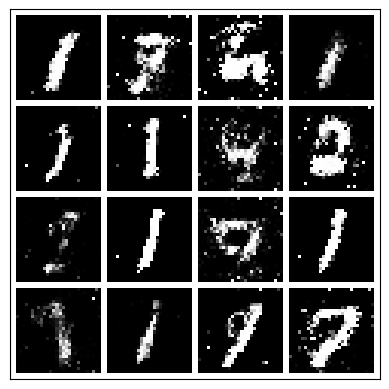

-------------------------------------
                Epoch 9:
                Step: 500 |
                D_real Loss: 0.6798 |
                D_fake Loss: 0.1823 |
                D_total Loss: 0.8620 |
                G_Loss: 1.617 |
                Real_score 0.612 |
                Fake_score 0.161
            


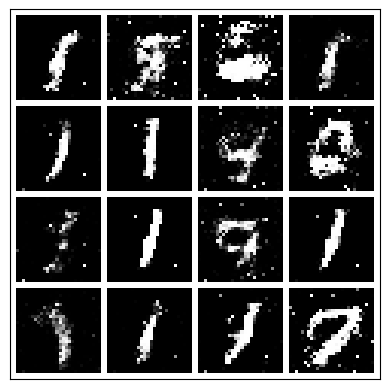

-------------------------------------
                Epoch 9:
                Step: 1000 |
                D_real Loss: 0.2309 |
                D_fake Loss: 0.5909 |
                D_total Loss: 0.8218 |
                G_Loss: 1.554 |
                Real_score 0.846 |
                Fake_score 0.371
            


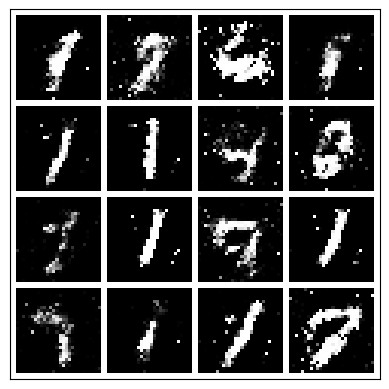

-------------------------------------
                Epoch 9:
                Step: 1500 |
                D_real Loss: 0.5646 |
                D_fake Loss: 0.4232 |
                D_total Loss: 0.9879 |
                G_Loss: 1.265 |
                Real_score 0.607 |
                Fake_score 0.323
            


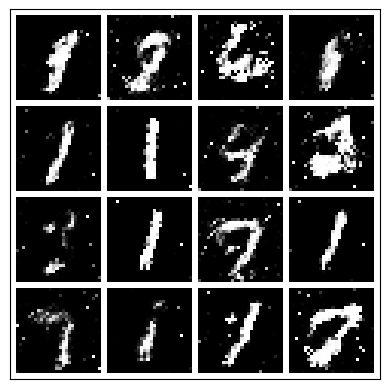

-------------------------------------
                Epoch 9:
                Step: 2000 |
                D_real Loss: 0.5202 |
                D_fake Loss: 0.2500 |
                D_total Loss: 0.7702 |
                G_Loss: 1.532 |
                Real_score 0.688 |
                Fake_score 0.209
            


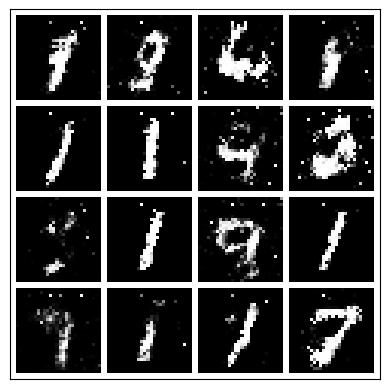

-------------------------------------
                Epoch 9:
                Step: 2500 |
                D_real Loss: 0.4126 |
                D_fake Loss: 0.5747 |
                D_total Loss: 0.9873 |
                G_Loss: 1.251 |
                Real_score 0.766 |
                Fake_score 0.366
            


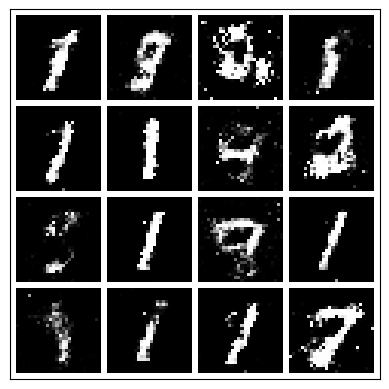

-------------------------------------
                Epoch 9:
                Step: 3000 |
                D_real Loss: 0.4341 |
                D_fake Loss: 0.2874 |
                D_total Loss: 0.7215 |
                G_Loss: 2.086 |
                Real_score 0.727 |
                Fake_score 0.209
            


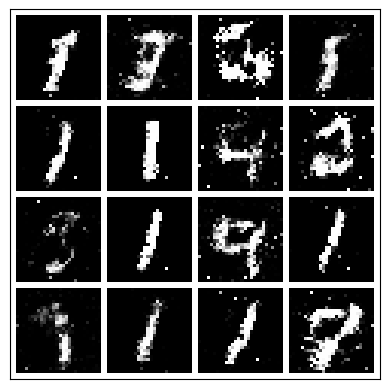

-------------------------------------
                Epoch 9:
                Step: 3500 |
                D_real Loss: 0.3828 |
                D_fake Loss: 0.4402 |
                D_total Loss: 0.8229 |
                G_Loss: 1.635 |
                Real_score 0.757 |
                Fake_score 0.280
            


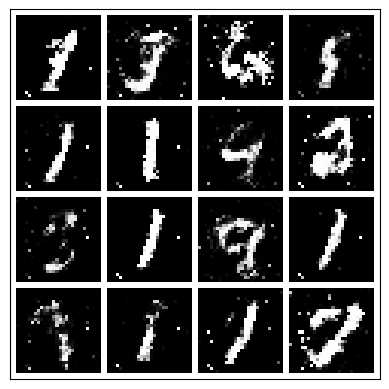

 18%|██████████████▉                                                                    | 9/50 [11:15<53:09, 77.80s/it]

-------------------------------------
                Epoch 10:
                Step: 0 |
                D_real Loss: 0.2499 |
                D_fake Loss: 0.8381 |
                D_total Loss: 1.0881 |
                G_Loss: 1.397 |
                Real_score 0.839 |
                Fake_score 0.444
            


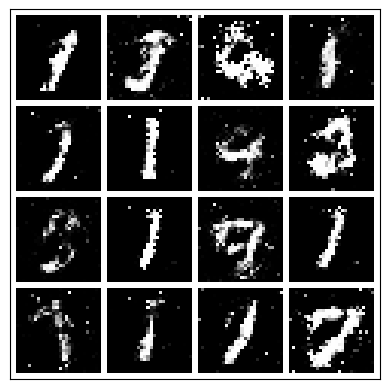

-------------------------------------
                Epoch 10:
                Step: 500 |
                D_real Loss: 0.7784 |
                D_fake Loss: 0.1931 |
                D_total Loss: 0.9715 |
                G_Loss: 2.462 |
                Real_score 0.586 |
                Fake_score 0.166
            


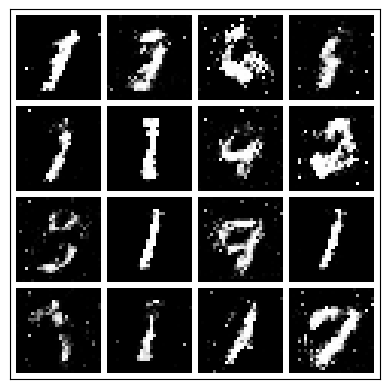

-------------------------------------
                Epoch 10:
                Step: 1000 |
                D_real Loss: 0.3810 |
                D_fake Loss: 0.5826 |
                D_total Loss: 0.9636 |
                G_Loss: 1.417 |
                Real_score 0.778 |
                Fake_score 0.342
            


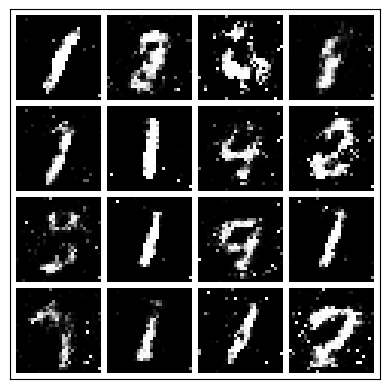

-------------------------------------
                Epoch 10:
                Step: 1500 |
                D_real Loss: 0.3208 |
                D_fake Loss: 0.5300 |
                D_total Loss: 0.8509 |
                G_Loss: 1.613 |
                Real_score 0.762 |
                Fake_score 0.305
            


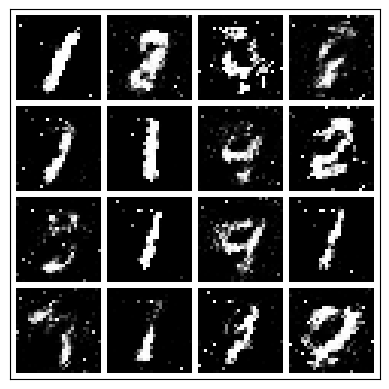

-------------------------------------
                Epoch 10:
                Step: 2000 |
                D_real Loss: 1.0902 |
                D_fake Loss: 0.2044 |
                D_total Loss: 1.2945 |
                G_Loss: 2.264 |
                Real_score 0.536 |
                Fake_score 0.178
            


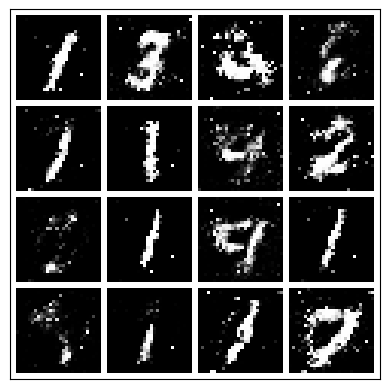

-------------------------------------
                Epoch 10:
                Step: 2500 |
                D_real Loss: 0.2531 |
                D_fake Loss: 0.4173 |
                D_total Loss: 0.6705 |
                G_Loss: 1.678 |
                Real_score 0.827 |
                Fake_score 0.291
            


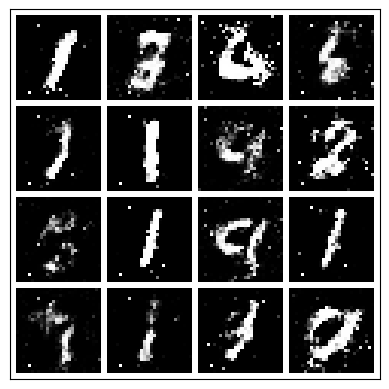

-------------------------------------
                Epoch 10:
                Step: 3000 |
                D_real Loss: 0.2239 |
                D_fake Loss: 0.2236 |
                D_total Loss: 0.4476 |
                G_Loss: 2.219 |
                Real_score 0.832 |
                Fake_score 0.190
            


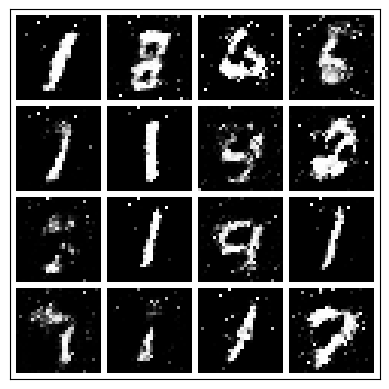

-------------------------------------
                Epoch 10:
                Step: 3500 |
                D_real Loss: 0.5570 |
                D_fake Loss: 0.3629 |
                D_total Loss: 0.9199 |
                G_Loss: 1.656 |
                Real_score 0.657 |
                Fake_score 0.278
            


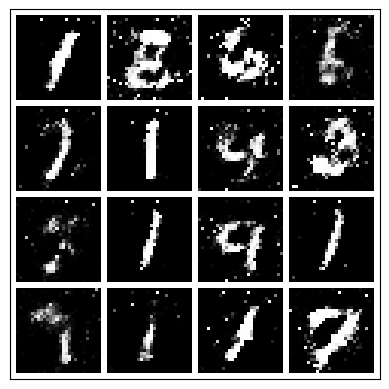

 20%|████████████████▍                                                                 | 10/50 [12:31<51:31, 77.29s/it]

-------------------------------------
                Epoch 11:
                Step: 0 |
                D_real Loss: 0.4177 |
                D_fake Loss: 0.9591 |
                D_total Loss: 1.3768 |
                G_Loss: 1.244 |
                Real_score 0.743 |
                Fake_score 0.435
            


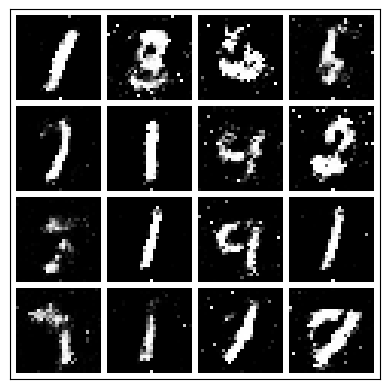

-------------------------------------
                Epoch 11:
                Step: 500 |
                D_real Loss: 0.3582 |
                D_fake Loss: 0.4417 |
                D_total Loss: 0.7999 |
                G_Loss: 1.665 |
                Real_score 0.780 |
                Fake_score 0.319
            


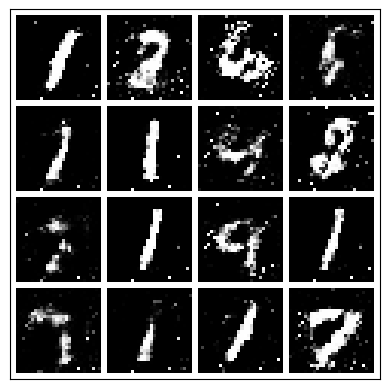

-------------------------------------
                Epoch 11:
                Step: 1000 |
                D_real Loss: 0.6535 |
                D_fake Loss: 0.5080 |
                D_total Loss: 1.1615 |
                G_Loss: 1.147 |
                Real_score 0.643 |
                Fake_score 0.329
            


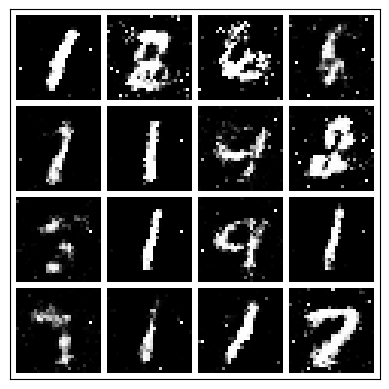

-------------------------------------
                Epoch 11:
                Step: 1500 |
                D_real Loss: 0.2816 |
                D_fake Loss: 0.4255 |
                D_total Loss: 0.7071 |
                G_Loss: 1.410 |
                Real_score 0.811 |
                Fake_score 0.325
            


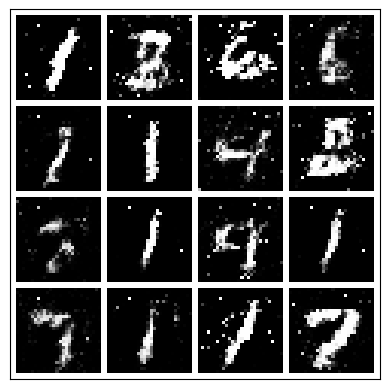

-------------------------------------
                Epoch 11:
                Step: 2000 |
                D_real Loss: 0.3260 |
                D_fake Loss: 0.4726 |
                D_total Loss: 0.7986 |
                G_Loss: 1.326 |
                Real_score 0.757 |
                Fake_score 0.337
            


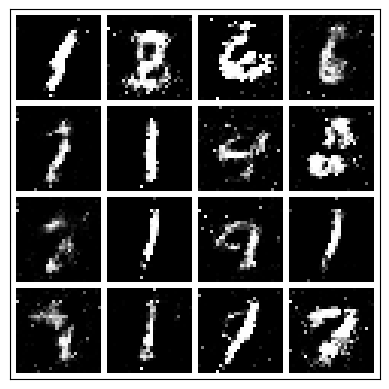

-------------------------------------
                Epoch 11:
                Step: 2500 |
                D_real Loss: 0.4998 |
                D_fake Loss: 0.3133 |
                D_total Loss: 0.8131 |
                G_Loss: 1.708 |
                Real_score 0.705 |
                Fake_score 0.224
            


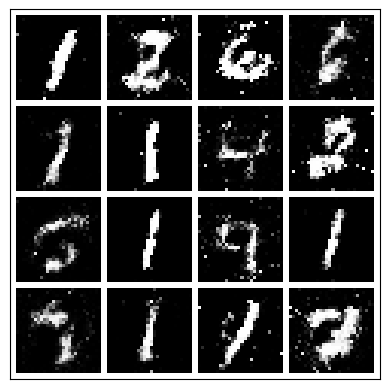

-------------------------------------
                Epoch 11:
                Step: 3000 |
                D_real Loss: 0.5464 |
                D_fake Loss: 0.4932 |
                D_total Loss: 1.0395 |
                G_Loss: 1.160 |
                Real_score 0.664 |
                Fake_score 0.330
            


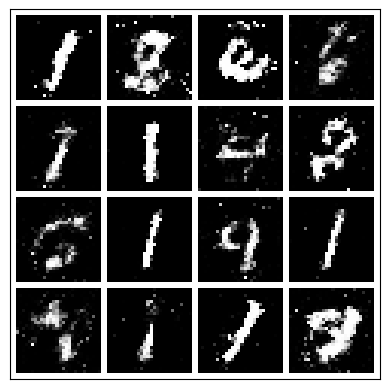

-------------------------------------
                Epoch 11:
                Step: 3500 |
                D_real Loss: 0.0677 |
                D_fake Loss: 0.3832 |
                D_total Loss: 0.4509 |
                G_Loss: 1.436 |
                Real_score 0.939 |
                Fake_score 0.301
            


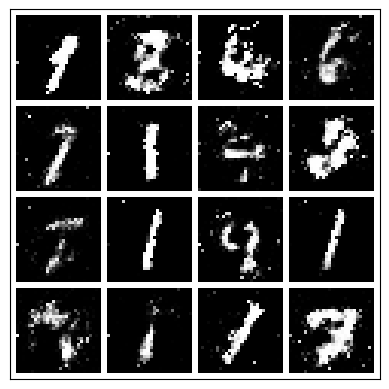

 22%|██████████████████                                                                | 11/50 [13:34<47:27, 73.01s/it]

-------------------------------------
                Epoch 12:
                Step: 0 |
                D_real Loss: 0.3591 |
                D_fake Loss: 0.3788 |
                D_total Loss: 0.7379 |
                G_Loss: 1.396 |
                Real_score 0.786 |
                Fake_score 0.287
            


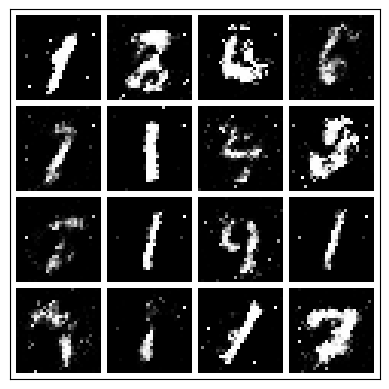

-------------------------------------
                Epoch 12:
                Step: 500 |
                D_real Loss: 0.4225 |
                D_fake Loss: 0.3873 |
                D_total Loss: 0.8099 |
                G_Loss: 1.174 |
                Real_score 0.696 |
                Fake_score 0.301
            


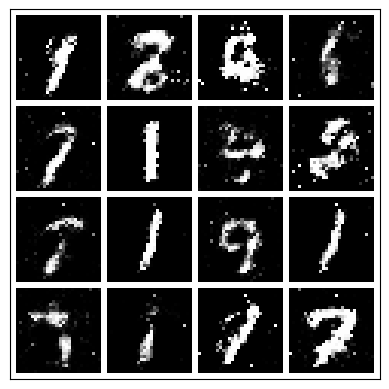

-------------------------------------
                Epoch 12:
                Step: 1000 |
                D_real Loss: 0.3037 |
                D_fake Loss: 0.3658 |
                D_total Loss: 0.6695 |
                G_Loss: 1.630 |
                Real_score 0.809 |
                Fake_score 0.273
            


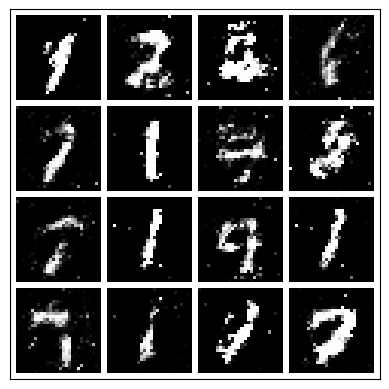

-------------------------------------
                Epoch 12:
                Step: 1500 |
                D_real Loss: 0.2596 |
                D_fake Loss: 0.4911 |
                D_total Loss: 0.7507 |
                G_Loss: 1.720 |
                Real_score 0.806 |
                Fake_score 0.336
            


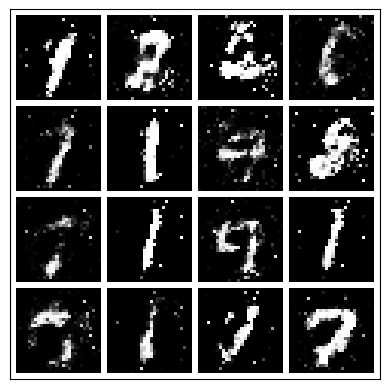

-------------------------------------
                Epoch 12:
                Step: 2000 |
                D_real Loss: 0.7850 |
                D_fake Loss: 0.2254 |
                D_total Loss: 1.0104 |
                G_Loss: 1.539 |
                Real_score 0.559 |
                Fake_score 0.194
            


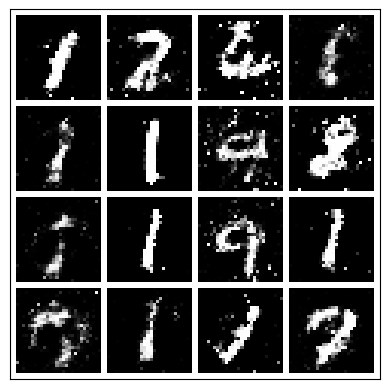

-------------------------------------
                Epoch 12:
                Step: 2500 |
                D_real Loss: 0.6301 |
                D_fake Loss: 0.3830 |
                D_total Loss: 1.0131 |
                G_Loss: 1.156 |
                Real_score 0.637 |
                Fake_score 0.268
            


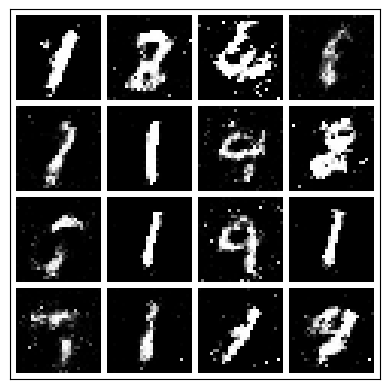

-------------------------------------
                Epoch 12:
                Step: 3000 |
                D_real Loss: 0.5370 |
                D_fake Loss: 0.3337 |
                D_total Loss: 0.8707 |
                G_Loss: 1.682 |
                Real_score 0.655 |
                Fake_score 0.260
            


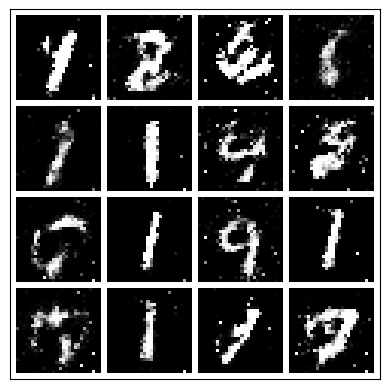

-------------------------------------
                Epoch 12:
                Step: 3500 |
                D_real Loss: 0.4219 |
                D_fake Loss: 0.3575 |
                D_total Loss: 0.7794 |
                G_Loss: 1.267 |
                Real_score 0.717 |
                Fake_score 0.280
            


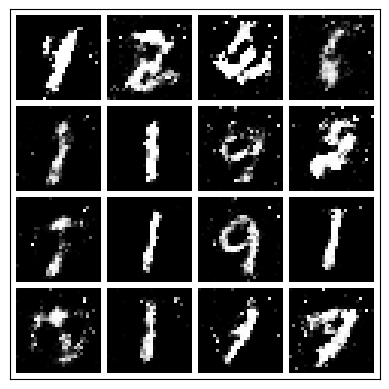

 24%|███████████████████▋                                                              | 12/50 [14:37<44:20, 70.02s/it]

-------------------------------------
                Epoch 13:
                Step: 0 |
                D_real Loss: 0.3871 |
                D_fake Loss: 0.4098 |
                D_total Loss: 0.7969 |
                G_Loss: 1.437 |
                Real_score 0.751 |
                Fake_score 0.264
            


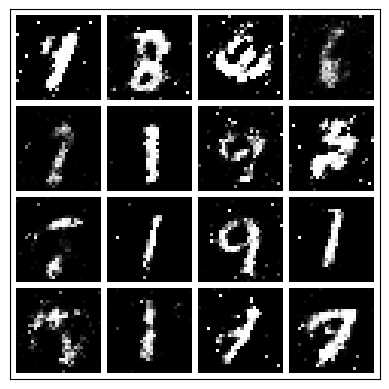

-------------------------------------
                Epoch 13:
                Step: 500 |
                D_real Loss: 0.5892 |
                D_fake Loss: 0.4691 |
                D_total Loss: 1.0583 |
                G_Loss: 1.204 |
                Real_score 0.650 |
                Fake_score 0.334
            


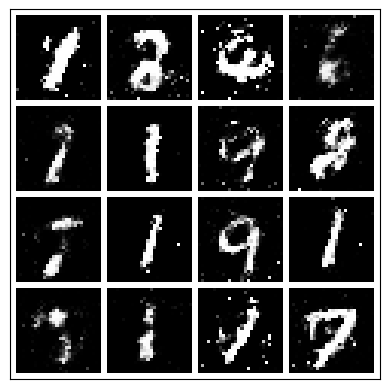

-------------------------------------
                Epoch 13:
                Step: 1000 |
                D_real Loss: 0.6571 |
                D_fake Loss: 0.1948 |
                D_total Loss: 0.8519 |
                G_Loss: 1.954 |
                Real_score 0.664 |
                Fake_score 0.172
            


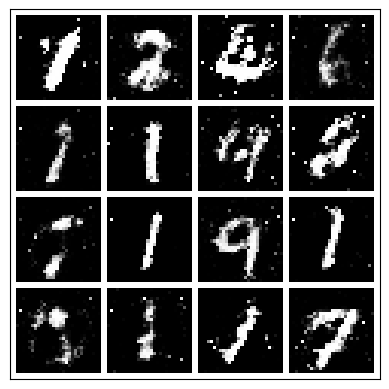

-------------------------------------
                Epoch 13:
                Step: 1500 |
                D_real Loss: 0.4986 |
                D_fake Loss: 0.2438 |
                D_total Loss: 0.7424 |
                G_Loss: 1.852 |
                Real_score 0.666 |
                Fake_score 0.212
            


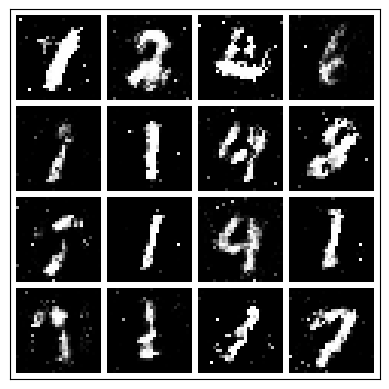

-------------------------------------
                Epoch 13:
                Step: 2000 |
                D_real Loss: 0.3621 |
                D_fake Loss: 0.5897 |
                D_total Loss: 0.9518 |
                G_Loss: 1.198 |
                Real_score 0.753 |
                Fake_score 0.373
            


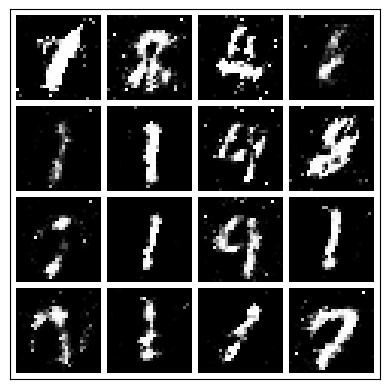

-------------------------------------
                Epoch 13:
                Step: 2500 |
                D_real Loss: 0.6928 |
                D_fake Loss: 0.3050 |
                D_total Loss: 0.9977 |
                G_Loss: 1.327 |
                Real_score 0.587 |
                Fake_score 0.246
            


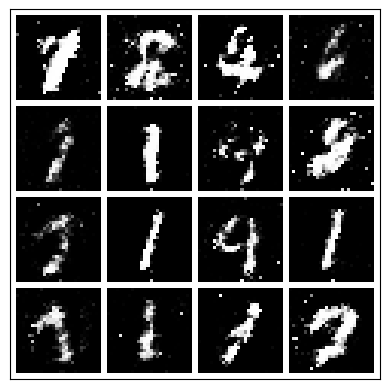

-------------------------------------
                Epoch 13:
                Step: 3000 |
                D_real Loss: 0.6581 |
                D_fake Loss: 0.4960 |
                D_total Loss: 1.1541 |
                G_Loss: 1.206 |
                Real_score 0.578 |
                Fake_score 0.352
            


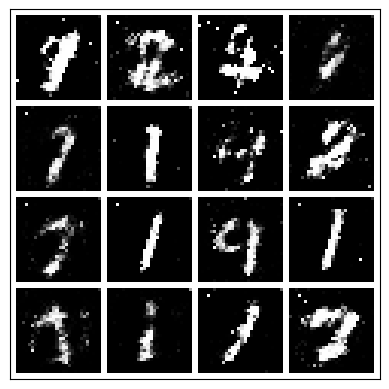

-------------------------------------
                Epoch 13:
                Step: 3500 |
                D_real Loss: 0.5636 |
                D_fake Loss: 0.4251 |
                D_total Loss: 0.9887 |
                G_Loss: 1.094 |
                Real_score 0.662 |
                Fake_score 0.319
            


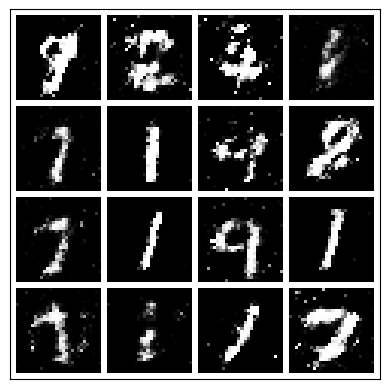

 26%|█████████████████████▎                                                            | 13/50 [15:40<41:52, 67.90s/it]

-------------------------------------
                Epoch 14:
                Step: 0 |
                D_real Loss: 0.4867 |
                D_fake Loss: 0.6534 |
                D_total Loss: 1.1401 |
                G_Loss: 1.349 |
                Real_score 0.693 |
                Fake_score 0.348
            


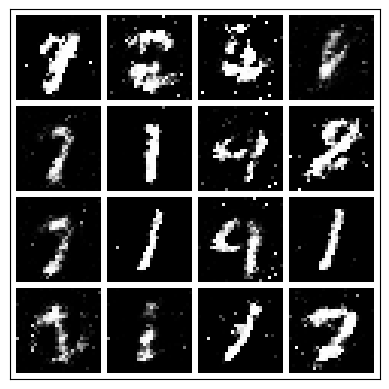

-------------------------------------
                Epoch 14:
                Step: 500 |
                D_real Loss: 0.2707 |
                D_fake Loss: 0.4499 |
                D_total Loss: 0.7206 |
                G_Loss: 1.116 |
                Real_score 0.800 |
                Fake_score 0.333
            


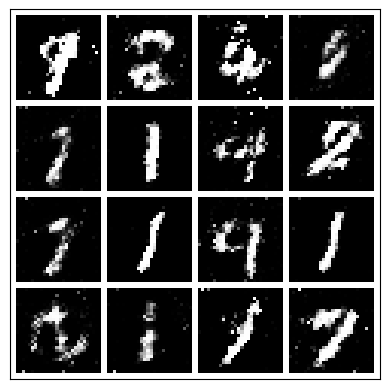

-------------------------------------
                Epoch 14:
                Step: 1000 |
                D_real Loss: 0.6219 |
                D_fake Loss: 0.3326 |
                D_total Loss: 0.9544 |
                G_Loss: 1.209 |
                Real_score 0.650 |
                Fake_score 0.275
            


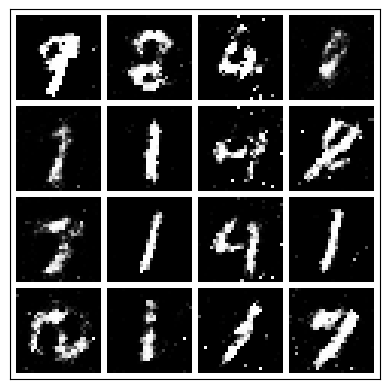

-------------------------------------
                Epoch 14:
                Step: 1500 |
                D_real Loss: 0.5926 |
                D_fake Loss: 0.3125 |
                D_total Loss: 0.9051 |
                G_Loss: 1.556 |
                Real_score 0.644 |
                Fake_score 0.264
            


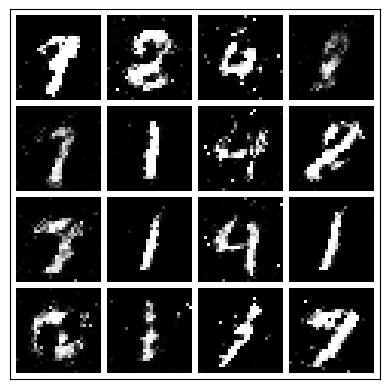

-------------------------------------
                Epoch 14:
                Step: 2000 |
                D_real Loss: 0.6562 |
                D_fake Loss: 0.2665 |
                D_total Loss: 0.9227 |
                G_Loss: 1.473 |
                Real_score 0.618 |
                Fake_score 0.222
            


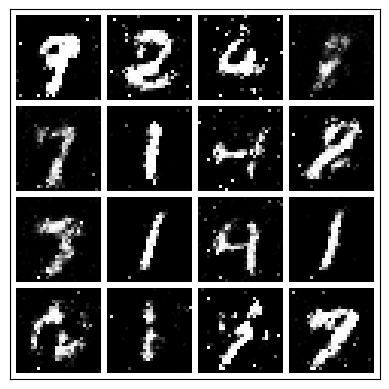

-------------------------------------
                Epoch 14:
                Step: 2500 |
                D_real Loss: 0.5758 |
                D_fake Loss: 0.2953 |
                D_total Loss: 0.8711 |
                G_Loss: 1.661 |
                Real_score 0.635 |
                Fake_score 0.230
            


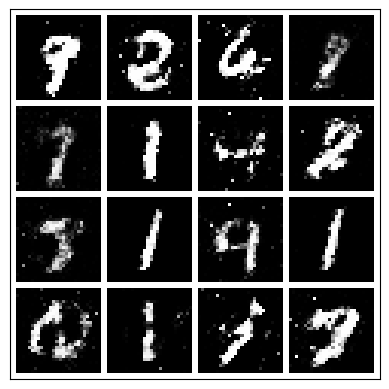

-------------------------------------
                Epoch 14:
                Step: 3000 |
                D_real Loss: 0.8103 |
                D_fake Loss: 0.3256 |
                D_total Loss: 1.1360 |
                G_Loss: 1.568 |
                Real_score 0.548 |
                Fake_score 0.248
            


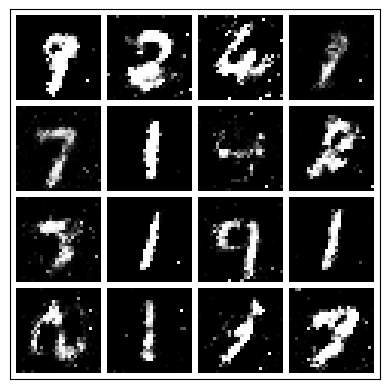

-------------------------------------
                Epoch 14:
                Step: 3500 |
                D_real Loss: 0.4420 |
                D_fake Loss: 0.4672 |
                D_total Loss: 0.9092 |
                G_Loss: 1.105 |
                Real_score 0.688 |
                Fake_score 0.350
            


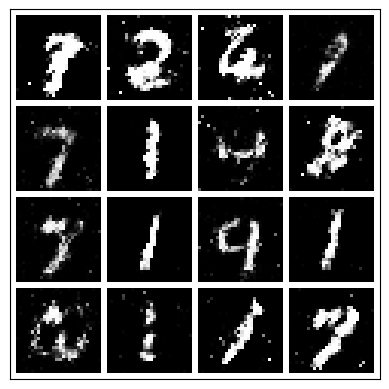

 28%|██████████████████████▉                                                           | 14/50 [16:44<39:58, 66.61s/it]

-------------------------------------
                Epoch 15:
                Step: 0 |
                D_real Loss: 0.3586 |
                D_fake Loss: 0.4551 |
                D_total Loss: 0.8137 |
                G_Loss: 1.199 |
                Real_score 0.742 |
                Fake_score 0.348
            


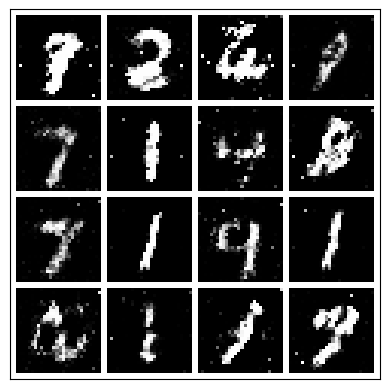

-------------------------------------
                Epoch 15:
                Step: 500 |
                D_real Loss: 0.4349 |
                D_fake Loss: 0.5168 |
                D_total Loss: 0.9517 |
                G_Loss: 1.204 |
                Real_score 0.742 |
                Fake_score 0.369
            


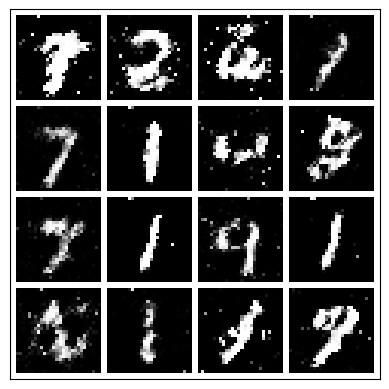

-------------------------------------
                Epoch 15:
                Step: 1000 |
                D_real Loss: 0.5627 |
                D_fake Loss: 0.2991 |
                D_total Loss: 0.8618 |
                G_Loss: 1.407 |
                Real_score 0.635 |
                Fake_score 0.245
            


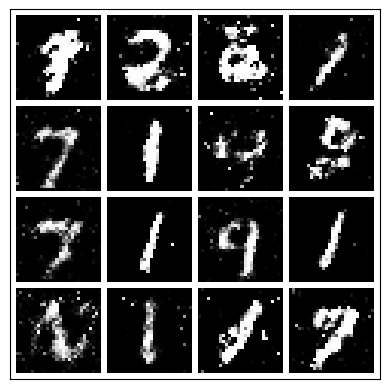

-------------------------------------
                Epoch 15:
                Step: 1500 |
                D_real Loss: 0.4684 |
                D_fake Loss: 0.3934 |
                D_total Loss: 0.8618 |
                G_Loss: 1.291 |
                Real_score 0.704 |
                Fake_score 0.297
            


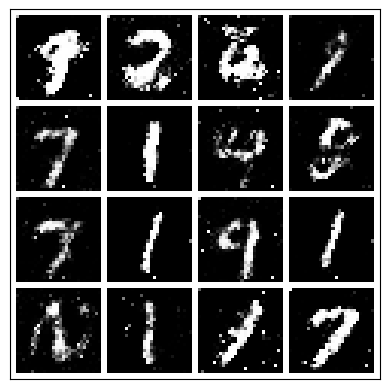

-------------------------------------
                Epoch 15:
                Step: 2000 |
                D_real Loss: 0.6963 |
                D_fake Loss: 0.3672 |
                D_total Loss: 1.0635 |
                G_Loss: 1.364 |
                Real_score 0.613 |
                Fake_score 0.294
            


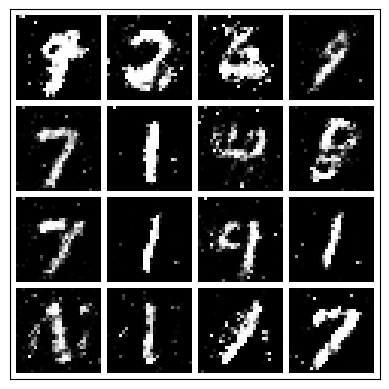

-------------------------------------
                Epoch 15:
                Step: 2500 |
                D_real Loss: 0.2971 |
                D_fake Loss: 0.7566 |
                D_total Loss: 1.0537 |
                G_Loss: 1.059 |
                Real_score 0.803 |
                Fake_score 0.465
            


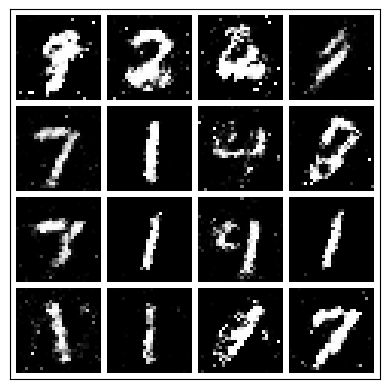

-------------------------------------
                Epoch 15:
                Step: 3000 |
                D_real Loss: 0.5783 |
                D_fake Loss: 0.5566 |
                D_total Loss: 1.1349 |
                G_Loss: 1.141 |
                Real_score 0.631 |
                Fake_score 0.353
            


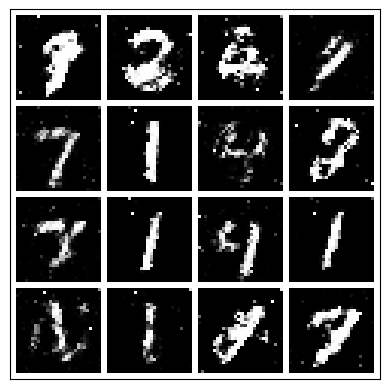

-------------------------------------
                Epoch 15:
                Step: 3500 |
                D_real Loss: 0.4303 |
                D_fake Loss: 0.7383 |
                D_total Loss: 1.1686 |
                G_Loss: 1.323 |
                Real_score 0.702 |
                Fake_score 0.392
            


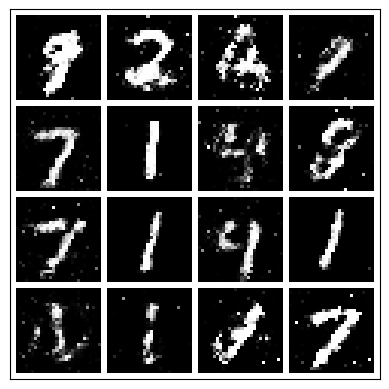

 30%|████████████████████████▌                                                         | 15/50 [17:48<38:27, 65.94s/it]

-------------------------------------
                Epoch 16:
                Step: 0 |
                D_real Loss: 0.2248 |
                D_fake Loss: 0.5556 |
                D_total Loss: 0.7804 |
                G_Loss: 1.305 |
                Real_score 0.818 |
                Fake_score 0.370
            


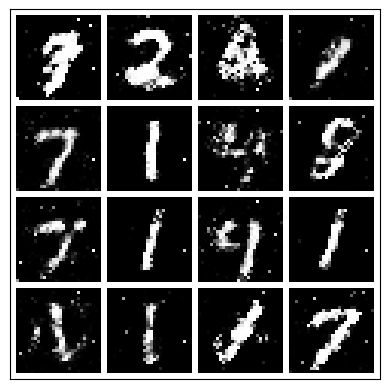

-------------------------------------
                Epoch 16:
                Step: 500 |
                D_real Loss: 0.4801 |
                D_fake Loss: 0.3135 |
                D_total Loss: 0.7936 |
                G_Loss: 1.065 |
                Real_score 0.719 |
                Fake_score 0.261
            


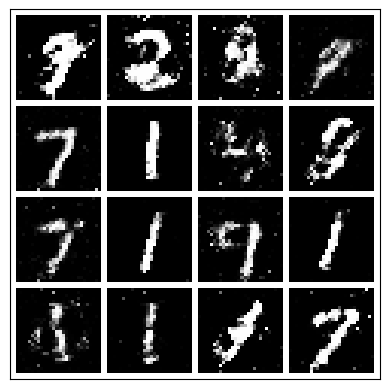

-------------------------------------
                Epoch 16:
                Step: 1000 |
                D_real Loss: 0.4352 |
                D_fake Loss: 0.6389 |
                D_total Loss: 1.0742 |
                G_Loss: 1.293 |
                Real_score 0.709 |
                Fake_score 0.390
            


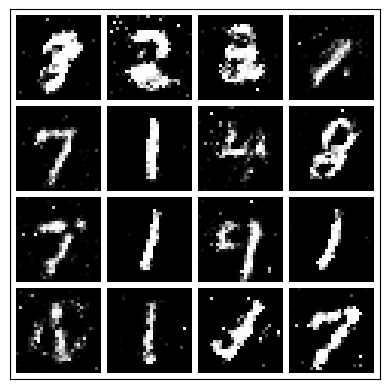

-------------------------------------
                Epoch 16:
                Step: 1500 |
                D_real Loss: 0.4259 |
                D_fake Loss: 0.4525 |
                D_total Loss: 0.8784 |
                G_Loss: 1.270 |
                Real_score 0.717 |
                Fake_score 0.328
            


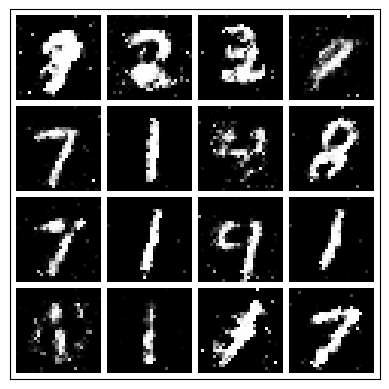

-------------------------------------
                Epoch 16:
                Step: 2000 |
                D_real Loss: 0.5085 |
                D_fake Loss: 0.2198 |
                D_total Loss: 0.7283 |
                G_Loss: 1.755 |
                Real_score 0.672 |
                Fake_score 0.190
            


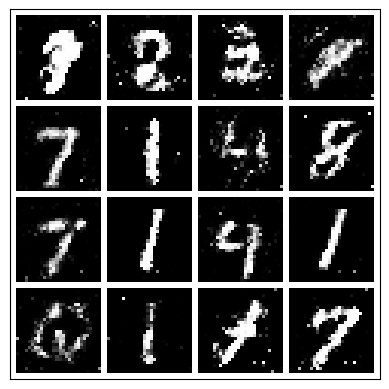

-------------------------------------
                Epoch 16:
                Step: 2500 |
                D_real Loss: 0.5643 |
                D_fake Loss: 0.3281 |
                D_total Loss: 0.8924 |
                G_Loss: 1.247 |
                Real_score 0.640 |
                Fake_score 0.270
            


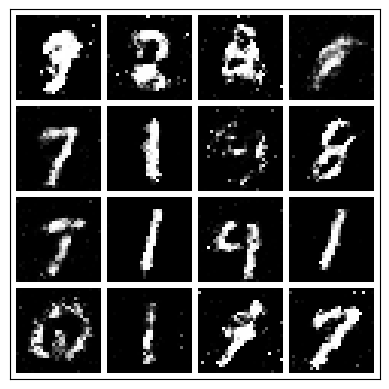

-------------------------------------
                Epoch 16:
                Step: 3000 |
                D_real Loss: 0.7879 |
                D_fake Loss: 0.4595 |
                D_total Loss: 1.2474 |
                G_Loss: 1.061 |
                Real_score 0.536 |
                Fake_score 0.348
            


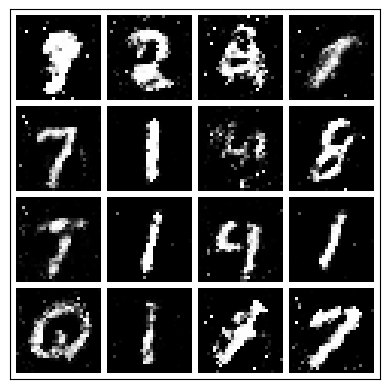

-------------------------------------
                Epoch 16:
                Step: 3500 |
                D_real Loss: 0.3968 |
                D_fake Loss: 0.5357 |
                D_total Loss: 0.9326 |
                G_Loss: 1.229 |
                Real_score 0.724 |
                Fake_score 0.384
            


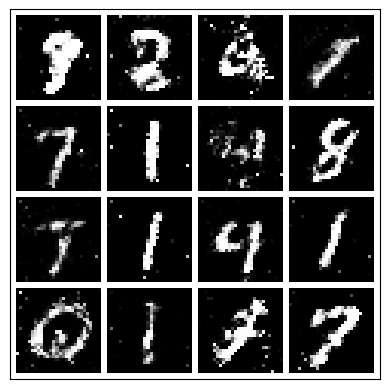

 32%|██████████████████████████▏                                                       | 16/50 [18:54<37:15, 65.76s/it]

-------------------------------------
                Epoch 17:
                Step: 0 |
                D_real Loss: 0.6545 |
                D_fake Loss: 0.4174 |
                D_total Loss: 1.0720 |
                G_Loss: 1.506 |
                Real_score 0.629 |
                Fake_score 0.293
            


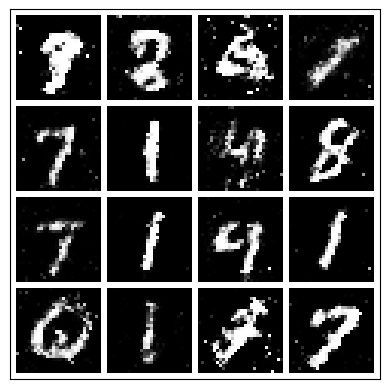

-------------------------------------
                Epoch 17:
                Step: 500 |
                D_real Loss: 0.5176 |
                D_fake Loss: 0.6470 |
                D_total Loss: 1.1647 |
                G_Loss: 1.161 |
                Real_score 0.674 |
                Fake_score 0.359
            


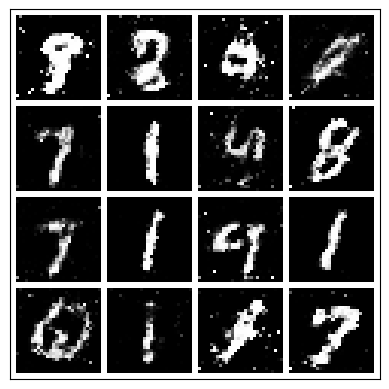

-------------------------------------
                Epoch 17:
                Step: 1000 |
                D_real Loss: 0.3739 |
                D_fake Loss: 0.7335 |
                D_total Loss: 1.1074 |
                G_Loss: 1.084 |
                Real_score 0.751 |
                Fake_score 0.423
            


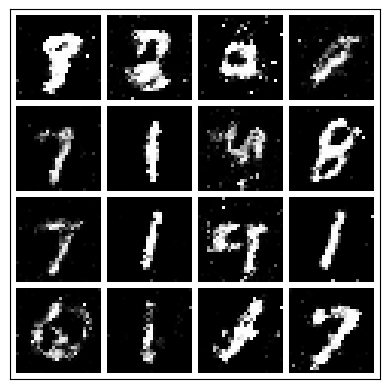

-------------------------------------
                Epoch 17:
                Step: 1500 |
                D_real Loss: 0.5835 |
                D_fake Loss: 0.3601 |
                D_total Loss: 0.9435 |
                G_Loss: 1.350 |
                Real_score 0.633 |
                Fake_score 0.284
            


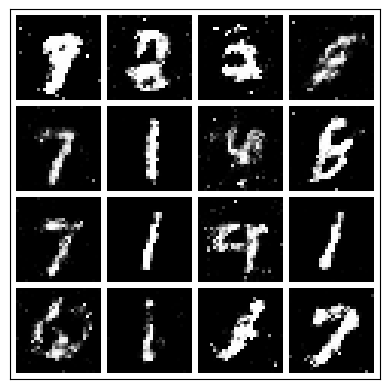

-------------------------------------
                Epoch 17:
                Step: 2000 |
                D_real Loss: 0.2894 |
                D_fake Loss: 0.4368 |
                D_total Loss: 0.7262 |
                G_Loss: 1.781 |
                Real_score 0.795 |
                Fake_score 0.266
            


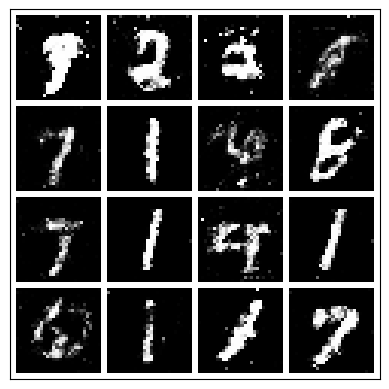

-------------------------------------
                Epoch 17:
                Step: 2500 |
                D_real Loss: 0.6588 |
                D_fake Loss: 0.5497 |
                D_total Loss: 1.2085 |
                G_Loss: 1.380 |
                Real_score 0.567 |
                Fake_score 0.370
            


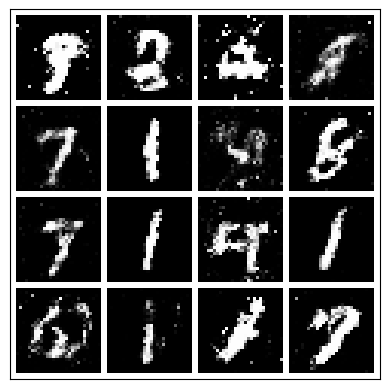

-------------------------------------
                Epoch 17:
                Step: 3000 |
                D_real Loss: 0.2869 |
                D_fake Loss: 0.4386 |
                D_total Loss: 0.7255 |
                G_Loss: 1.210 |
                Real_score 0.787 |
                Fake_score 0.334
            


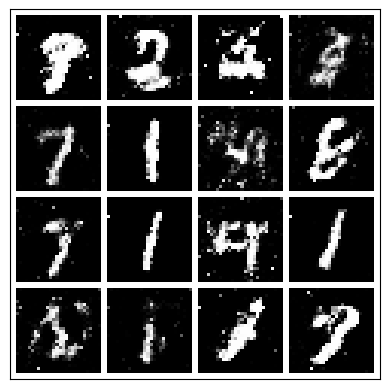

-------------------------------------
                Epoch 17:
                Step: 3500 |
                D_real Loss: 0.4678 |
                D_fake Loss: 0.5413 |
                D_total Loss: 1.0091 |
                G_Loss: 1.133 |
                Real_score 0.682 |
                Fake_score 0.375
            


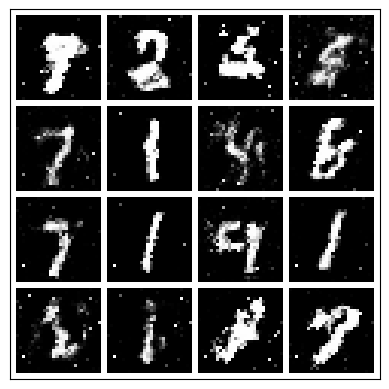

 34%|███████████████████████████▉                                                      | 17/50 [19:59<36:04, 65.60s/it]

-------------------------------------
                Epoch 18:
                Step: 0 |
                D_real Loss: 0.3246 |
                D_fake Loss: 0.4919 |
                D_total Loss: 0.8164 |
                G_Loss: 1.105 |
                Real_score 0.790 |
                Fake_score 0.363
            


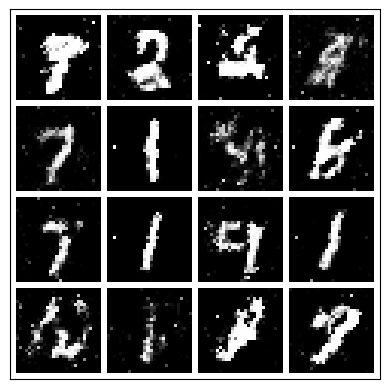

-------------------------------------
                Epoch 18:
                Step: 500 |
                D_real Loss: 0.6772 |
                D_fake Loss: 0.5861 |
                D_total Loss: 1.2633 |
                G_Loss: 1.277 |
                Real_score 0.608 |
                Fake_score 0.397
            


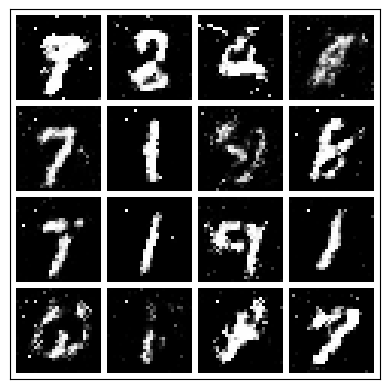

-------------------------------------
                Epoch 18:
                Step: 1000 |
                D_real Loss: 0.4614 |
                D_fake Loss: 0.3426 |
                D_total Loss: 0.8040 |
                G_Loss: 1.237 |
                Real_score 0.731 |
                Fake_score 0.272
            


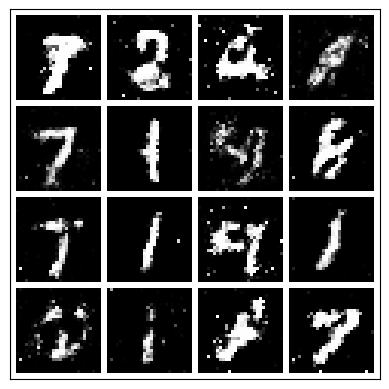

-------------------------------------
                Epoch 18:
                Step: 1500 |
                D_real Loss: 0.4089 |
                D_fake Loss: 0.4690 |
                D_total Loss: 0.8779 |
                G_Loss: 1.019 |
                Real_score 0.711 |
                Fake_score 0.353
            


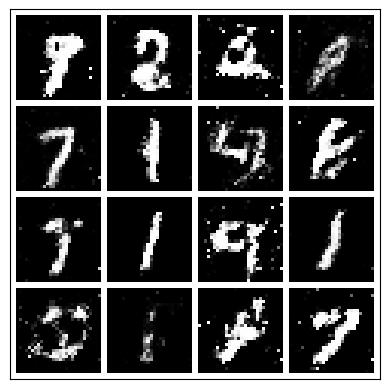

-------------------------------------
                Epoch 18:
                Step: 2000 |
                D_real Loss: 0.7183 |
                D_fake Loss: 0.3673 |
                D_total Loss: 1.0856 |
                G_Loss: 1.331 |
                Real_score 0.589 |
                Fake_score 0.290
            


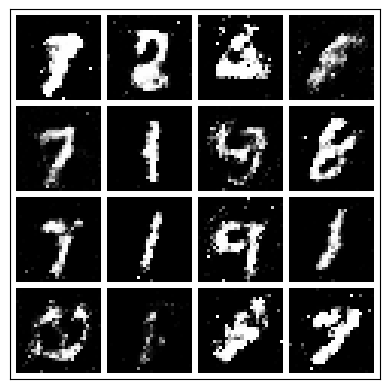

-------------------------------------
                Epoch 18:
                Step: 2500 |
                D_real Loss: 0.5107 |
                D_fake Loss: 0.5525 |
                D_total Loss: 1.0633 |
                G_Loss: 1.219 |
                Real_score 0.686 |
                Fake_score 0.349
            


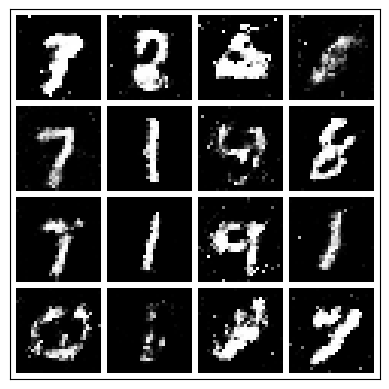

-------------------------------------
                Epoch 18:
                Step: 3000 |
                D_real Loss: 0.6155 |
                D_fake Loss: 0.4655 |
                D_total Loss: 1.0811 |
                G_Loss: 1.112 |
                Real_score 0.630 |
                Fake_score 0.350
            


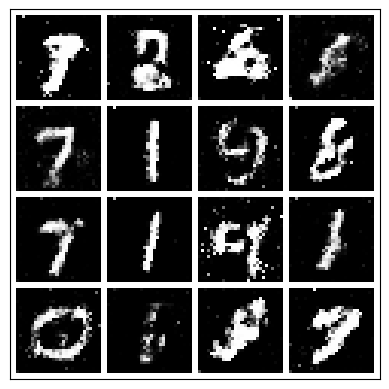

-------------------------------------
                Epoch 18:
                Step: 3500 |
                D_real Loss: 0.5395 |
                D_fake Loss: 0.6316 |
                D_total Loss: 1.1710 |
                G_Loss: 1.379 |
                Real_score 0.673 |
                Fake_score 0.361
            


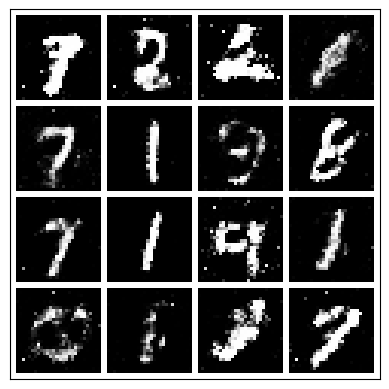

 36%|█████████████████████████████▌                                                    | 18/50 [21:03<34:40, 65.01s/it]

-------------------------------------
                Epoch 19:
                Step: 0 |
                D_real Loss: 0.4170 |
                D_fake Loss: 0.5118 |
                D_total Loss: 0.9288 |
                G_Loss: 1.230 |
                Real_score 0.724 |
                Fake_score 0.372
            


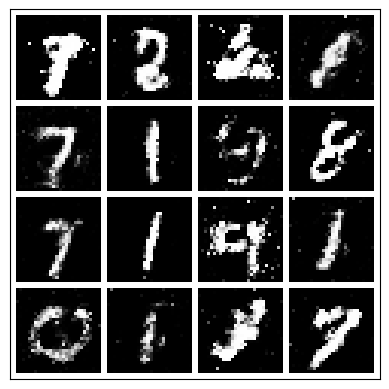

-------------------------------------
                Epoch 19:
                Step: 500 |
                D_real Loss: 0.5204 |
                D_fake Loss: 0.2793 |
                D_total Loss: 0.7997 |
                G_Loss: 1.453 |
                Real_score 0.646 |
                Fake_score 0.233
            


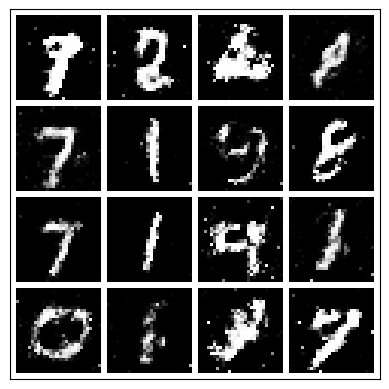

-------------------------------------
                Epoch 19:
                Step: 1000 |
                D_real Loss: 0.6323 |
                D_fake Loss: 0.3090 |
                D_total Loss: 0.9412 |
                G_Loss: 1.501 |
                Real_score 0.589 |
                Fake_score 0.254
            


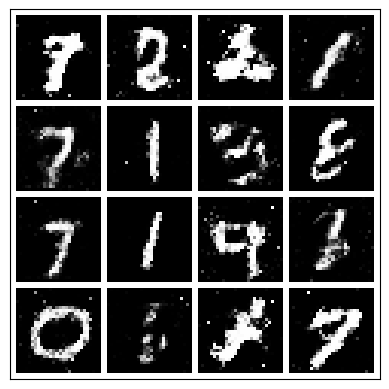

-------------------------------------
                Epoch 19:
                Step: 1500 |
                D_real Loss: 0.2147 |
                D_fake Loss: 0.4935 |
                D_total Loss: 0.7082 |
                G_Loss: 1.299 |
                Real_score 0.838 |
                Fake_score 0.366
            


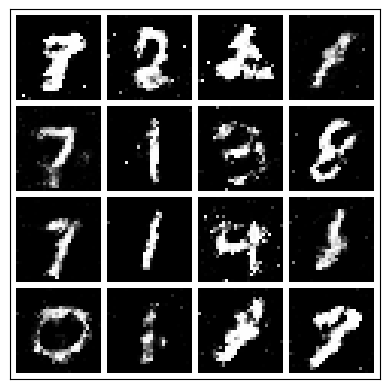

-------------------------------------
                Epoch 19:
                Step: 2000 |
                D_real Loss: 0.4574 |
                D_fake Loss: 0.5294 |
                D_total Loss: 0.9868 |
                G_Loss: 1.198 |
                Real_score 0.687 |
                Fake_score 0.372
            


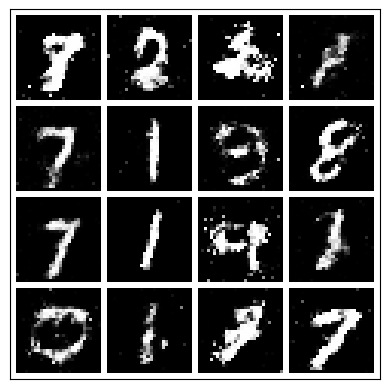

-------------------------------------
                Epoch 19:
                Step: 2500 |
                D_real Loss: 0.2312 |
                D_fake Loss: 0.5519 |
                D_total Loss: 0.7831 |
                G_Loss: 1.190 |
                Real_score 0.820 |
                Fake_score 0.372
            


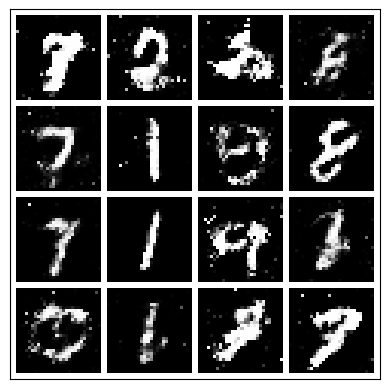

-------------------------------------
                Epoch 19:
                Step: 3000 |
                D_real Loss: 0.5624 |
                D_fake Loss: 0.3560 |
                D_total Loss: 0.9183 |
                G_Loss: 1.420 |
                Real_score 0.639 |
                Fake_score 0.277
            


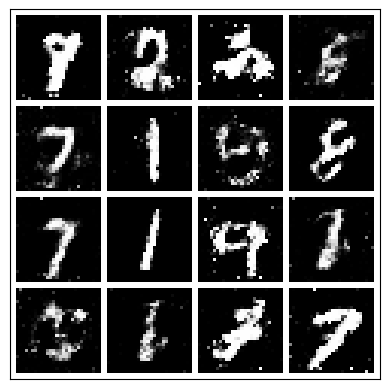

-------------------------------------
                Epoch 19:
                Step: 3500 |
                D_real Loss: 0.6724 |
                D_fake Loss: 0.4808 |
                D_total Loss: 1.1532 |
                G_Loss: 0.992 |
                Real_score 0.617 |
                Fake_score 0.323
            


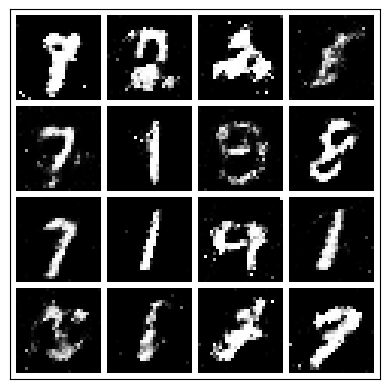

 38%|███████████████████████████████▏                                                  | 19/50 [22:06<33:22, 64.59s/it]

-------------------------------------
                Epoch 20:
                Step: 0 |
                D_real Loss: 0.5380 |
                D_fake Loss: 0.4142 |
                D_total Loss: 0.9522 |
                G_Loss: 1.110 |
                Real_score 0.641 |
                Fake_score 0.326
            


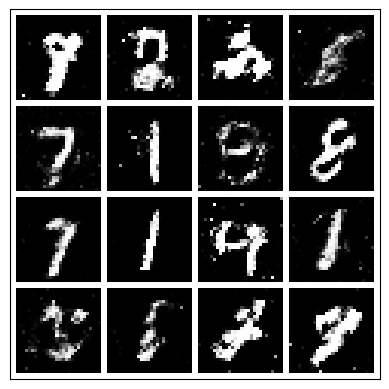

-------------------------------------
                Epoch 20:
                Step: 500 |
                D_real Loss: 0.5804 |
                D_fake Loss: 0.4875 |
                D_total Loss: 1.0678 |
                G_Loss: 1.296 |
                Real_score 0.600 |
                Fake_score 0.327
            


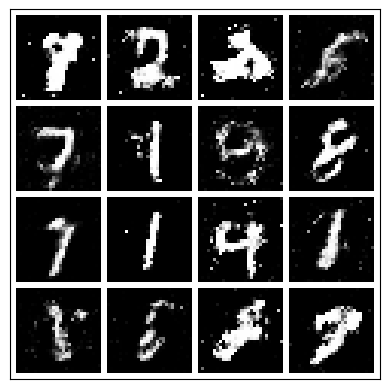

-------------------------------------
                Epoch 20:
                Step: 1000 |
                D_real Loss: 0.7187 |
                D_fake Loss: 0.2697 |
                D_total Loss: 0.9884 |
                G_Loss: 1.737 |
                Real_score 0.567 |
                Fake_score 0.224
            


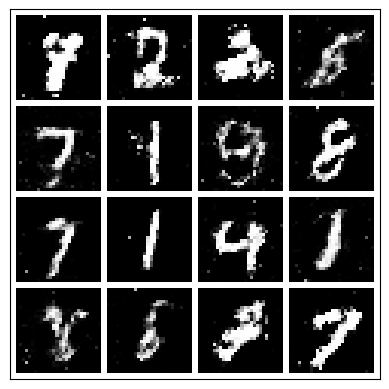

-------------------------------------
                Epoch 20:
                Step: 1500 |
                D_real Loss: 0.6290 |
                D_fake Loss: 0.4075 |
                D_total Loss: 1.0365 |
                G_Loss: 1.269 |
                Real_score 0.587 |
                Fake_score 0.326
            


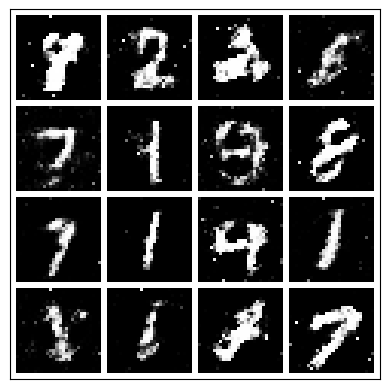

-------------------------------------
                Epoch 20:
                Step: 2000 |
                D_real Loss: 0.4444 |
                D_fake Loss: 0.4997 |
                D_total Loss: 0.9441 |
                G_Loss: 1.598 |
                Real_score 0.697 |
                Fake_score 0.361
            


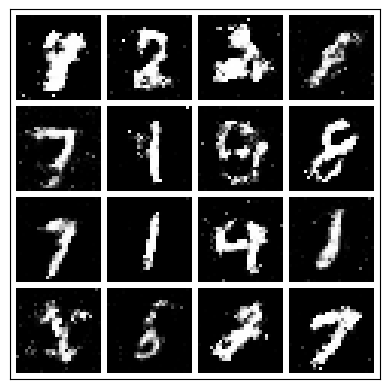

-------------------------------------
                Epoch 20:
                Step: 2500 |
                D_real Loss: 0.3606 |
                D_fake Loss: 0.4281 |
                D_total Loss: 0.7887 |
                G_Loss: 1.157 |
                Real_score 0.729 |
                Fake_score 0.319
            


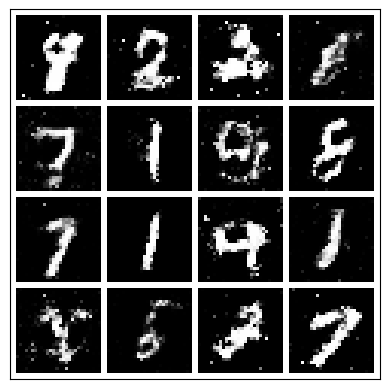

-------------------------------------
                Epoch 20:
                Step: 3000 |
                D_real Loss: 0.5936 |
                D_fake Loss: 0.4872 |
                D_total Loss: 1.0808 |
                G_Loss: 0.971 |
                Real_score 0.635 |
                Fake_score 0.370
            


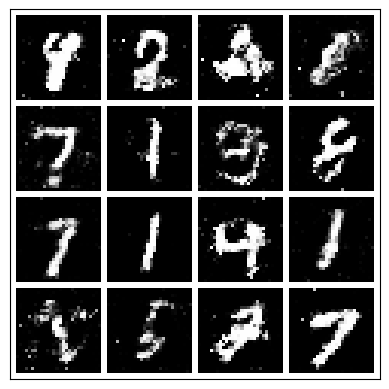

-------------------------------------
                Epoch 20:
                Step: 3500 |
                D_real Loss: 0.5412 |
                D_fake Loss: 0.6275 |
                D_total Loss: 1.1686 |
                G_Loss: 0.893 |
                Real_score 0.617 |
                Fake_score 0.420
            


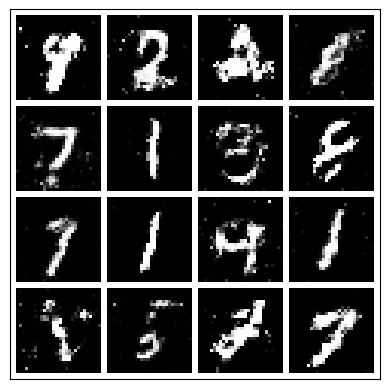

 40%|████████████████████████████████▊                                                 | 20/50 [23:10<32:08, 64.29s/it]

-------------------------------------
                Epoch 21:
                Step: 0 |
                D_real Loss: 0.4252 |
                D_fake Loss: 0.2598 |
                D_total Loss: 0.6850 |
                G_Loss: 1.399 |
                Real_score 0.688 |
                Fake_score 0.216
            


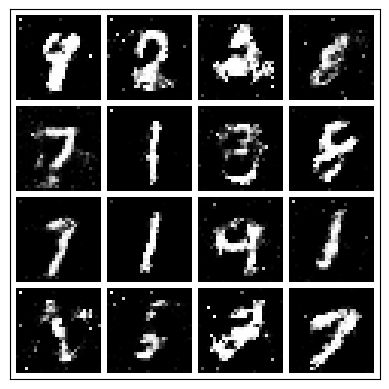

-------------------------------------
                Epoch 21:
                Step: 500 |
                D_real Loss: 0.5196 |
                D_fake Loss: 0.4225 |
                D_total Loss: 0.9421 |
                G_Loss: 1.379 |
                Real_score 0.636 |
                Fake_score 0.337
            


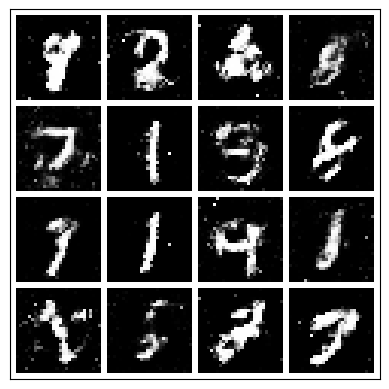

-------------------------------------
                Epoch 21:
                Step: 1000 |
                D_real Loss: 0.3774 |
                D_fake Loss: 0.4895 |
                D_total Loss: 0.8669 |
                G_Loss: 1.105 |
                Real_score 0.727 |
                Fake_score 0.353
            


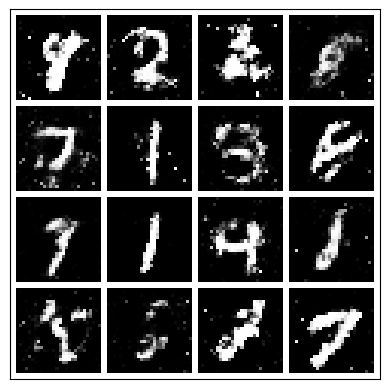

-------------------------------------
                Epoch 21:
                Step: 1500 |
                D_real Loss: 0.8585 |
                D_fake Loss: 0.2798 |
                D_total Loss: 1.1383 |
                G_Loss: 1.424 |
                Real_score 0.495 |
                Fake_score 0.230
            


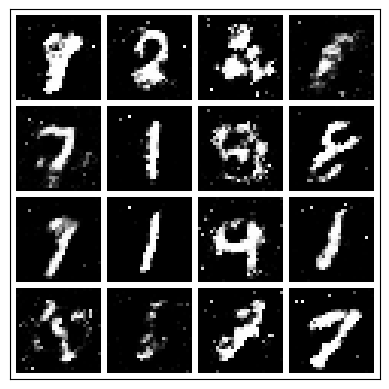

-------------------------------------
                Epoch 21:
                Step: 2000 |
                D_real Loss: 0.2465 |
                D_fake Loss: 0.5180 |
                D_total Loss: 0.7645 |
                G_Loss: 1.192 |
                Real_score 0.803 |
                Fake_score 0.369
            


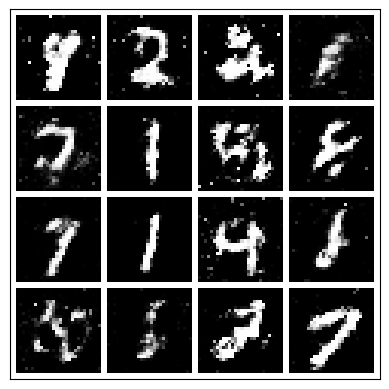

-------------------------------------
                Epoch 21:
                Step: 2500 |
                D_real Loss: 0.4946 |
                D_fake Loss: 0.6467 |
                D_total Loss: 1.1413 |
                G_Loss: 0.990 |
                Real_score 0.657 |
                Fake_score 0.437
            


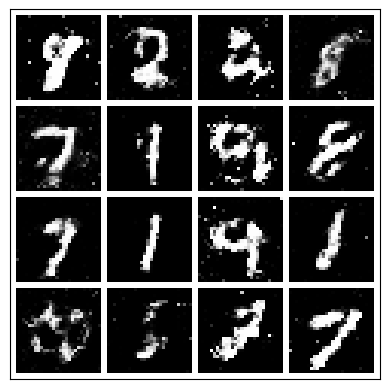

-------------------------------------
                Epoch 21:
                Step: 3000 |
                D_real Loss: 0.4964 |
                D_fake Loss: 0.6214 |
                D_total Loss: 1.1178 |
                G_Loss: 1.053 |
                Real_score 0.646 |
                Fake_score 0.429
            


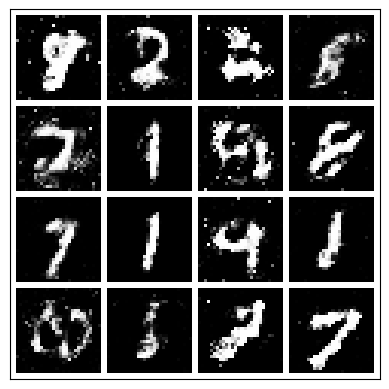

-------------------------------------
                Epoch 21:
                Step: 3500 |
                D_real Loss: 0.6671 |
                D_fake Loss: 0.2529 |
                D_total Loss: 0.9200 |
                G_Loss: 1.257 |
                Real_score 0.624 |
                Fake_score 0.204
            


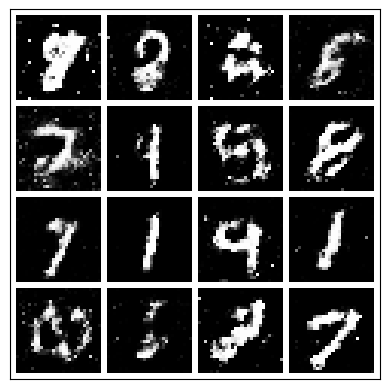

 42%|██████████████████████████████████▍                                               | 21/50 [24:15<31:15, 64.69s/it]

-------------------------------------
                Epoch 22:
                Step: 0 |
                D_real Loss: 0.6738 |
                D_fake Loss: 0.4401 |
                D_total Loss: 1.1139 |
                G_Loss: 1.495 |
                Real_score 0.584 |
                Fake_score 0.336
            


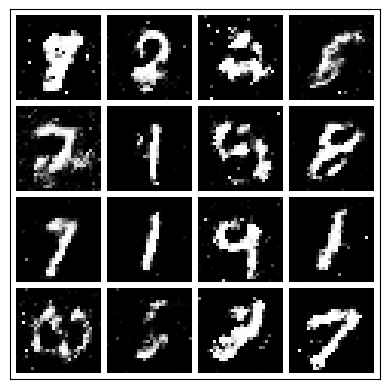

-------------------------------------
                Epoch 22:
                Step: 500 |
                D_real Loss: 0.5381 |
                D_fake Loss: 0.5117 |
                D_total Loss: 1.0499 |
                G_Loss: 0.925 |
                Real_score 0.640 |
                Fake_score 0.383
            


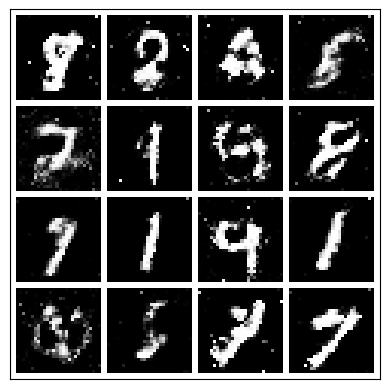

-------------------------------------
                Epoch 22:
                Step: 1000 |
                D_real Loss: 0.3525 |
                D_fake Loss: 0.5895 |
                D_total Loss: 0.9420 |
                G_Loss: 1.023 |
                Real_score 0.751 |
                Fake_score 0.407
            


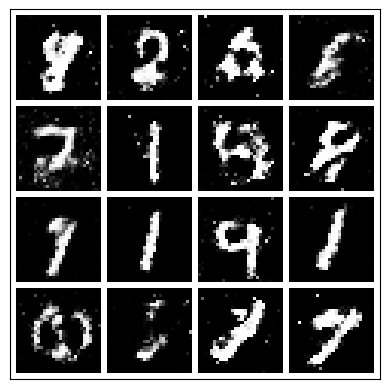

-------------------------------------
                Epoch 22:
                Step: 1500 |
                D_real Loss: 0.6752 |
                D_fake Loss: 0.4718 |
                D_total Loss: 1.1470 |
                G_Loss: 1.555 |
                Real_score 0.605 |
                Fake_score 0.313
            


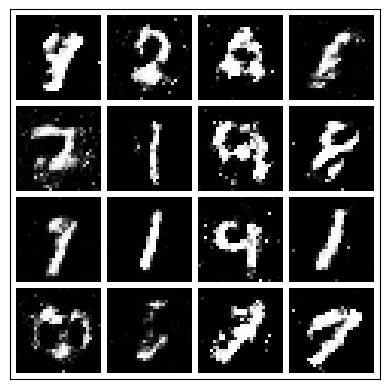

-------------------------------------
                Epoch 22:
                Step: 2000 |
                D_real Loss: 0.6516 |
                D_fake Loss: 0.3746 |
                D_total Loss: 1.0262 |
                G_Loss: 1.555 |
                Real_score 0.573 |
                Fake_score 0.304
            


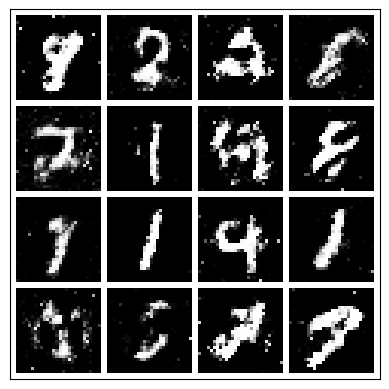

-------------------------------------
                Epoch 22:
                Step: 2500 |
                D_real Loss: 0.3472 |
                D_fake Loss: 1.1743 |
                D_total Loss: 1.5216 |
                G_Loss: 0.882 |
                Real_score 0.761 |
                Fake_score 0.559
            


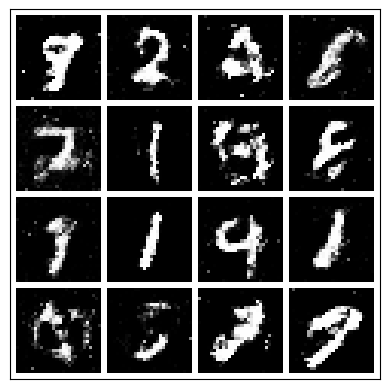

-------------------------------------
                Epoch 22:
                Step: 3000 |
                D_real Loss: 0.3541 |
                D_fake Loss: 0.6946 |
                D_total Loss: 1.0487 |
                G_Loss: 1.088 |
                Real_score 0.767 |
                Fake_score 0.413
            


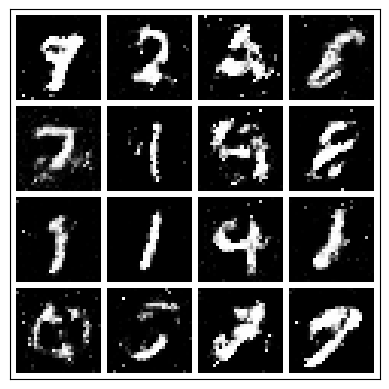

-------------------------------------
                Epoch 22:
                Step: 3500 |
                D_real Loss: 0.3045 |
                D_fake Loss: 0.4975 |
                D_total Loss: 0.8021 |
                G_Loss: 1.237 |
                Real_score 0.783 |
                Fake_score 0.383
            


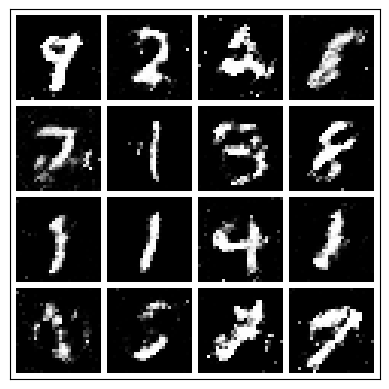

 44%|████████████████████████████████████                                              | 22/50 [25:20<30:11, 64.69s/it]

-------------------------------------
                Epoch 23:
                Step: 0 |
                D_real Loss: 0.6462 |
                D_fake Loss: 0.5638 |
                D_total Loss: 1.2100 |
                G_Loss: 1.294 |
                Real_score 0.578 |
                Fake_score 0.378
            


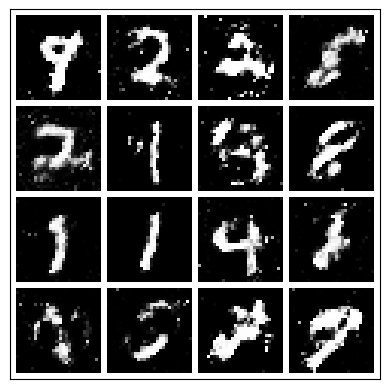

-------------------------------------
                Epoch 23:
                Step: 500 |
                D_real Loss: 0.6377 |
                D_fake Loss: 0.5583 |
                D_total Loss: 1.1961 |
                G_Loss: 1.746 |
                Real_score 0.610 |
                Fake_score 0.374
            


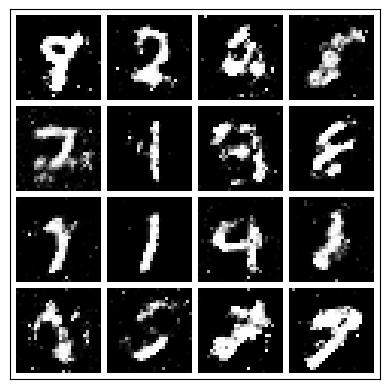

-------------------------------------
                Epoch 23:
                Step: 1000 |
                D_real Loss: 0.5429 |
                D_fake Loss: 0.4182 |
                D_total Loss: 0.9612 |
                G_Loss: 1.178 |
                Real_score 0.646 |
                Fake_score 0.325
            


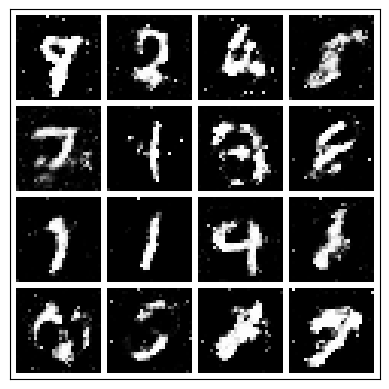

-------------------------------------
                Epoch 23:
                Step: 1500 |
                D_real Loss: 0.3670 |
                D_fake Loss: 0.4927 |
                D_total Loss: 0.8597 |
                G_Loss: 1.059 |
                Real_score 0.720 |
                Fake_score 0.369
            


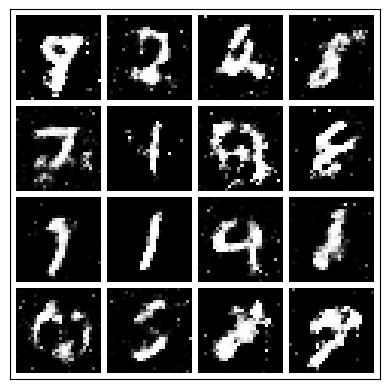

-------------------------------------
                Epoch 23:
                Step: 2000 |
                D_real Loss: 0.3466 |
                D_fake Loss: 0.4404 |
                D_total Loss: 0.7869 |
                G_Loss: 1.240 |
                Real_score 0.734 |
                Fake_score 0.331
            


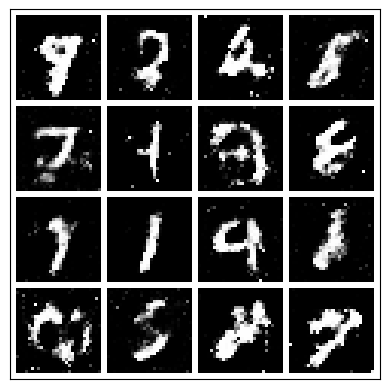

-------------------------------------
                Epoch 23:
                Step: 2500 |
                D_real Loss: 0.4931 |
                D_fake Loss: 0.3649 |
                D_total Loss: 0.8580 |
                G_Loss: 1.069 |
                Real_score 0.652 |
                Fake_score 0.297
            


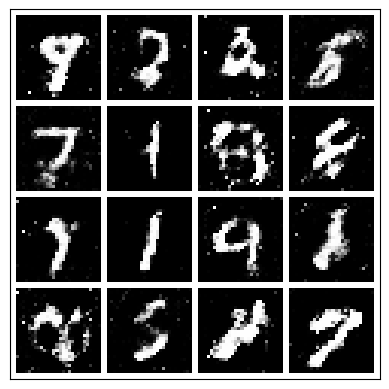

-------------------------------------
                Epoch 23:
                Step: 3000 |
                D_real Loss: 0.3906 |
                D_fake Loss: 0.6813 |
                D_total Loss: 1.0719 |
                G_Loss: 1.043 |
                Real_score 0.721 |
                Fake_score 0.425
            


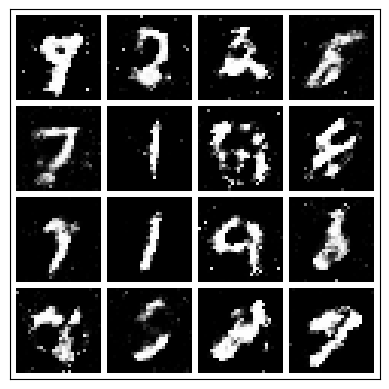

-------------------------------------
                Epoch 23:
                Step: 3500 |
                D_real Loss: 0.4379 |
                D_fake Loss: 0.7201 |
                D_total Loss: 1.1580 |
                G_Loss: 0.968 |
                Real_score 0.684 |
                Fake_score 0.451
            


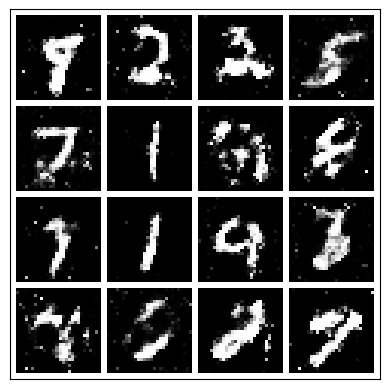

 46%|█████████████████████████████████████▋                                            | 23/50 [26:24<28:59, 64.42s/it]

-------------------------------------
                Epoch 24:
                Step: 0 |
                D_real Loss: 0.4806 |
                D_fake Loss: 0.3091 |
                D_total Loss: 0.7897 |
                G_Loss: 1.440 |
                Real_score 0.681 |
                Fake_score 0.253
            


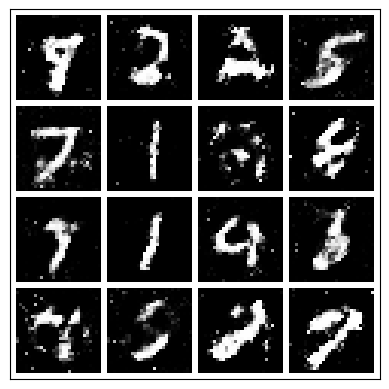

-------------------------------------
                Epoch 24:
                Step: 500 |
                D_real Loss: 0.4660 |
                D_fake Loss: 0.5303 |
                D_total Loss: 0.9963 |
                G_Loss: 1.538 |
                Real_score 0.692 |
                Fake_score 0.313
            


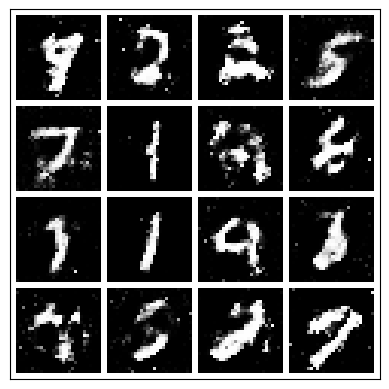

-------------------------------------
                Epoch 24:
                Step: 1000 |
                D_real Loss: 0.4481 |
                D_fake Loss: 0.4784 |
                D_total Loss: 0.9265 |
                G_Loss: 1.139 |
                Real_score 0.677 |
                Fake_score 0.346
            


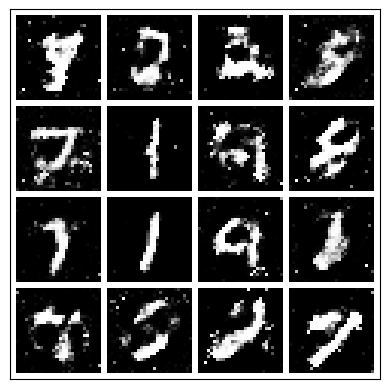

-------------------------------------
                Epoch 24:
                Step: 1500 |
                D_real Loss: 0.6011 |
                D_fake Loss: 0.4625 |
                D_total Loss: 1.0636 |
                G_Loss: 1.388 |
                Real_score 0.605 |
                Fake_score 0.345
            


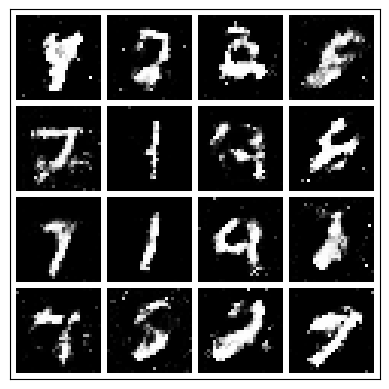

-------------------------------------
                Epoch 24:
                Step: 2000 |
                D_real Loss: 0.8094 |
                D_fake Loss: 0.3589 |
                D_total Loss: 1.1683 |
                G_Loss: 0.947 |
                Real_score 0.523 |
                Fake_score 0.293
            


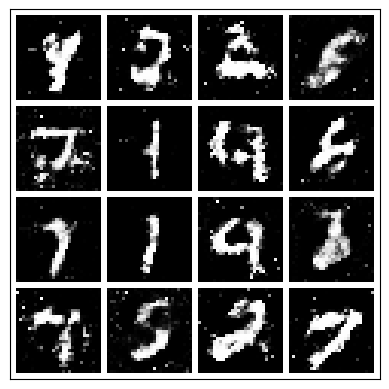

-------------------------------------
                Epoch 24:
                Step: 2500 |
                D_real Loss: 0.5377 |
                D_fake Loss: 0.5328 |
                D_total Loss: 1.0706 |
                G_Loss: 1.070 |
                Real_score 0.660 |
                Fake_score 0.398
            


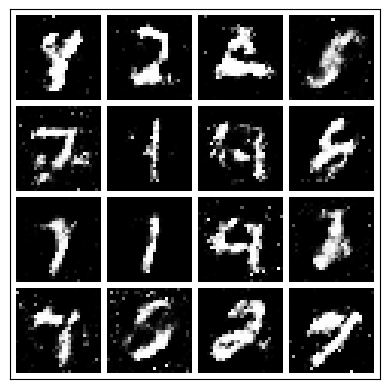

-------------------------------------
                Epoch 24:
                Step: 3000 |
                D_real Loss: 0.3471 |
                D_fake Loss: 0.4496 |
                D_total Loss: 0.7967 |
                G_Loss: 1.293 |
                Real_score 0.748 |
                Fake_score 0.346
            


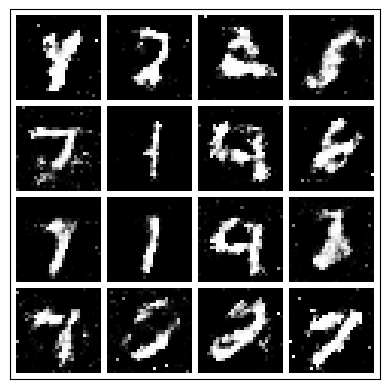

-------------------------------------
                Epoch 24:
                Step: 3500 |
                D_real Loss: 0.5443 |
                D_fake Loss: 0.5272 |
                D_total Loss: 1.0715 |
                G_Loss: 0.940 |
                Real_score 0.628 |
                Fake_score 0.376
            


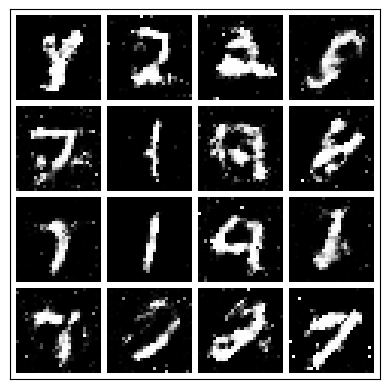

 48%|███████████████████████████████████████▎                                          | 24/50 [27:28<27:49, 64.22s/it]

-------------------------------------
                Epoch 25:
                Step: 0 |
                D_real Loss: 0.6556 |
                D_fake Loss: 0.4230 |
                D_total Loss: 1.0786 |
                G_Loss: 1.157 |
                Real_score 0.635 |
                Fake_score 0.318
            


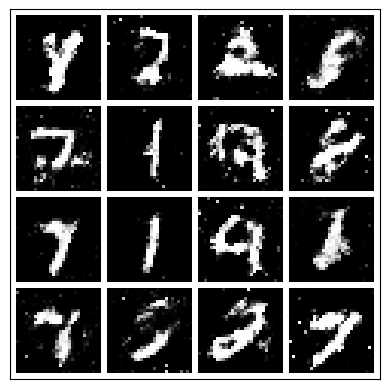

-------------------------------------
                Epoch 25:
                Step: 500 |
                D_real Loss: 0.5941 |
                D_fake Loss: 0.5171 |
                D_total Loss: 1.1112 |
                G_Loss: 1.050 |
                Real_score 0.624 |
                Fake_score 0.368
            


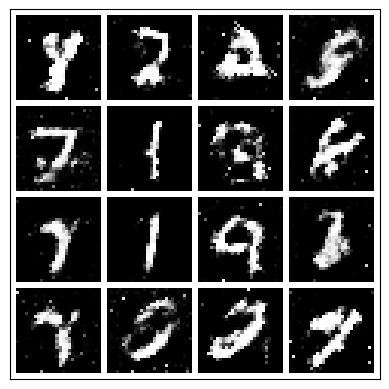

-------------------------------------
                Epoch 25:
                Step: 1000 |
                D_real Loss: 0.6649 |
                D_fake Loss: 0.3779 |
                D_total Loss: 1.0428 |
                G_Loss: 1.078 |
                Real_score 0.585 |
                Fake_score 0.290
            


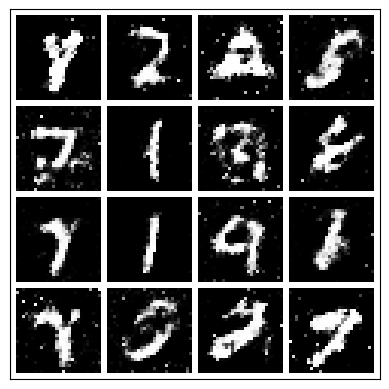

-------------------------------------
                Epoch 25:
                Step: 1500 |
                D_real Loss: 0.5467 |
                D_fake Loss: 0.4718 |
                D_total Loss: 1.0185 |
                G_Loss: 1.267 |
                Real_score 0.640 |
                Fake_score 0.347
            


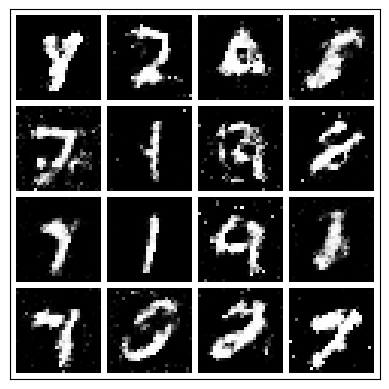

-------------------------------------
                Epoch 25:
                Step: 2000 |
                D_real Loss: 0.6325 |
                D_fake Loss: 0.4866 |
                D_total Loss: 1.1191 |
                G_Loss: 1.229 |
                Real_score 0.622 |
                Fake_score 0.366
            


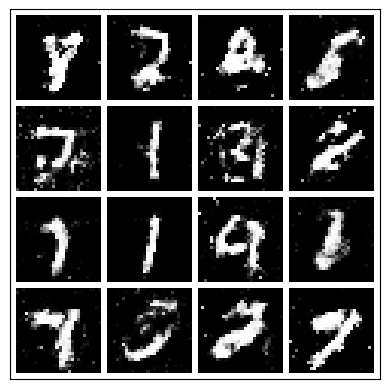

-------------------------------------
                Epoch 25:
                Step: 2500 |
                D_real Loss: 0.5727 |
                D_fake Loss: 0.6466 |
                D_total Loss: 1.2192 |
                G_Loss: 0.996 |
                Real_score 0.602 |
                Fake_score 0.453
            


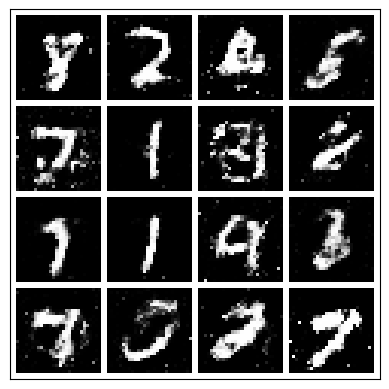

-------------------------------------
                Epoch 25:
                Step: 3000 |
                D_real Loss: 0.3856 |
                D_fake Loss: 0.7593 |
                D_total Loss: 1.1450 |
                G_Loss: 0.800 |
                Real_score 0.739 |
                Fake_score 0.498
            


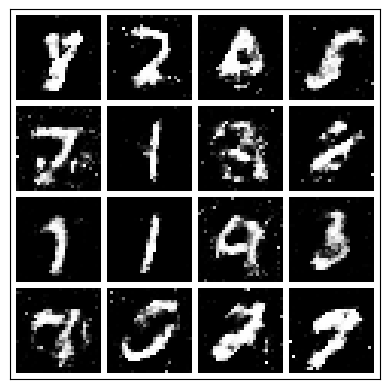

-------------------------------------
                Epoch 25:
                Step: 3500 |
                D_real Loss: 0.6941 |
                D_fake Loss: 0.5637 |
                D_total Loss: 1.2578 |
                G_Loss: 1.083 |
                Real_score 0.538 |
                Fake_score 0.362
            


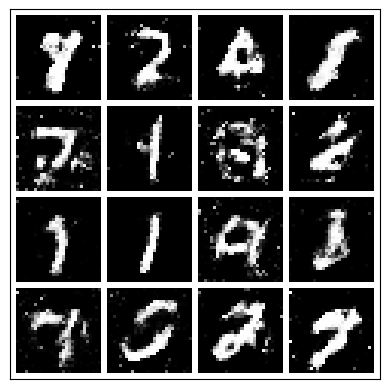

 50%|█████████████████████████████████████████                                         | 25/50 [28:31<26:39, 63.99s/it]

-------------------------------------
                Epoch 26:
                Step: 0 |
                D_real Loss: 0.8366 |
                D_fake Loss: 0.5569 |
                D_total Loss: 1.3935 |
                G_Loss: 1.075 |
                Real_score 0.478 |
                Fake_score 0.386
            


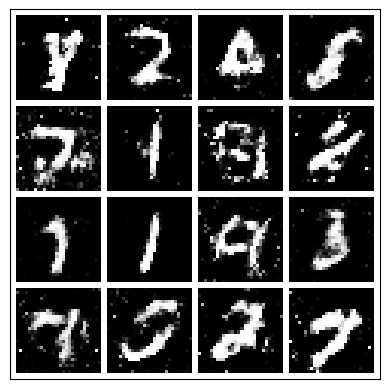

-------------------------------------
                Epoch 26:
                Step: 500 |
                D_real Loss: 0.4356 |
                D_fake Loss: 0.4962 |
                D_total Loss: 0.9319 |
                G_Loss: 1.350 |
                Real_score 0.714 |
                Fake_score 0.349
            


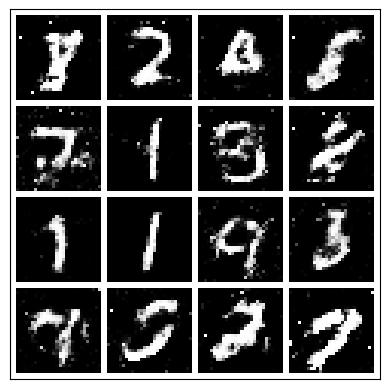

-------------------------------------
                Epoch 26:
                Step: 1000 |
                D_real Loss: 0.4156 |
                D_fake Loss: 0.6211 |
                D_total Loss: 1.0368 |
                G_Loss: 1.204 |
                Real_score 0.693 |
                Fake_score 0.412
            


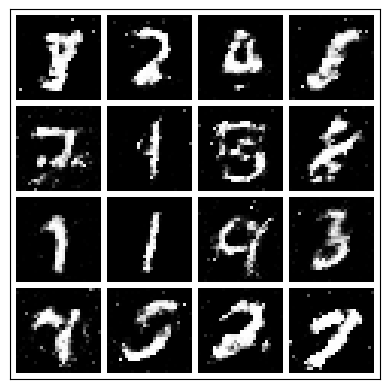

-------------------------------------
                Epoch 26:
                Step: 1500 |
                D_real Loss: 0.4863 |
                D_fake Loss: 0.4265 |
                D_total Loss: 0.9128 |
                G_Loss: 1.217 |
                Real_score 0.677 |
                Fake_score 0.320
            


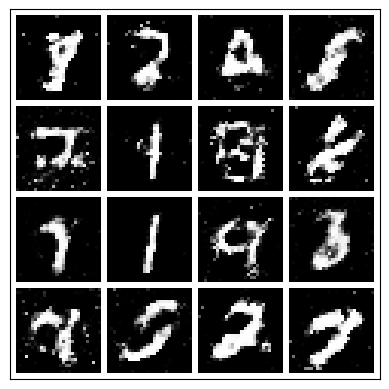

-------------------------------------
                Epoch 26:
                Step: 2000 |
                D_real Loss: 0.3773 |
                D_fake Loss: 0.5148 |
                D_total Loss: 0.8921 |
                G_Loss: 1.393 |
                Real_score 0.751 |
                Fake_score 0.359
            


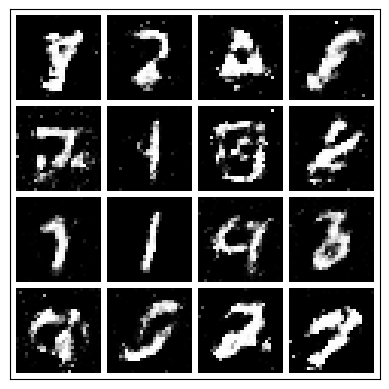

-------------------------------------
                Epoch 26:
                Step: 2500 |
                D_real Loss: 0.5540 |
                D_fake Loss: 0.4674 |
                D_total Loss: 1.0213 |
                G_Loss: 1.438 |
                Real_score 0.629 |
                Fake_score 0.296
            


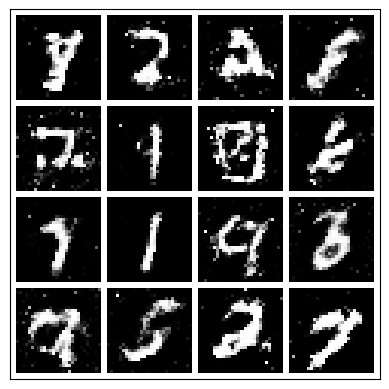

-------------------------------------
                Epoch 26:
                Step: 3000 |
                D_real Loss: 0.7639 |
                D_fake Loss: 0.3834 |
                D_total Loss: 1.1473 |
                G_Loss: 1.176 |
                Real_score 0.557 |
                Fake_score 0.298
            


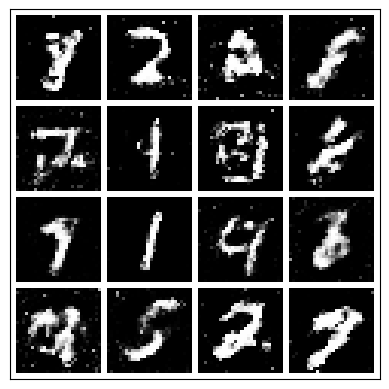

-------------------------------------
                Epoch 26:
                Step: 3500 |
                D_real Loss: 0.5378 |
                D_fake Loss: 0.4910 |
                D_total Loss: 1.0288 |
                G_Loss: 1.112 |
                Real_score 0.647 |
                Fake_score 0.345
            


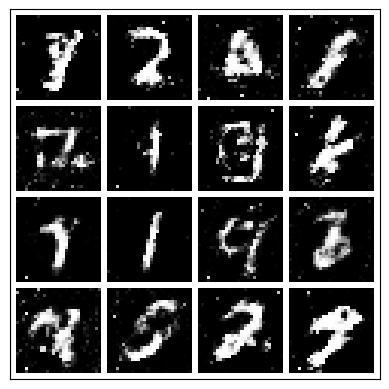

 52%|██████████████████████████████████████████▋                                       | 26/50 [29:35<25:33, 63.88s/it]

-------------------------------------
                Epoch 27:
                Step: 0 |
                D_real Loss: 0.5430 |
                D_fake Loss: 0.4113 |
                D_total Loss: 0.9543 |
                G_Loss: 1.157 |
                Real_score 0.640 |
                Fake_score 0.316
            


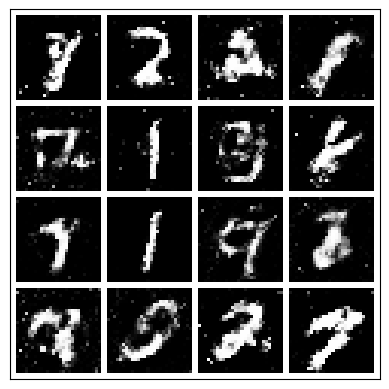

-------------------------------------
                Epoch 27:
                Step: 500 |
                D_real Loss: 0.3802 |
                D_fake Loss: 0.5622 |
                D_total Loss: 0.9424 |
                G_Loss: 1.082 |
                Real_score 0.739 |
                Fake_score 0.408
            


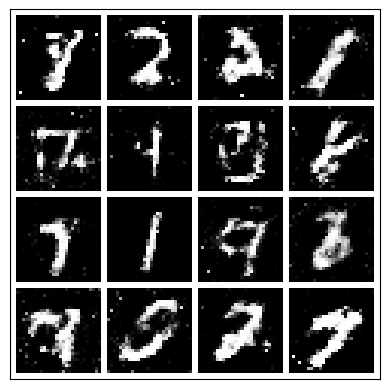

-------------------------------------
                Epoch 27:
                Step: 1000 |
                D_real Loss: 0.6254 |
                D_fake Loss: 0.2809 |
                D_total Loss: 0.9063 |
                G_Loss: 1.319 |
                Real_score 0.598 |
                Fake_score 0.233
            


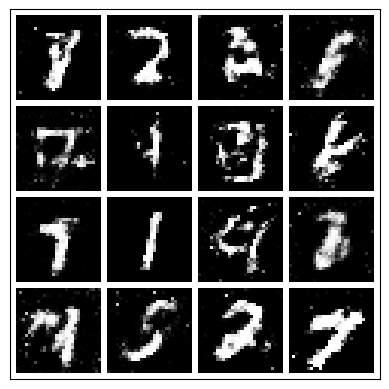

-------------------------------------
                Epoch 27:
                Step: 1500 |
                D_real Loss: 0.4398 |
                D_fake Loss: 0.4608 |
                D_total Loss: 0.9005 |
                G_Loss: 1.409 |
                Real_score 0.692 |
                Fake_score 0.312
            


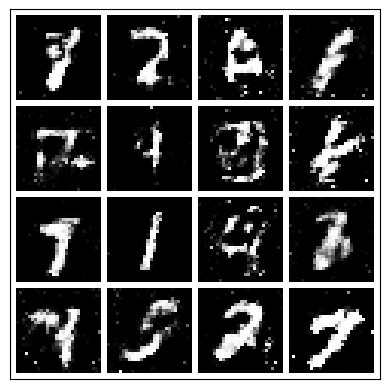

-------------------------------------
                Epoch 27:
                Step: 2000 |
                D_real Loss: 0.4309 |
                D_fake Loss: 0.4925 |
                D_total Loss: 0.9234 |
                G_Loss: 1.148 |
                Real_score 0.703 |
                Fake_score 0.362
            


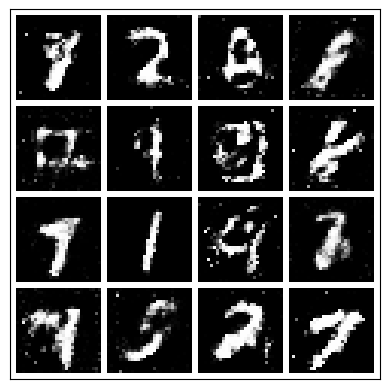

-------------------------------------
                Epoch 27:
                Step: 2500 |
                D_real Loss: 0.3883 |
                D_fake Loss: 0.7848 |
                D_total Loss: 1.1732 |
                G_Loss: 1.076 |
                Real_score 0.727 |
                Fake_score 0.422
            


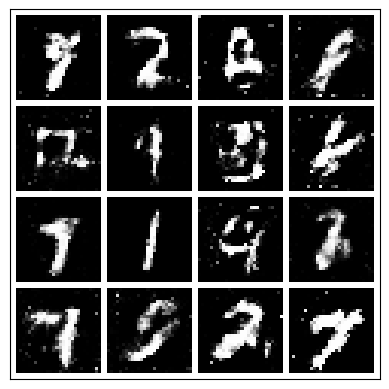

-------------------------------------
                Epoch 27:
                Step: 3000 |
                D_real Loss: 0.4553 |
                D_fake Loss: 0.5789 |
                D_total Loss: 1.0342 |
                G_Loss: 1.174 |
                Real_score 0.712 |
                Fake_score 0.374
            


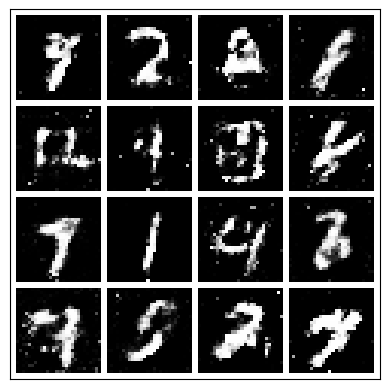

-------------------------------------
                Epoch 27:
                Step: 3500 |
                D_real Loss: 0.4927 |
                D_fake Loss: 0.5041 |
                D_total Loss: 0.9968 |
                G_Loss: 1.157 |
                Real_score 0.664 |
                Fake_score 0.371
            


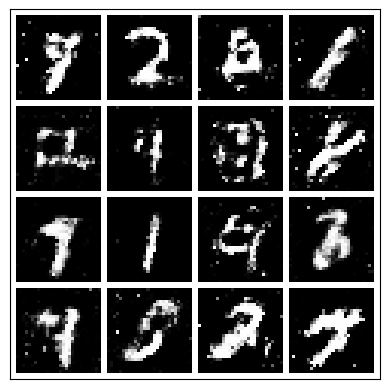

 54%|████████████████████████████████████████████▎                                     | 27/50 [30:38<24:26, 63.78s/it]

-------------------------------------
                Epoch 28:
                Step: 0 |
                D_real Loss: 0.5594 |
                D_fake Loss: 0.3356 |
                D_total Loss: 0.8949 |
                G_Loss: 1.282 |
                Real_score 0.617 |
                Fake_score 0.278
            


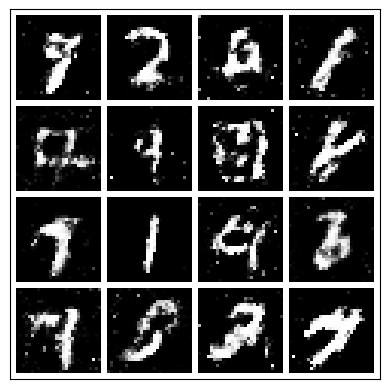

-------------------------------------
                Epoch 28:
                Step: 500 |
                D_real Loss: 0.3924 |
                D_fake Loss: 0.6738 |
                D_total Loss: 1.0661 |
                G_Loss: 1.016 |
                Real_score 0.723 |
                Fake_score 0.461
            


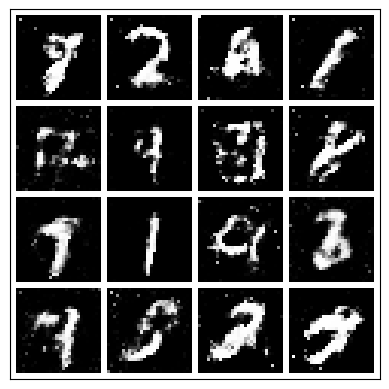

-------------------------------------
                Epoch 28:
                Step: 1000 |
                D_real Loss: 0.6833 |
                D_fake Loss: 0.6065 |
                D_total Loss: 1.2898 |
                G_Loss: 1.275 |
                Real_score 0.564 |
                Fake_score 0.402
            


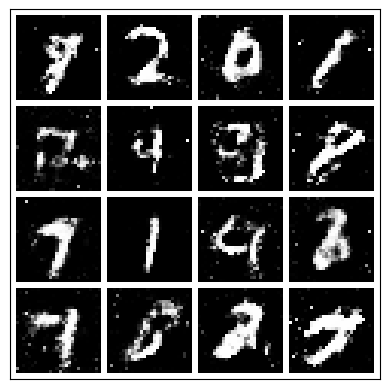

-------------------------------------
                Epoch 28:
                Step: 1500 |
                D_real Loss: 0.6524 |
                D_fake Loss: 0.7773 |
                D_total Loss: 1.4297 |
                G_Loss: 1.103 |
                Real_score 0.566 |
                Fake_score 0.457
            


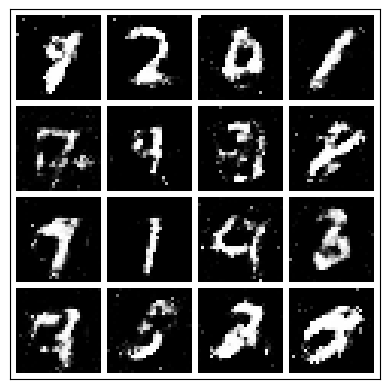

-------------------------------------
                Epoch 28:
                Step: 2000 |
                D_real Loss: 0.3891 |
                D_fake Loss: 0.4093 |
                D_total Loss: 0.7984 |
                G_Loss: 1.593 |
                Real_score 0.721 |
                Fake_score 0.310
            


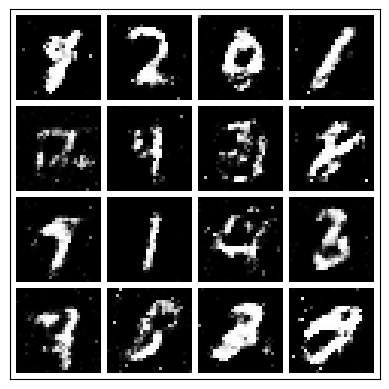

-------------------------------------
                Epoch 28:
                Step: 2500 |
                D_real Loss: 0.5546 |
                D_fake Loss: 0.7408 |
                D_total Loss: 1.2954 |
                G_Loss: 0.882 |
                Real_score 0.625 |
                Fake_score 0.437
            


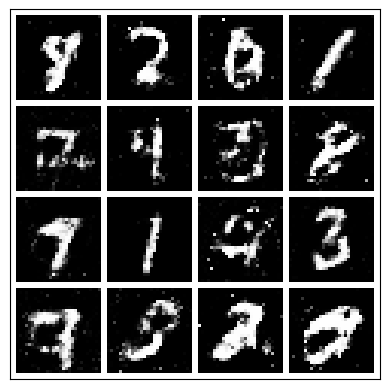

-------------------------------------
                Epoch 28:
                Step: 3000 |
                D_real Loss: 0.6488 |
                D_fake Loss: 0.7135 |
                D_total Loss: 1.3623 |
                G_Loss: 1.068 |
                Real_score 0.555 |
                Fake_score 0.440
            


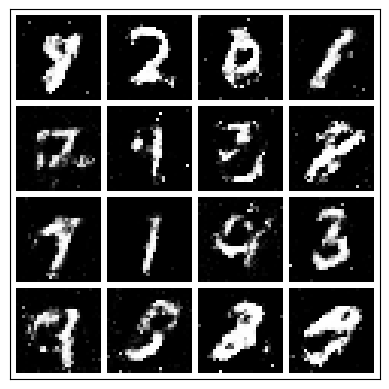

-------------------------------------
                Epoch 28:
                Step: 3500 |
                D_real Loss: 0.3607 |
                D_fake Loss: 0.5594 |
                D_total Loss: 0.9201 |
                G_Loss: 1.099 |
                Real_score 0.736 |
                Fake_score 0.393
            


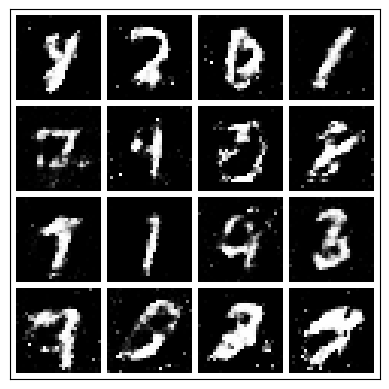

 56%|█████████████████████████████████████████████▉                                    | 28/50 [31:42<23:22, 63.75s/it]

-------------------------------------
                Epoch 29:
                Step: 0 |
                D_real Loss: 0.8184 |
                D_fake Loss: 0.5637 |
                D_total Loss: 1.3821 |
                G_Loss: 1.020 |
                Real_score 0.507 |
                Fake_score 0.403
            


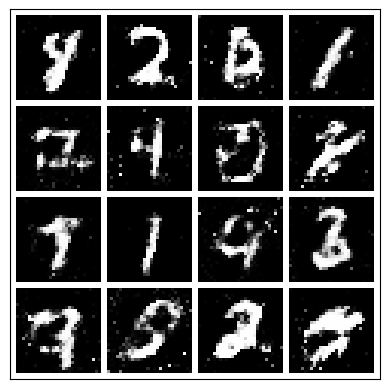

-------------------------------------
                Epoch 29:
                Step: 500 |
                D_real Loss: 0.6770 |
                D_fake Loss: 0.5767 |
                D_total Loss: 1.2538 |
                G_Loss: 0.905 |
                Real_score 0.573 |
                Fake_score 0.375
            


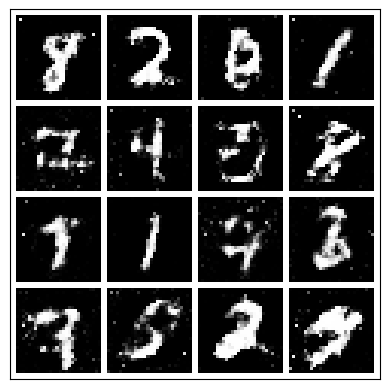

-------------------------------------
                Epoch 29:
                Step: 1000 |
                D_real Loss: 0.6558 |
                D_fake Loss: 0.3943 |
                D_total Loss: 1.0500 |
                G_Loss: 1.266 |
                Real_score 0.557 |
                Fake_score 0.314
            


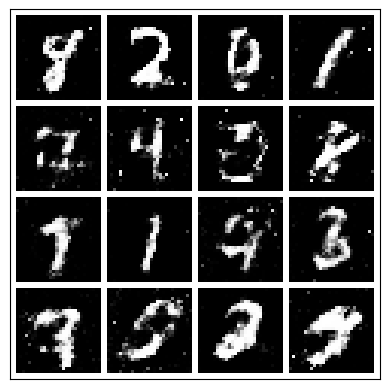

-------------------------------------
                Epoch 29:
                Step: 1500 |
                D_real Loss: 0.5899 |
                D_fake Loss: 0.3931 |
                D_total Loss: 0.9829 |
                G_Loss: 1.461 |
                Real_score 0.591 |
                Fake_score 0.304
            


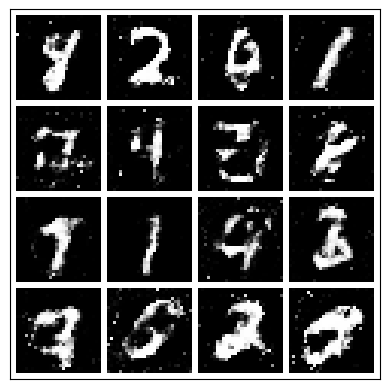

-------------------------------------
                Epoch 29:
                Step: 2000 |
                D_real Loss: 0.4633 |
                D_fake Loss: 0.5325 |
                D_total Loss: 0.9957 |
                G_Loss: 1.145 |
                Real_score 0.683 |
                Fake_score 0.371
            


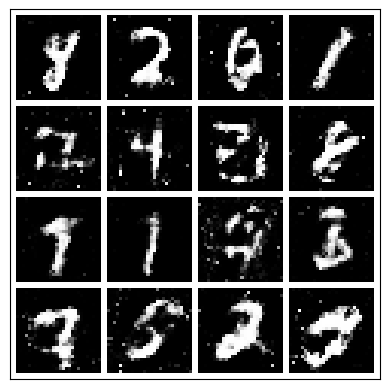

-------------------------------------
                Epoch 29:
                Step: 2500 |
                D_real Loss: 0.5744 |
                D_fake Loss: 0.4808 |
                D_total Loss: 1.0553 |
                G_Loss: 1.173 |
                Real_score 0.620 |
                Fake_score 0.366
            


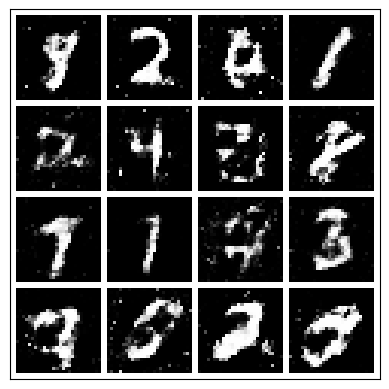

-------------------------------------
                Epoch 29:
                Step: 3000 |
                D_real Loss: 0.5897 |
                D_fake Loss: 0.8416 |
                D_total Loss: 1.4314 |
                G_Loss: 1.093 |
                Real_score 0.612 |
                Fake_score 0.522
            


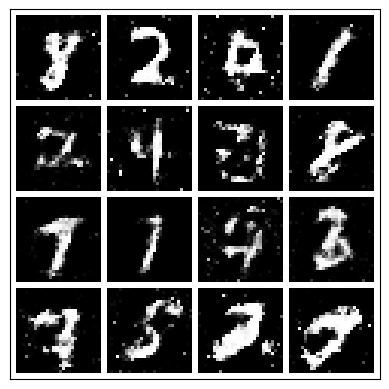

-------------------------------------
                Epoch 29:
                Step: 3500 |
                D_real Loss: 0.7246 |
                D_fake Loss: 0.5246 |
                D_total Loss: 1.2493 |
                G_Loss: 0.998 |
                Real_score 0.541 |
                Fake_score 0.385
            


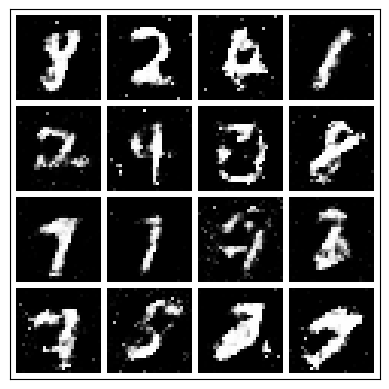

 58%|███████████████████████████████████████████████▌                                  | 29/50 [32:46<22:20, 63.83s/it]

-------------------------------------
                Epoch 30:
                Step: 0 |
                D_real Loss: 0.6339 |
                D_fake Loss: 0.5798 |
                D_total Loss: 1.2138 |
                G_Loss: 1.336 |
                Real_score 0.608 |
                Fake_score 0.376
            


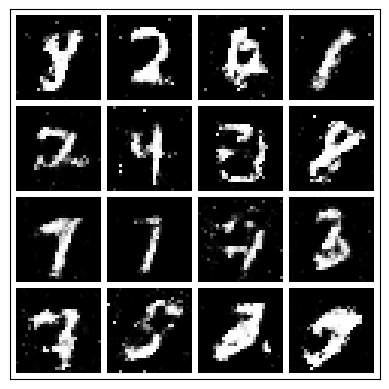

-------------------------------------
                Epoch 30:
                Step: 500 |
                D_real Loss: 0.4679 |
                D_fake Loss: 0.6171 |
                D_total Loss: 1.0850 |
                G_Loss: 1.145 |
                Real_score 0.661 |
                Fake_score 0.417
            


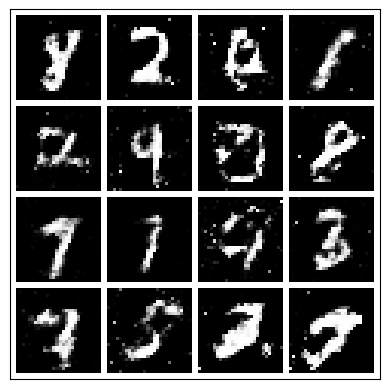

-------------------------------------
                Epoch 30:
                Step: 1000 |
                D_real Loss: 0.7044 |
                D_fake Loss: 0.4439 |
                D_total Loss: 1.1483 |
                G_Loss: 1.457 |
                Real_score 0.582 |
                Fake_score 0.324
            


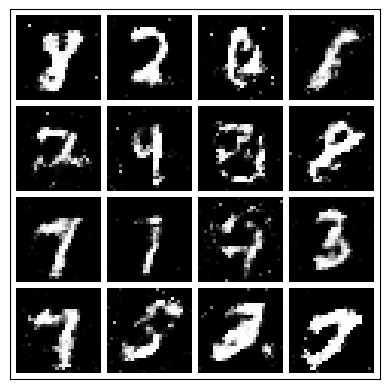

-------------------------------------
                Epoch 30:
                Step: 1500 |
                D_real Loss: 0.4066 |
                D_fake Loss: 0.6119 |
                D_total Loss: 1.0185 |
                G_Loss: 1.042 |
                Real_score 0.717 |
                Fake_score 0.425
            


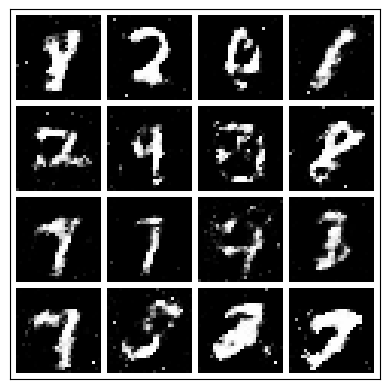

-------------------------------------
                Epoch 30:
                Step: 2000 |
                D_real Loss: 0.2612 |
                D_fake Loss: 0.4106 |
                D_total Loss: 0.6718 |
                G_Loss: 1.307 |
                Real_score 0.800 |
                Fake_score 0.313
            


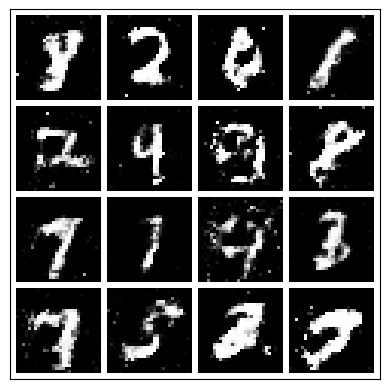

-------------------------------------
                Epoch 30:
                Step: 2500 |
                D_real Loss: 0.5624 |
                D_fake Loss: 0.5822 |
                D_total Loss: 1.1445 |
                G_Loss: 1.020 |
                Real_score 0.635 |
                Fake_score 0.399
            


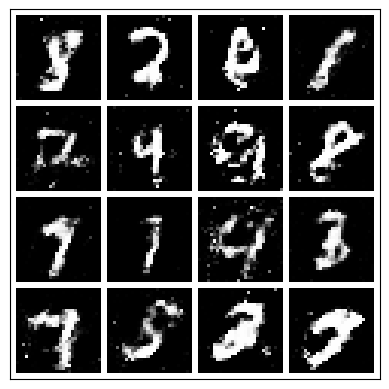

-------------------------------------
                Epoch 30:
                Step: 3000 |
                D_real Loss: 0.4132 |
                D_fake Loss: 0.7337 |
                D_total Loss: 1.1468 |
                G_Loss: 0.885 |
                Real_score 0.707 |
                Fake_score 0.490
            


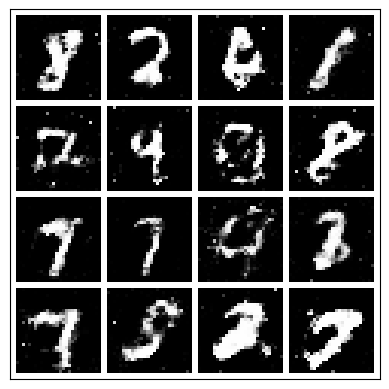

-------------------------------------
                Epoch 30:
                Step: 3500 |
                D_real Loss: 0.5949 |
                D_fake Loss: 0.4685 |
                D_total Loss: 1.0634 |
                G_Loss: 1.152 |
                Real_score 0.610 |
                Fake_score 0.359
            


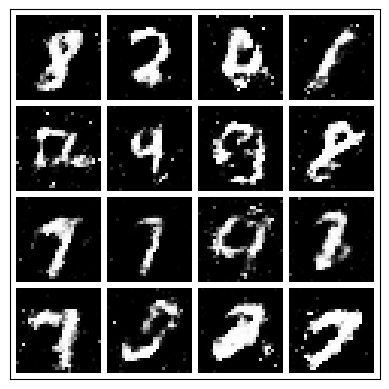

 60%|█████████████████████████████████████████████████▏                                | 30/50 [33:49<21:14, 63.74s/it]

-------------------------------------
                Epoch 31:
                Step: 0 |
                D_real Loss: 0.7652 |
                D_fake Loss: 0.4899 |
                D_total Loss: 1.2551 |
                G_Loss: 1.223 |
                Real_score 0.547 |
                Fake_score 0.368
            


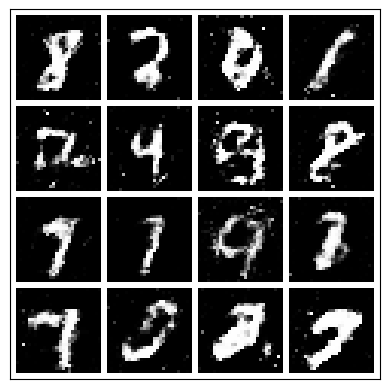

-------------------------------------
                Epoch 31:
                Step: 500 |
                D_real Loss: 0.6318 |
                D_fake Loss: 0.5946 |
                D_total Loss: 1.2264 |
                G_Loss: 1.140 |
                Real_score 0.586 |
                Fake_score 0.394
            


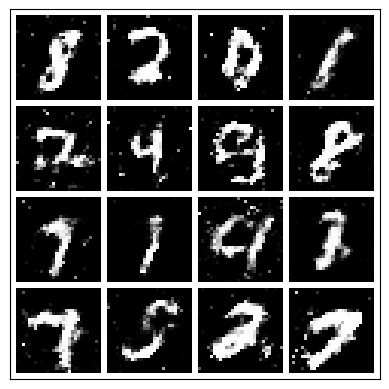

-------------------------------------
                Epoch 31:
                Step: 1000 |
                D_real Loss: 0.4653 |
                D_fake Loss: 0.4599 |
                D_total Loss: 0.9252 |
                G_Loss: 1.242 |
                Real_score 0.691 |
                Fake_score 0.356
            


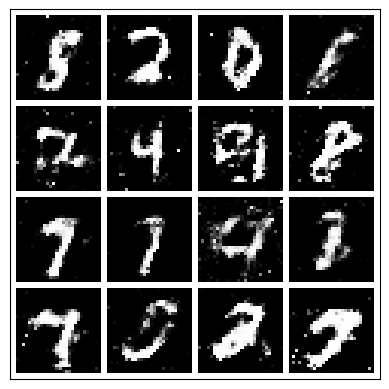

-------------------------------------
                Epoch 31:
                Step: 1500 |
                D_real Loss: 0.7752 |
                D_fake Loss: 0.6927 |
                D_total Loss: 1.4679 |
                G_Loss: 1.131 |
                Real_score 0.581 |
                Fake_score 0.430
            


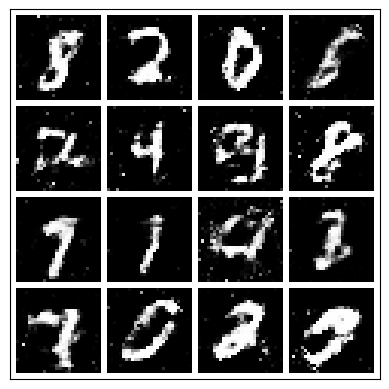

-------------------------------------
                Epoch 31:
                Step: 2000 |
                D_real Loss: 0.6447 |
                D_fake Loss: 0.4237 |
                D_total Loss: 1.0685 |
                G_Loss: 0.950 |
                Real_score 0.594 |
                Fake_score 0.325
            


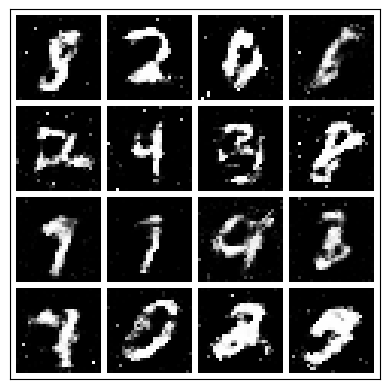

-------------------------------------
                Epoch 31:
                Step: 2500 |
                D_real Loss: 0.5010 |
                D_fake Loss: 0.4141 |
                D_total Loss: 0.9151 |
                G_Loss: 1.186 |
                Real_score 0.669 |
                Fake_score 0.333
            


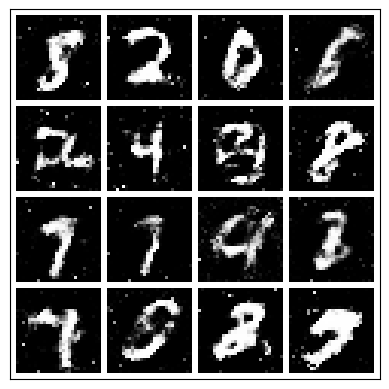

-------------------------------------
                Epoch 31:
                Step: 3000 |
                D_real Loss: 0.5216 |
                D_fake Loss: 0.4397 |
                D_total Loss: 0.9614 |
                G_Loss: 1.289 |
                Real_score 0.630 |
                Fake_score 0.333
            


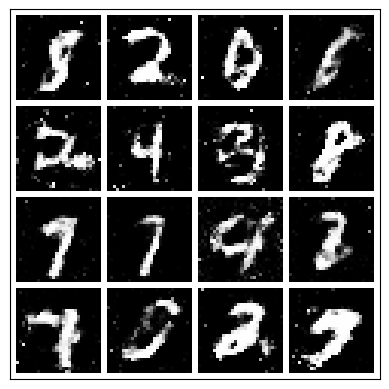

-------------------------------------
                Epoch 31:
                Step: 3500 |
                D_real Loss: 0.6289 |
                D_fake Loss: 0.7273 |
                D_total Loss: 1.3562 |
                G_Loss: 0.996 |
                Real_score 0.601 |
                Fake_score 0.461
            


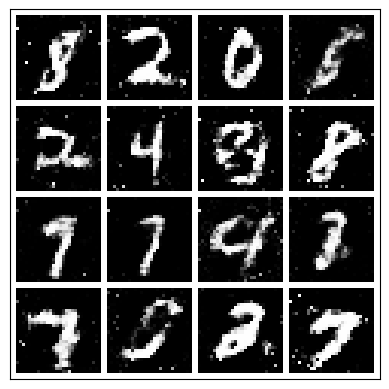

 62%|██████████████████████████████████████████████████▊                               | 31/50 [34:54<20:16, 64.01s/it]

-------------------------------------
                Epoch 32:
                Step: 0 |
                D_real Loss: 0.5481 |
                D_fake Loss: 0.4143 |
                D_total Loss: 0.9625 |
                G_Loss: 1.421 |
                Real_score 0.607 |
                Fake_score 0.332
            


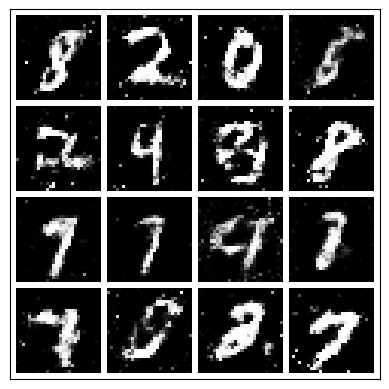

-------------------------------------
                Epoch 32:
                Step: 500 |
                D_real Loss: 0.5397 |
                D_fake Loss: 0.6561 |
                D_total Loss: 1.1958 |
                G_Loss: 1.085 |
                Real_score 0.632 |
                Fake_score 0.430
            


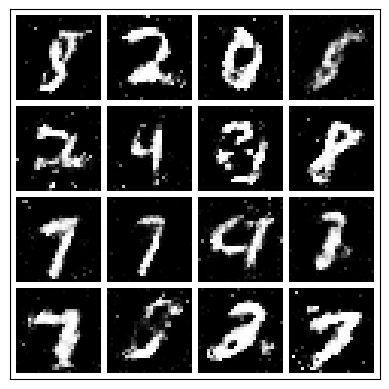

-------------------------------------
                Epoch 32:
                Step: 1000 |
                D_real Loss: 0.4494 |
                D_fake Loss: 0.5799 |
                D_total Loss: 1.0294 |
                G_Loss: 0.952 |
                Real_score 0.658 |
                Fake_score 0.402
            


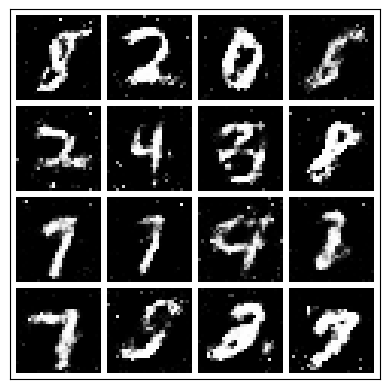

-------------------------------------
                Epoch 32:
                Step: 1500 |
                D_real Loss: 0.5315 |
                D_fake Loss: 0.7314 |
                D_total Loss: 1.2629 |
                G_Loss: 1.184 |
                Real_score 0.663 |
                Fake_score 0.426
            


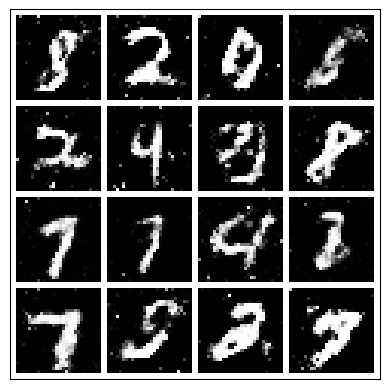

-------------------------------------
                Epoch 32:
                Step: 2000 |
                D_real Loss: 0.6027 |
                D_fake Loss: 0.3594 |
                D_total Loss: 0.9621 |
                G_Loss: 1.130 |
                Real_score 0.597 |
                Fake_score 0.273
            


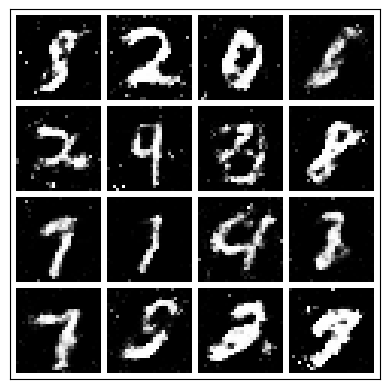

-------------------------------------
                Epoch 32:
                Step: 2500 |
                D_real Loss: 0.5622 |
                D_fake Loss: 0.4461 |
                D_total Loss: 1.0083 |
                G_Loss: 1.293 |
                Real_score 0.602 |
                Fake_score 0.330
            


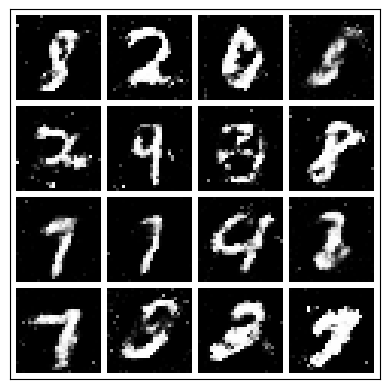

-------------------------------------
                Epoch 32:
                Step: 3000 |
                D_real Loss: 0.3327 |
                D_fake Loss: 0.5020 |
                D_total Loss: 0.8347 |
                G_Loss: 0.994 |
                Real_score 0.731 |
                Fake_score 0.382
            


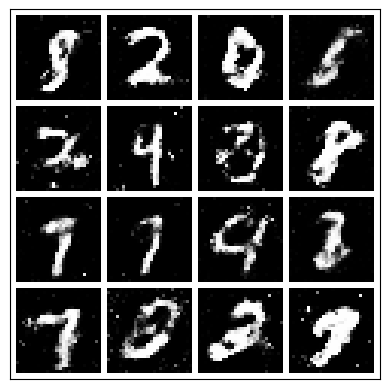

-------------------------------------
                Epoch 32:
                Step: 3500 |
                D_real Loss: 0.4770 |
                D_fake Loss: 0.4521 |
                D_total Loss: 0.9291 |
                G_Loss: 1.123 |
                Real_score 0.666 |
                Fake_score 0.345
            


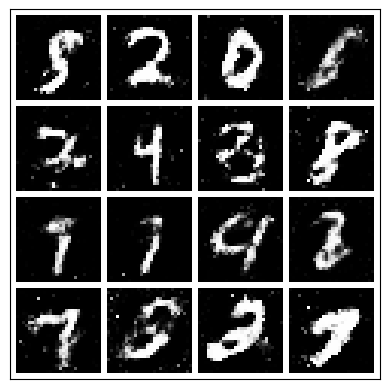

 64%|████████████████████████████████████████████████████▍                             | 32/50 [35:58<19:09, 63.87s/it]

-------------------------------------
                Epoch 33:
                Step: 0 |
                D_real Loss: 0.3659 |
                D_fake Loss: 0.4140 |
                D_total Loss: 0.7798 |
                G_Loss: 1.253 |
                Real_score 0.734 |
                Fake_score 0.319
            


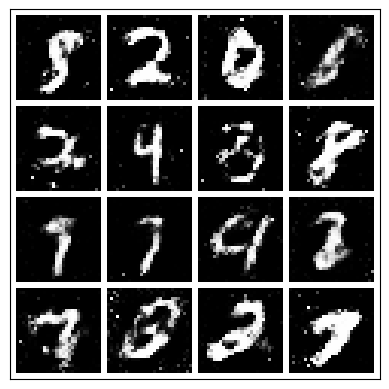

-------------------------------------
                Epoch 33:
                Step: 500 |
                D_real Loss: 0.5749 |
                D_fake Loss: 0.4146 |
                D_total Loss: 0.9894 |
                G_Loss: 1.339 |
                Real_score 0.622 |
                Fake_score 0.315
            


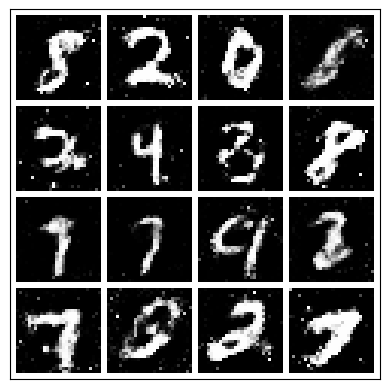

-------------------------------------
                Epoch 33:
                Step: 1000 |
                D_real Loss: 0.4161 |
                D_fake Loss: 0.6281 |
                D_total Loss: 1.0441 |
                G_Loss: 0.752 |
                Real_score 0.719 |
                Fake_score 0.447
            


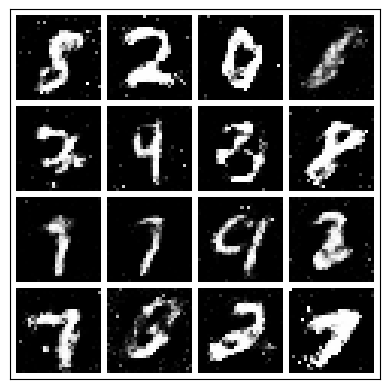

-------------------------------------
                Epoch 33:
                Step: 1500 |
                D_real Loss: 0.7500 |
                D_fake Loss: 0.4930 |
                D_total Loss: 1.2431 |
                G_Loss: 1.070 |
                Real_score 0.522 |
                Fake_score 0.353
            


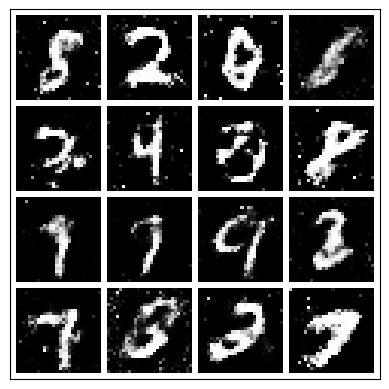

-------------------------------------
                Epoch 33:
                Step: 2000 |
                D_real Loss: 0.4929 |
                D_fake Loss: 0.5640 |
                D_total Loss: 1.0568 |
                G_Loss: 1.293 |
                Real_score 0.652 |
                Fake_score 0.410
            


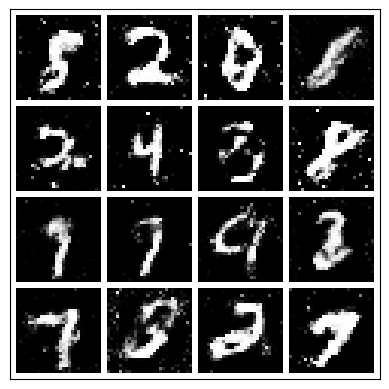

-------------------------------------
                Epoch 33:
                Step: 2500 |
                D_real Loss: 0.5100 |
                D_fake Loss: 0.5987 |
                D_total Loss: 1.1087 |
                G_Loss: 1.004 |
                Real_score 0.634 |
                Fake_score 0.412
            


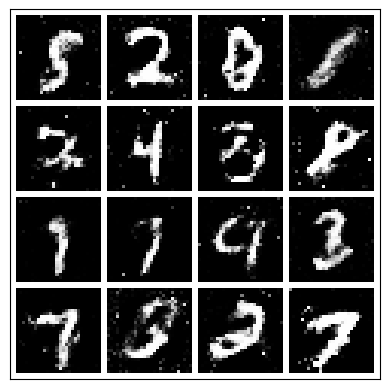

-------------------------------------
                Epoch 33:
                Step: 3000 |
                D_real Loss: 0.8796 |
                D_fake Loss: 0.3843 |
                D_total Loss: 1.2638 |
                G_Loss: 1.098 |
                Real_score 0.462 |
                Fake_score 0.295
            


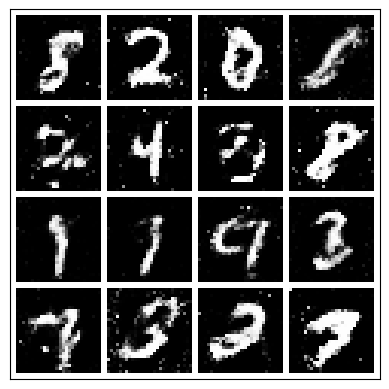

-------------------------------------
                Epoch 33:
                Step: 3500 |
                D_real Loss: 0.7665 |
                D_fake Loss: 0.4653 |
                D_total Loss: 1.2318 |
                G_Loss: 0.978 |
                Real_score 0.508 |
                Fake_score 0.336
            


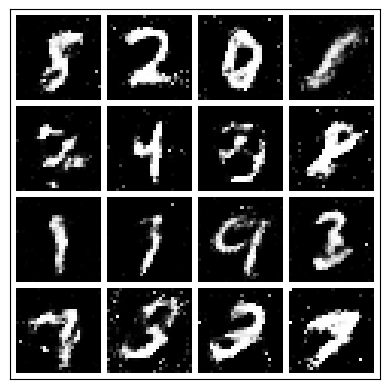

 66%|██████████████████████████████████████████████████████                            | 33/50 [37:01<18:03, 63.76s/it]

-------------------------------------
                Epoch 34:
                Step: 0 |
                D_real Loss: 0.5251 |
                D_fake Loss: 0.5989 |
                D_total Loss: 1.1240 |
                G_Loss: 0.972 |
                Real_score 0.632 |
                Fake_score 0.420
            


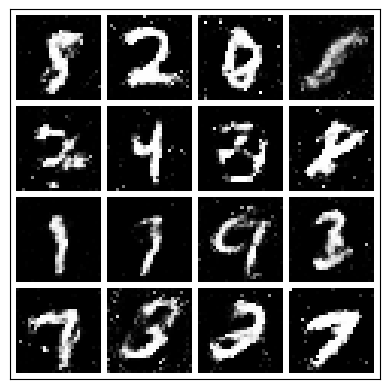

-------------------------------------
                Epoch 34:
                Step: 500 |
                D_real Loss: 0.6670 |
                D_fake Loss: 0.5295 |
                D_total Loss: 1.1965 |
                G_Loss: 1.102 |
                Real_score 0.565 |
                Fake_score 0.385
            


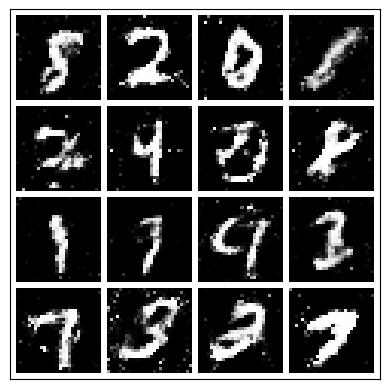

-------------------------------------
                Epoch 34:
                Step: 1000 |
                D_real Loss: 0.5679 |
                D_fake Loss: 0.3894 |
                D_total Loss: 0.9573 |
                G_Loss: 0.891 |
                Real_score 0.653 |
                Fake_score 0.309
            


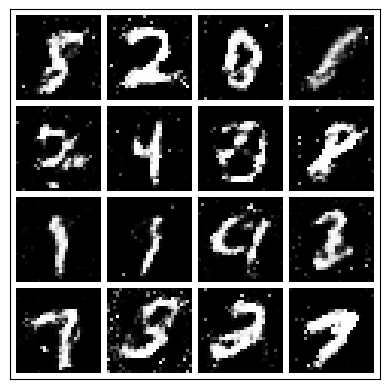

-------------------------------------
                Epoch 34:
                Step: 1500 |
                D_real Loss: 0.5302 |
                D_fake Loss: 0.6545 |
                D_total Loss: 1.1848 |
                G_Loss: 0.980 |
                Real_score 0.647 |
                Fake_score 0.435
            


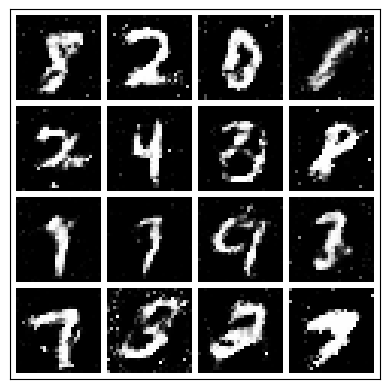

-------------------------------------
                Epoch 34:
                Step: 2000 |
                D_real Loss: 0.4756 |
                D_fake Loss: 0.6257 |
                D_total Loss: 1.1013 |
                G_Loss: 1.138 |
                Real_score 0.678 |
                Fake_score 0.431
            


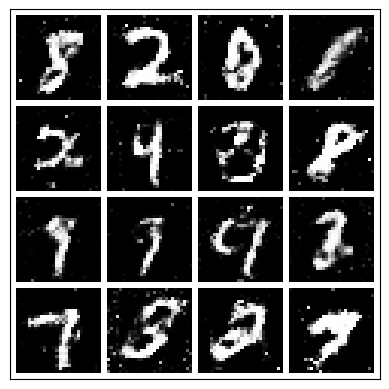

-------------------------------------
                Epoch 34:
                Step: 2500 |
                D_real Loss: 0.6035 |
                D_fake Loss: 0.6267 |
                D_total Loss: 1.2302 |
                G_Loss: 1.082 |
                Real_score 0.591 |
                Fake_score 0.402
            


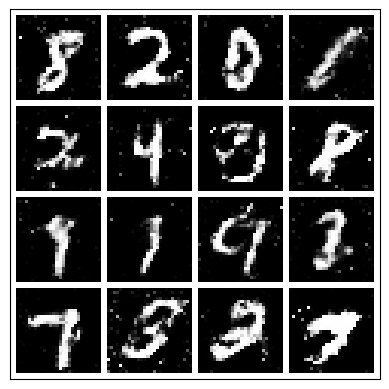

-------------------------------------
                Epoch 34:
                Step: 3000 |
                D_real Loss: 0.6228 |
                D_fake Loss: 0.3442 |
                D_total Loss: 0.9670 |
                G_Loss: 1.257 |
                Real_score 0.578 |
                Fake_score 0.280
            


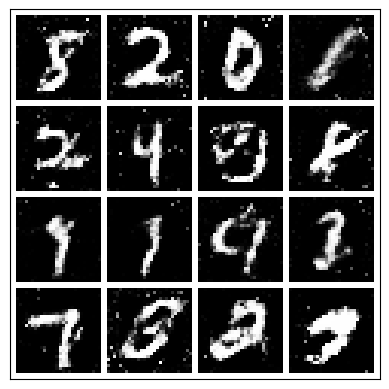

-------------------------------------
                Epoch 34:
                Step: 3500 |
                D_real Loss: 0.6045 |
                D_fake Loss: 0.5459 |
                D_total Loss: 1.1504 |
                G_Loss: 1.100 |
                Real_score 0.599 |
                Fake_score 0.393
            


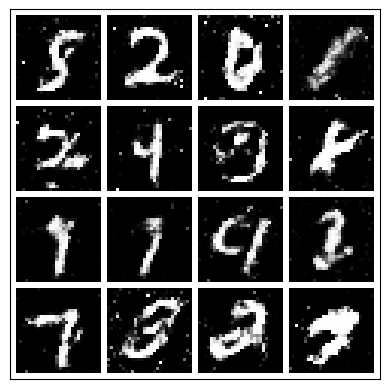

 68%|███████████████████████████████████████████████████████▊                          | 34/50 [38:05<16:58, 63.67s/it]

-------------------------------------
                Epoch 35:
                Step: 0 |
                D_real Loss: 0.5693 |
                D_fake Loss: 0.5616 |
                D_total Loss: 1.1309 |
                G_Loss: 1.348 |
                Real_score 0.615 |
                Fake_score 0.354
            


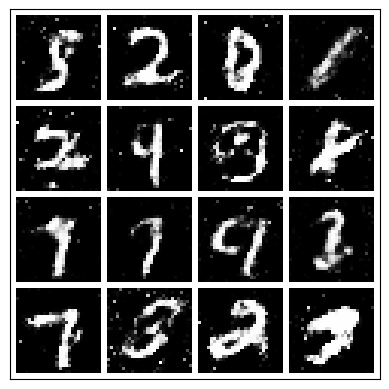

-------------------------------------
                Epoch 35:
                Step: 500 |
                D_real Loss: 0.8325 |
                D_fake Loss: 0.3703 |
                D_total Loss: 1.2029 |
                G_Loss: 1.030 |
                Real_score 0.480 |
                Fake_score 0.288
            


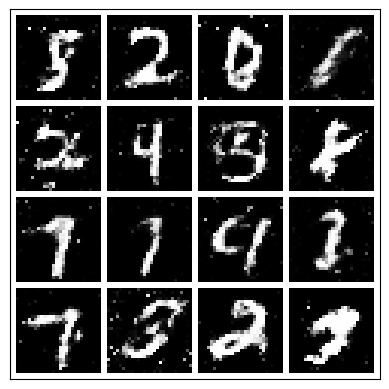

-------------------------------------
                Epoch 35:
                Step: 1000 |
                D_real Loss: 0.5144 |
                D_fake Loss: 0.6868 |
                D_total Loss: 1.2012 |
                G_Loss: 0.898 |
                Real_score 0.664 |
                Fake_score 0.442
            


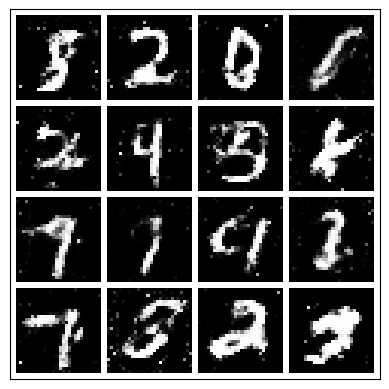

-------------------------------------
                Epoch 35:
                Step: 1500 |
                D_real Loss: 0.6456 |
                D_fake Loss: 0.4310 |
                D_total Loss: 1.0766 |
                G_Loss: 1.352 |
                Real_score 0.590 |
                Fake_score 0.329
            


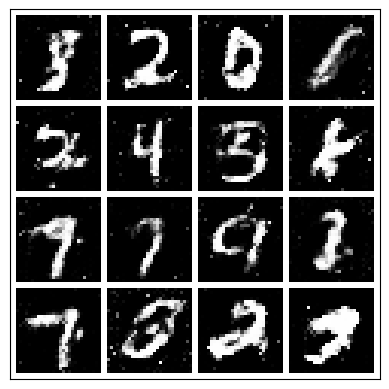

-------------------------------------
                Epoch 35:
                Step: 2000 |
                D_real Loss: 0.5284 |
                D_fake Loss: 0.5112 |
                D_total Loss: 1.0396 |
                G_Loss: 0.951 |
                Real_score 0.646 |
                Fake_score 0.389
            


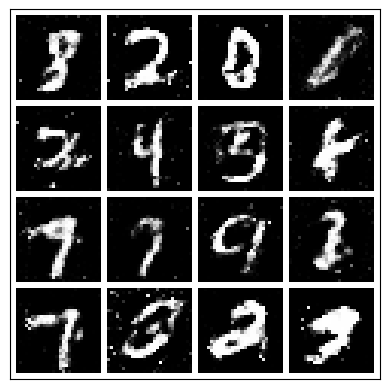

-------------------------------------
                Epoch 35:
                Step: 2500 |
                D_real Loss: 0.6171 |
                D_fake Loss: 0.6058 |
                D_total Loss: 1.2229 |
                G_Loss: 1.296 |
                Real_score 0.586 |
                Fake_score 0.408
            


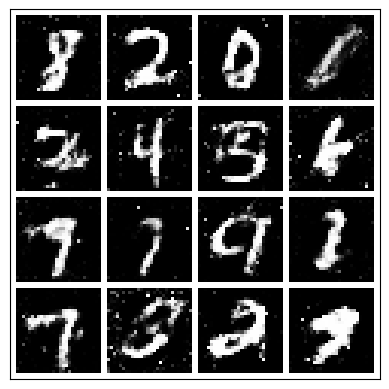

-------------------------------------
                Epoch 35:
                Step: 3000 |
                D_real Loss: 0.8094 |
                D_fake Loss: 0.4901 |
                D_total Loss: 1.2995 |
                G_Loss: 1.092 |
                Real_score 0.477 |
                Fake_score 0.364
            


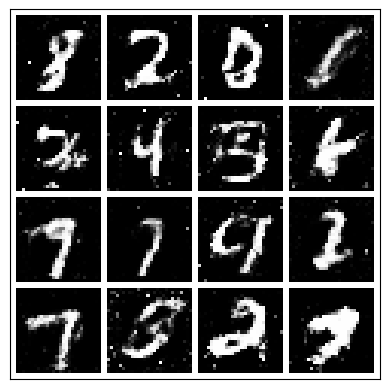

-------------------------------------
                Epoch 35:
                Step: 3500 |
                D_real Loss: 0.5312 |
                D_fake Loss: 0.8233 |
                D_total Loss: 1.3545 |
                G_Loss: 0.825 |
                Real_score 0.641 |
                Fake_score 0.485
            


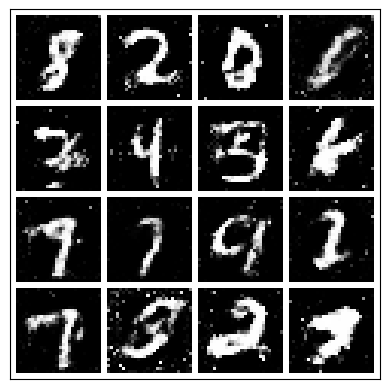

 70%|█████████████████████████████████████████████████████████▍                        | 35/50 [39:08<15:54, 63.65s/it]

-------------------------------------
                Epoch 36:
                Step: 0 |
                D_real Loss: 0.8889 |
                D_fake Loss: 0.4931 |
                D_total Loss: 1.3820 |
                G_Loss: 1.251 |
                Real_score 0.480 |
                Fake_score 0.314
            


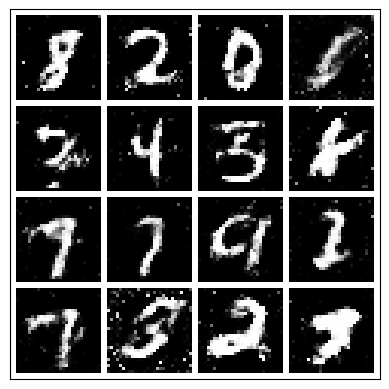

-------------------------------------
                Epoch 36:
                Step: 500 |
                D_real Loss: 0.3961 |
                D_fake Loss: 0.4916 |
                D_total Loss: 0.8877 |
                G_Loss: 1.311 |
                Real_score 0.705 |
                Fake_score 0.357
            


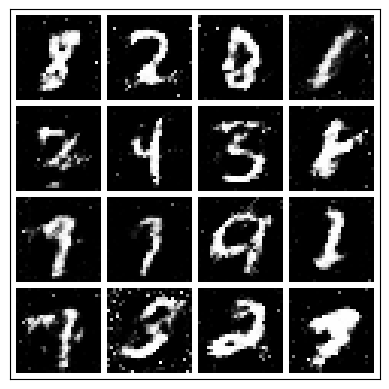

-------------------------------------
                Epoch 36:
                Step: 1000 |
                D_real Loss: 0.6273 |
                D_fake Loss: 0.5094 |
                D_total Loss: 1.1367 |
                G_Loss: 1.043 |
                Real_score 0.585 |
                Fake_score 0.377
            


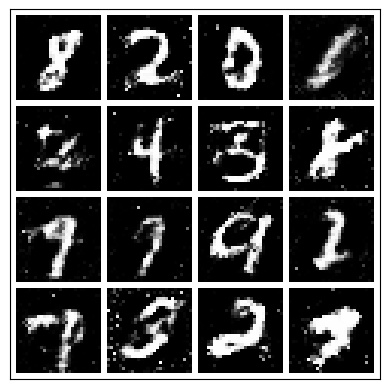

-------------------------------------
                Epoch 36:
                Step: 1500 |
                D_real Loss: 0.6981 |
                D_fake Loss: 0.6317 |
                D_total Loss: 1.3298 |
                G_Loss: 1.156 |
                Real_score 0.555 |
                Fake_score 0.409
            


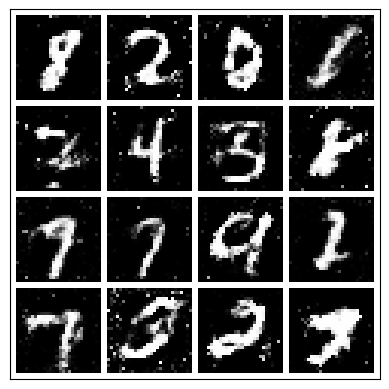

-------------------------------------
                Epoch 36:
                Step: 2000 |
                D_real Loss: 0.4818 |
                D_fake Loss: 0.6648 |
                D_total Loss: 1.1467 |
                G_Loss: 0.797 |
                Real_score 0.658 |
                Fake_score 0.460
            


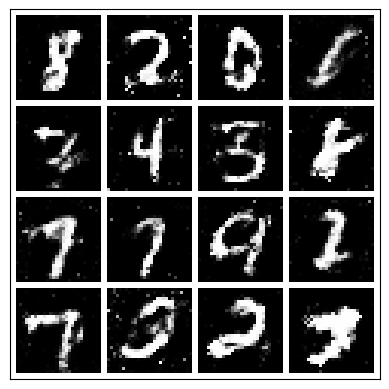

-------------------------------------
                Epoch 36:
                Step: 2500 |
                D_real Loss: 0.5308 |
                D_fake Loss: 0.7194 |
                D_total Loss: 1.2501 |
                G_Loss: 0.854 |
                Real_score 0.642 |
                Fake_score 0.458
            


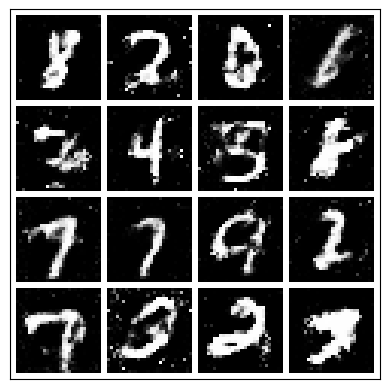

-------------------------------------
                Epoch 36:
                Step: 3000 |
                D_real Loss: 0.7014 |
                D_fake Loss: 0.4773 |
                D_total Loss: 1.1786 |
                G_Loss: 1.215 |
                Real_score 0.542 |
                Fake_score 0.348
            


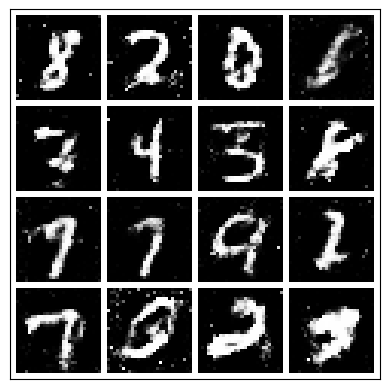

-------------------------------------
                Epoch 36:
                Step: 3500 |
                D_real Loss: 0.5090 |
                D_fake Loss: 0.6695 |
                D_total Loss: 1.1784 |
                G_Loss: 0.913 |
                Real_score 0.627 |
                Fake_score 0.431
            


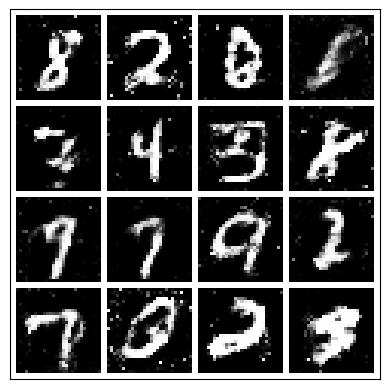

 72%|███████████████████████████████████████████████████████████                       | 36/50 [40:12<14:50, 63.59s/it]

-------------------------------------
                Epoch 37:
                Step: 0 |
                D_real Loss: 0.5203 |
                D_fake Loss: 0.6919 |
                D_total Loss: 1.2122 |
                G_Loss: 0.911 |
                Real_score 0.624 |
                Fake_score 0.474
            


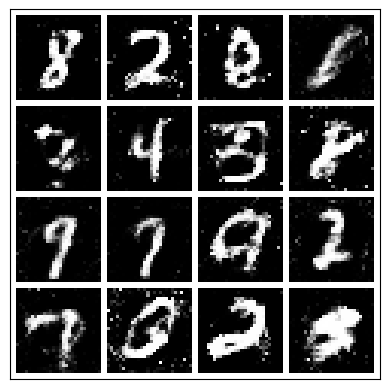

-------------------------------------
                Epoch 37:
                Step: 500 |
                D_real Loss: 0.6084 |
                D_fake Loss: 0.4700 |
                D_total Loss: 1.0784 |
                G_Loss: 1.051 |
                Real_score 0.586 |
                Fake_score 0.349
            


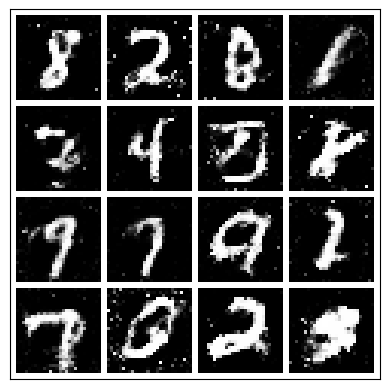

-------------------------------------
                Epoch 37:
                Step: 1000 |
                D_real Loss: 0.5523 |
                D_fake Loss: 0.4876 |
                D_total Loss: 1.0398 |
                G_Loss: 1.094 |
                Real_score 0.617 |
                Fake_score 0.364
            


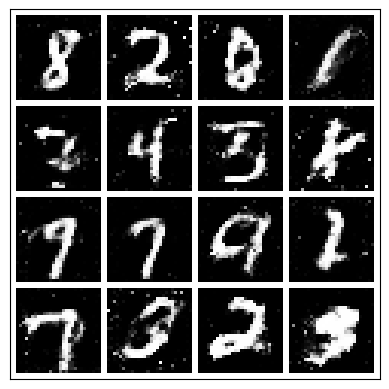

-------------------------------------
                Epoch 37:
                Step: 1500 |
                D_real Loss: 0.7095 |
                D_fake Loss: 0.3361 |
                D_total Loss: 1.0455 |
                G_Loss: 1.309 |
                Real_score 0.546 |
                Fake_score 0.270
            


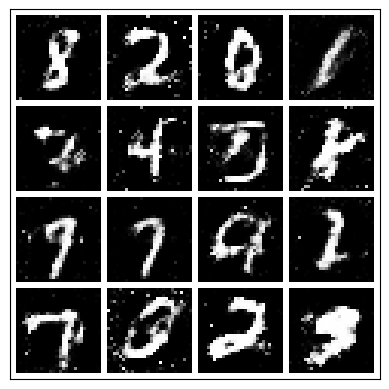

-------------------------------------
                Epoch 37:
                Step: 2000 |
                D_real Loss: 0.8089 |
                D_fake Loss: 0.6175 |
                D_total Loss: 1.4264 |
                G_Loss: 1.074 |
                Real_score 0.513 |
                Fake_score 0.399
            


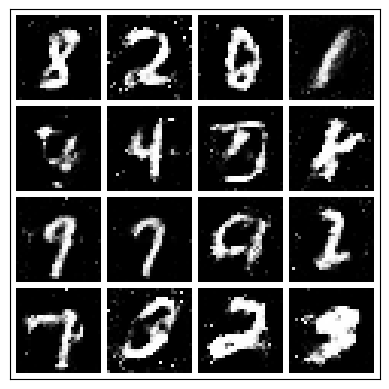

-------------------------------------
                Epoch 37:
                Step: 2500 |
                D_real Loss: 0.6961 |
                D_fake Loss: 0.5322 |
                D_total Loss: 1.2283 |
                G_Loss: 1.015 |
                Real_score 0.536 |
                Fake_score 0.407
            


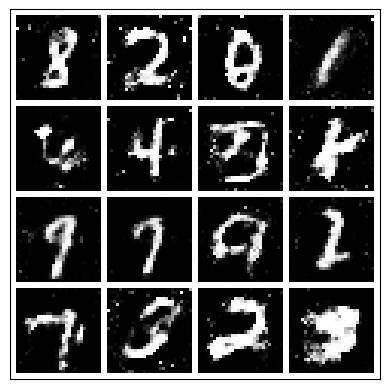

-------------------------------------
                Epoch 37:
                Step: 3000 |
                D_real Loss: 0.4919 |
                D_fake Loss: 0.6643 |
                D_total Loss: 1.1562 |
                G_Loss: 0.989 |
                Real_score 0.673 |
                Fake_score 0.467
            


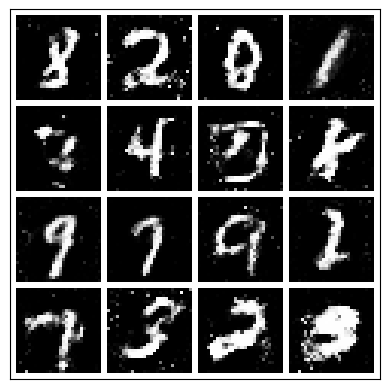

-------------------------------------
                Epoch 37:
                Step: 3500 |
                D_real Loss: 0.7065 |
                D_fake Loss: 0.4870 |
                D_total Loss: 1.1935 |
                G_Loss: 1.049 |
                Real_score 0.569 |
                Fake_score 0.356
            


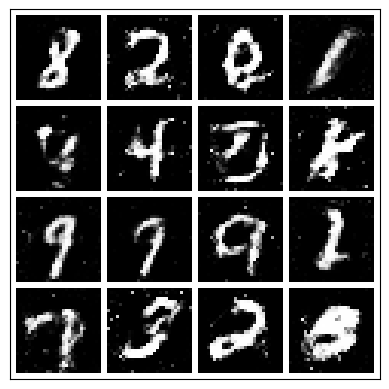

 74%|████████████████████████████████████████████████████████████▋                     | 37/50 [41:15<13:47, 63.62s/it]

-------------------------------------
                Epoch 38:
                Step: 0 |
                D_real Loss: 0.7157 |
                D_fake Loss: 0.9613 |
                D_total Loss: 1.6769 |
                G_Loss: 0.974 |
                Real_score 0.539 |
                Fake_score 0.500
            


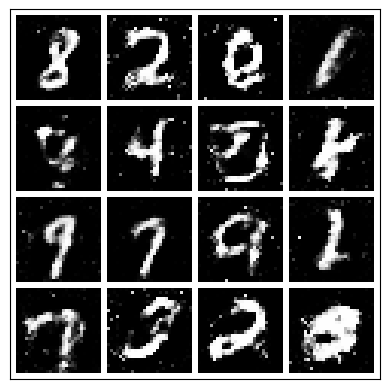

-------------------------------------
                Epoch 38:
                Step: 500 |
                D_real Loss: 0.5845 |
                D_fake Loss: 0.4901 |
                D_total Loss: 1.0746 |
                G_Loss: 1.205 |
                Real_score 0.601 |
                Fake_score 0.358
            


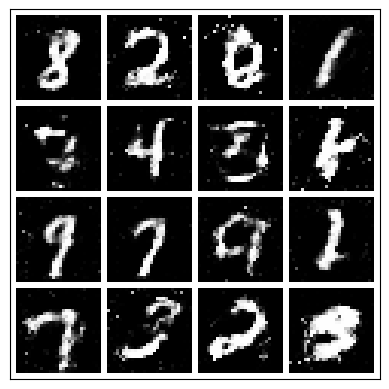

-------------------------------------
                Epoch 38:
                Step: 1000 |
                D_real Loss: 0.4579 |
                D_fake Loss: 0.4580 |
                D_total Loss: 0.9159 |
                G_Loss: 0.945 |
                Real_score 0.680 |
                Fake_score 0.352
            


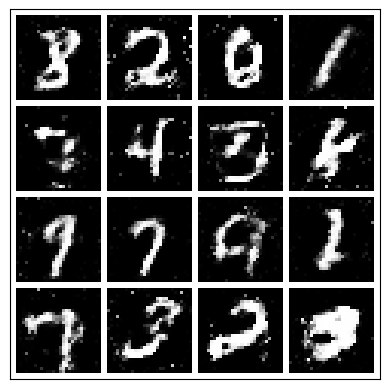

-------------------------------------
                Epoch 38:
                Step: 1500 |
                D_real Loss: 0.3553 |
                D_fake Loss: 0.7779 |
                D_total Loss: 1.1332 |
                G_Loss: 0.925 |
                Real_score 0.731 |
                Fake_score 0.488
            


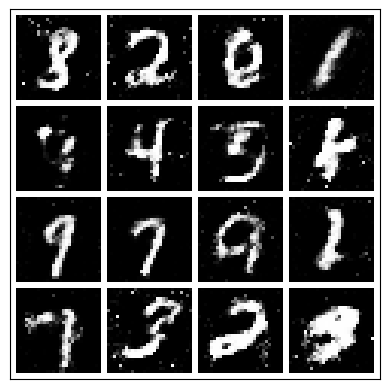

-------------------------------------
                Epoch 38:
                Step: 2000 |
                D_real Loss: 0.6625 |
                D_fake Loss: 0.6305 |
                D_total Loss: 1.2930 |
                G_Loss: 0.836 |
                Real_score 0.564 |
                Fake_score 0.425
            


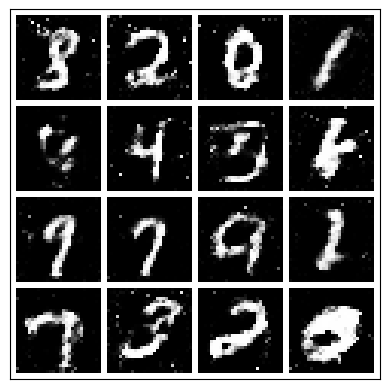

-------------------------------------
                Epoch 38:
                Step: 2500 |
                D_real Loss: 0.6089 |
                D_fake Loss: 0.5811 |
                D_total Loss: 1.1900 |
                G_Loss: 0.993 |
                Real_score 0.601 |
                Fake_score 0.411
            


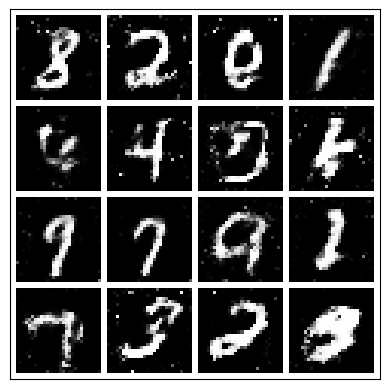

-------------------------------------
                Epoch 38:
                Step: 3000 |
                D_real Loss: 0.6998 |
                D_fake Loss: 0.4649 |
                D_total Loss: 1.1647 |
                G_Loss: 1.273 |
                Real_score 0.548 |
                Fake_score 0.354
            


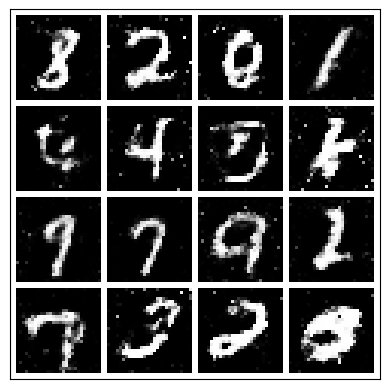

-------------------------------------
                Epoch 38:
                Step: 3500 |
                D_real Loss: 0.7282 |
                D_fake Loss: 0.5751 |
                D_total Loss: 1.3033 |
                G_Loss: 1.097 |
                Real_score 0.541 |
                Fake_score 0.401
            


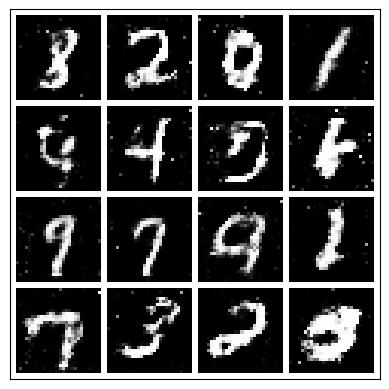

 76%|██████████████████████████████████████████████████████████████▎                   | 38/50 [42:19<12:43, 63.59s/it]

-------------------------------------
                Epoch 39:
                Step: 0 |
                D_real Loss: 0.6529 |
                D_fake Loss: 0.5037 |
                D_total Loss: 1.1567 |
                G_Loss: 1.033 |
                Real_score 0.582 |
                Fake_score 0.384
            


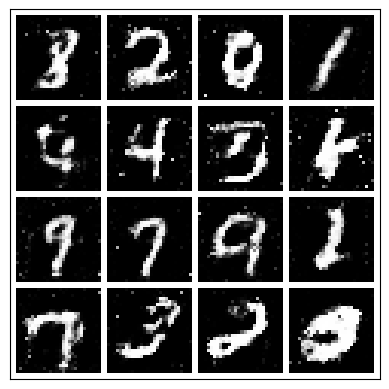

-------------------------------------
                Epoch 39:
                Step: 500 |
                D_real Loss: 0.6957 |
                D_fake Loss: 0.7572 |
                D_total Loss: 1.4529 |
                G_Loss: 0.848 |
                Real_score 0.533 |
                Fake_score 0.475
            


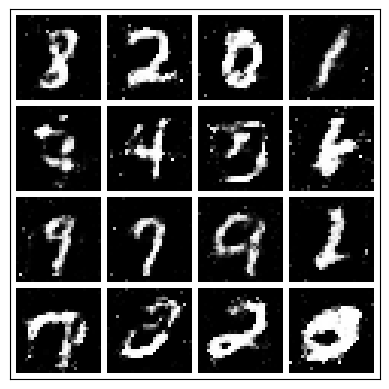

-------------------------------------
                Epoch 39:
                Step: 1000 |
                D_real Loss: 0.5242 |
                D_fake Loss: 0.6564 |
                D_total Loss: 1.1805 |
                G_Loss: 0.944 |
                Real_score 0.641 |
                Fake_score 0.447
            


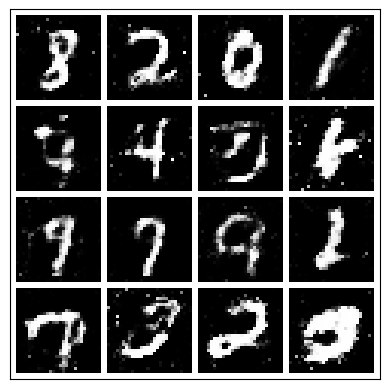

-------------------------------------
                Epoch 39:
                Step: 1500 |
                D_real Loss: 0.6798 |
                D_fake Loss: 0.4398 |
                D_total Loss: 1.1196 |
                G_Loss: 1.351 |
                Real_score 0.553 |
                Fake_score 0.329
            


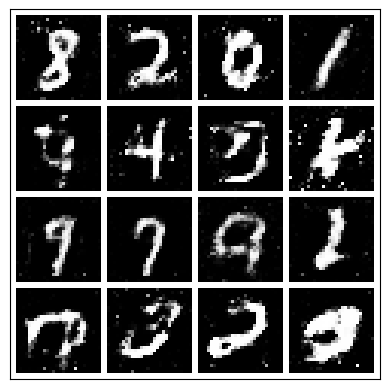

-------------------------------------
                Epoch 39:
                Step: 2000 |
                D_real Loss: 0.5413 |
                D_fake Loss: 0.9379 |
                D_total Loss: 1.4792 |
                G_Loss: 0.771 |
                Real_score 0.621 |
                Fake_score 0.538
            


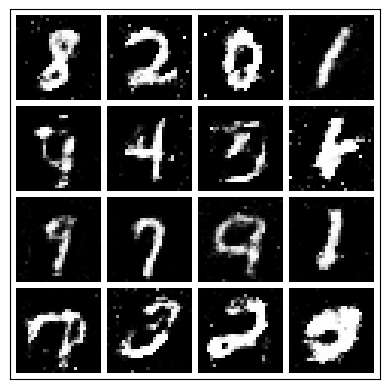

-------------------------------------
                Epoch 39:
                Step: 2500 |
                D_real Loss: 0.5039 |
                D_fake Loss: 0.4650 |
                D_total Loss: 0.9689 |
                G_Loss: 1.069 |
                Real_score 0.637 |
                Fake_score 0.360
            


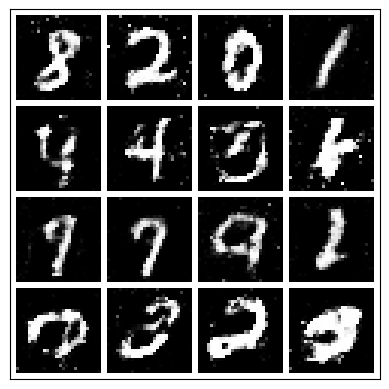

-------------------------------------
                Epoch 39:
                Step: 3000 |
                D_real Loss: 0.4653 |
                D_fake Loss: 0.5087 |
                D_total Loss: 0.9740 |
                G_Loss: 0.861 |
                Real_score 0.674 |
                Fake_score 0.362
            


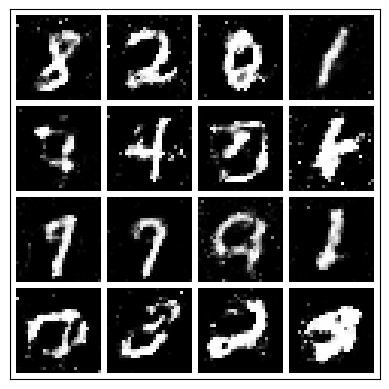

-------------------------------------
                Epoch 39:
                Step: 3500 |
                D_real Loss: 0.5442 |
                D_fake Loss: 0.5202 |
                D_total Loss: 1.0643 |
                G_Loss: 1.041 |
                Real_score 0.620 |
                Fake_score 0.377
            


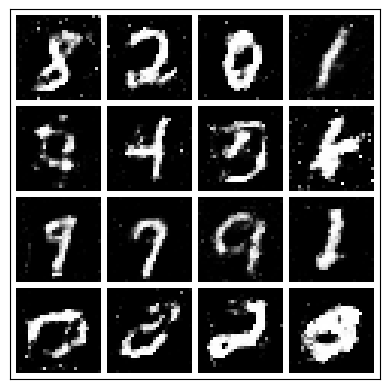

 78%|███████████████████████████████████████████████████████████████▉                  | 39/50 [43:23<11:39, 63.62s/it]

-------------------------------------
                Epoch 40:
                Step: 0 |
                D_real Loss: 0.3661 |
                D_fake Loss: 0.7239 |
                D_total Loss: 1.0899 |
                G_Loss: 0.984 |
                Real_score 0.722 |
                Fake_score 0.478
            


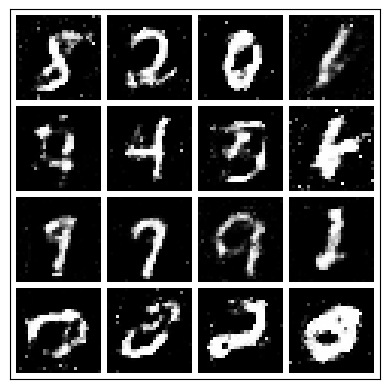

-------------------------------------
                Epoch 40:
                Step: 500 |
                D_real Loss: 0.7224 |
                D_fake Loss: 0.3316 |
                D_total Loss: 1.0540 |
                G_Loss: 1.159 |
                Real_score 0.534 |
                Fake_score 0.274
            


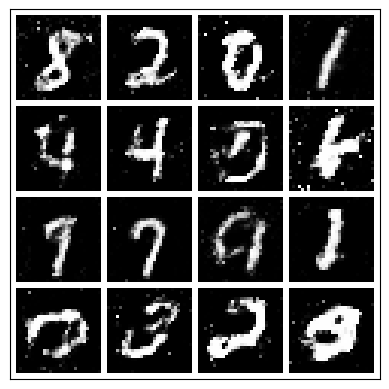

-------------------------------------
                Epoch 40:
                Step: 1000 |
                D_real Loss: 0.6581 |
                D_fake Loss: 0.5712 |
                D_total Loss: 1.2293 |
                G_Loss: 0.866 |
                Real_score 0.552 |
                Fake_score 0.401
            


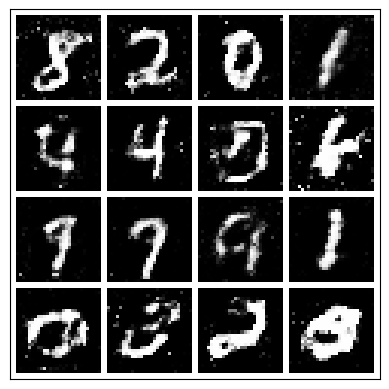

-------------------------------------
                Epoch 40:
                Step: 1500 |
                D_real Loss: 0.6006 |
                D_fake Loss: 0.5137 |
                D_total Loss: 1.1143 |
                G_Loss: 1.149 |
                Real_score 0.586 |
                Fake_score 0.371
            


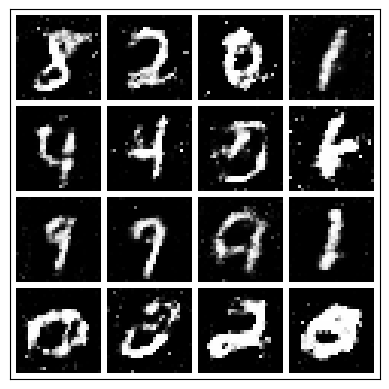

-------------------------------------
                Epoch 40:
                Step: 2000 |
                D_real Loss: 0.5843 |
                D_fake Loss: 0.6427 |
                D_total Loss: 1.2271 |
                G_Loss: 1.159 |
                Real_score 0.592 |
                Fake_score 0.434
            


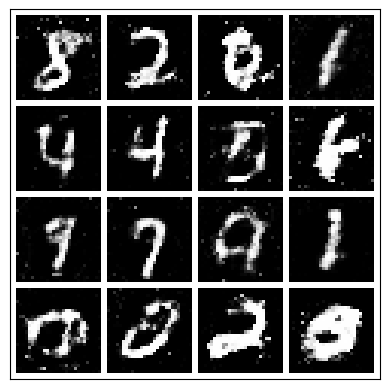

-------------------------------------
                Epoch 40:
                Step: 2500 |
                D_real Loss: 0.7028 |
                D_fake Loss: 0.4616 |
                D_total Loss: 1.1644 |
                G_Loss: 1.067 |
                Real_score 0.547 |
                Fake_score 0.347
            


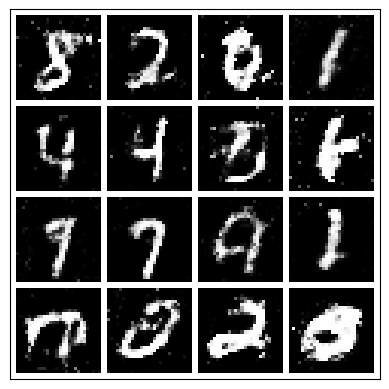

-------------------------------------
                Epoch 40:
                Step: 3000 |
                D_real Loss: 0.6251 |
                D_fake Loss: 0.6043 |
                D_total Loss: 1.2294 |
                G_Loss: 1.096 |
                Real_score 0.567 |
                Fake_score 0.391
            


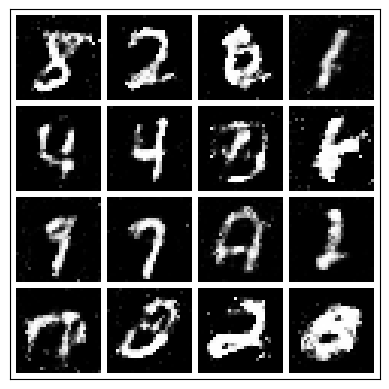

-------------------------------------
                Epoch 40:
                Step: 3500 |
                D_real Loss: 0.5564 |
                D_fake Loss: 0.5782 |
                D_total Loss: 1.1346 |
                G_Loss: 1.165 |
                Real_score 0.631 |
                Fake_score 0.401
            


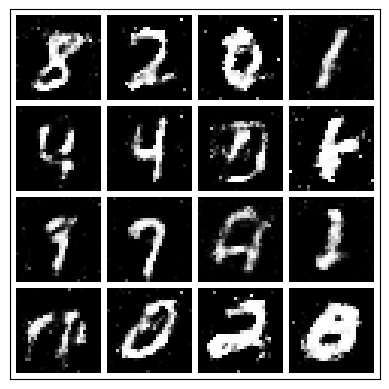

 80%|█████████████████████████████████████████████████████████████████▌                | 40/50 [44:26<10:36, 63.61s/it]

-------------------------------------
                Epoch 41:
                Step: 0 |
                D_real Loss: 0.3506 |
                D_fake Loss: 0.7295 |
                D_total Loss: 1.0801 |
                G_Loss: 0.830 |
                Real_score 0.740 |
                Fake_score 0.470
            


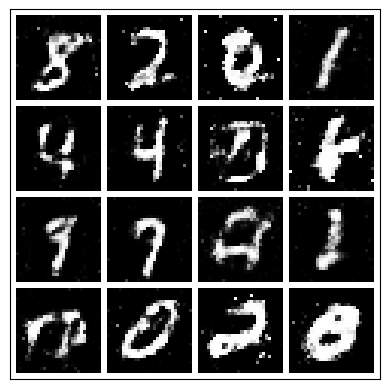

-------------------------------------
                Epoch 41:
                Step: 500 |
                D_real Loss: 0.6580 |
                D_fake Loss: 0.7673 |
                D_total Loss: 1.4252 |
                G_Loss: 0.931 |
                Real_score 0.573 |
                Fake_score 0.457
            


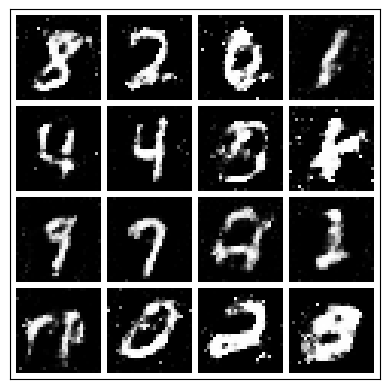

-------------------------------------
                Epoch 41:
                Step: 1000 |
                D_real Loss: 0.6510 |
                D_fake Loss: 0.5070 |
                D_total Loss: 1.1579 |
                G_Loss: 1.125 |
                Real_score 0.582 |
                Fake_score 0.369
            


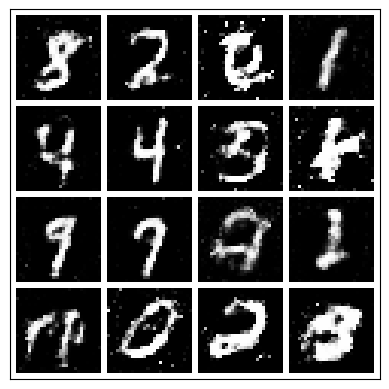

-------------------------------------
                Epoch 41:
                Step: 1500 |
                D_real Loss: 0.4059 |
                D_fake Loss: 0.7288 |
                D_total Loss: 1.1347 |
                G_Loss: 0.886 |
                Real_score 0.698 |
                Fake_score 0.485
            


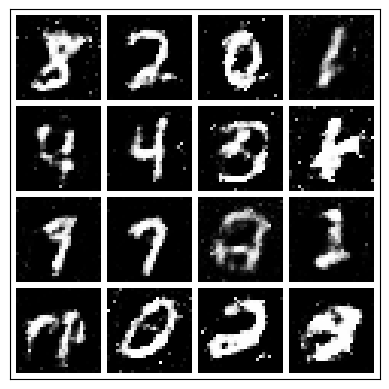

-------------------------------------
                Epoch 41:
                Step: 2000 |
                D_real Loss: 0.6879 |
                D_fake Loss: 0.3797 |
                D_total Loss: 1.0676 |
                G_Loss: 1.281 |
                Real_score 0.572 |
                Fake_score 0.297
            


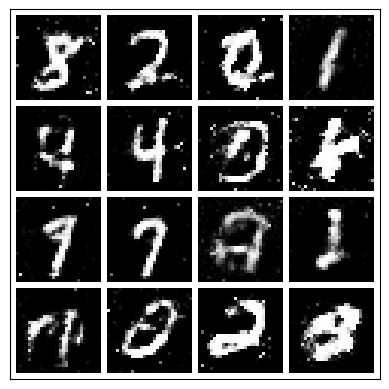

-------------------------------------
                Epoch 41:
                Step: 2500 |
                D_real Loss: 0.7290 |
                D_fake Loss: 0.5582 |
                D_total Loss: 1.2872 |
                G_Loss: 1.071 |
                Real_score 0.551 |
                Fake_score 0.372
            


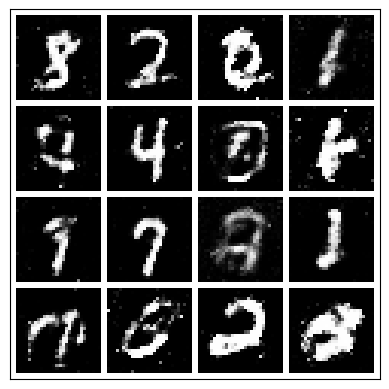

-------------------------------------
                Epoch 41:
                Step: 3000 |
                D_real Loss: 0.4274 |
                D_fake Loss: 0.6123 |
                D_total Loss: 1.0397 |
                G_Loss: 0.907 |
                Real_score 0.693 |
                Fake_score 0.428
            


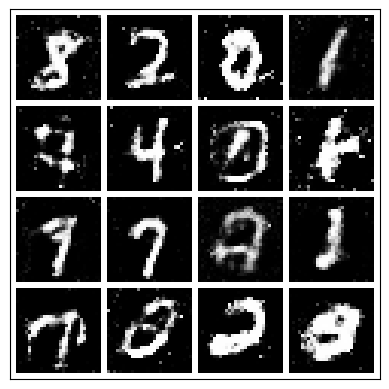

-------------------------------------
                Epoch 41:
                Step: 3500 |
                D_real Loss: 0.5420 |
                D_fake Loss: 0.7934 |
                D_total Loss: 1.3354 |
                G_Loss: 1.028 |
                Real_score 0.623 |
                Fake_score 0.504
            


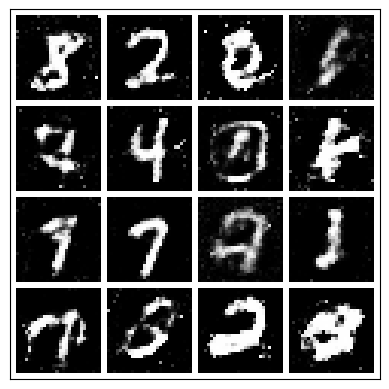

 82%|███████████████████████████████████████████████████████████████████▏              | 41/50 [45:30<09:32, 63.65s/it]

-------------------------------------
                Epoch 42:
                Step: 0 |
                D_real Loss: 0.5166 |
                D_fake Loss: 0.4607 |
                D_total Loss: 0.9773 |
                G_Loss: 1.085 |
                Real_score 0.669 |
                Fake_score 0.356
            


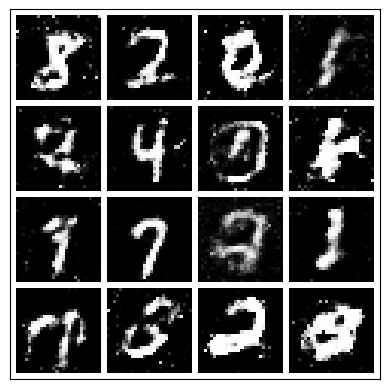

-------------------------------------
                Epoch 42:
                Step: 500 |
                D_real Loss: 0.6753 |
                D_fake Loss: 0.6767 |
                D_total Loss: 1.3520 |
                G_Loss: 0.852 |
                Real_score 0.543 |
                Fake_score 0.452
            


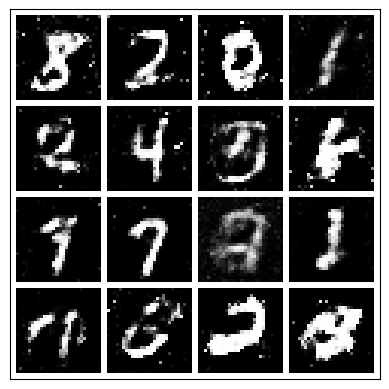

-------------------------------------
                Epoch 42:
                Step: 1000 |
                D_real Loss: 0.6045 |
                D_fake Loss: 0.6521 |
                D_total Loss: 1.2566 |
                G_Loss: 0.940 |
                Real_score 0.587 |
                Fake_score 0.433
            


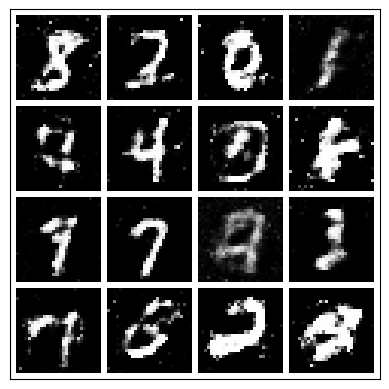

-------------------------------------
                Epoch 42:
                Step: 1500 |
                D_real Loss: 0.5001 |
                D_fake Loss: 0.6014 |
                D_total Loss: 1.1015 |
                G_Loss: 1.184 |
                Real_score 0.645 |
                Fake_score 0.421
            


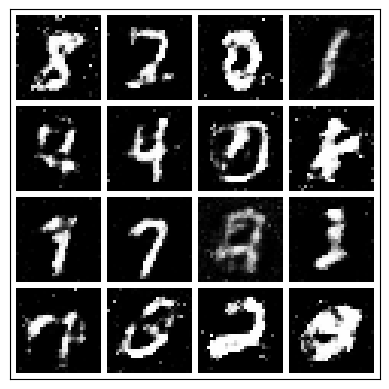

-------------------------------------
                Epoch 42:
                Step: 2000 |
                D_real Loss: 0.9817 |
                D_fake Loss: 0.4900 |
                D_total Loss: 1.4717 |
                G_Loss: 1.277 |
                Real_score 0.471 |
                Fake_score 0.310
            


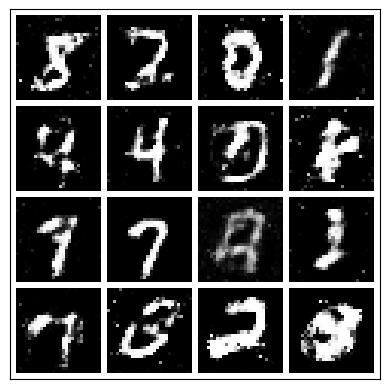

-------------------------------------
                Epoch 42:
                Step: 2500 |
                D_real Loss: 0.6650 |
                D_fake Loss: 0.6212 |
                D_total Loss: 1.2862 |
                G_Loss: 1.032 |
                Real_score 0.557 |
                Fake_score 0.435
            


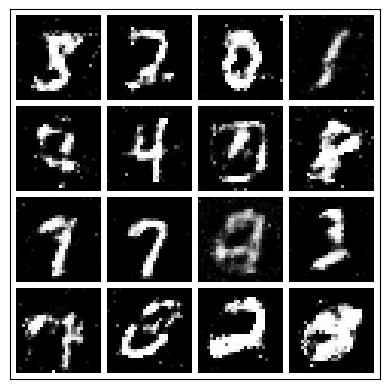

-------------------------------------
                Epoch 42:
                Step: 3000 |
                D_real Loss: 0.6566 |
                D_fake Loss: 0.6113 |
                D_total Loss: 1.2679 |
                G_Loss: 1.169 |
                Real_score 0.555 |
                Fake_score 0.428
            


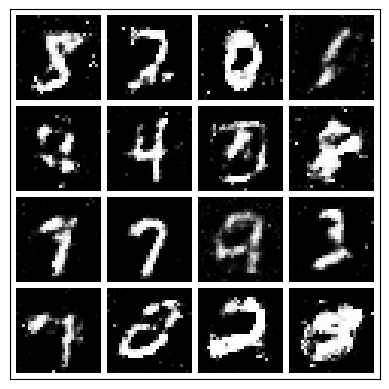

-------------------------------------
                Epoch 42:
                Step: 3500 |
                D_real Loss: 1.0017 |
                D_fake Loss: 0.4510 |
                D_total Loss: 1.4527 |
                G_Loss: 1.156 |
                Real_score 0.426 |
                Fake_score 0.351
            


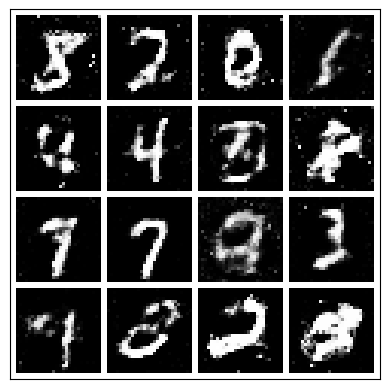

 84%|████████████████████████████████████████████████████████████████████▉             | 42/50 [46:34<08:29, 63.66s/it]

-------------------------------------
                Epoch 43:
                Step: 0 |
                D_real Loss: 0.5020 |
                D_fake Loss: 0.7731 |
                D_total Loss: 1.2751 |
                G_Loss: 0.883 |
                Real_score 0.645 |
                Fake_score 0.450
            


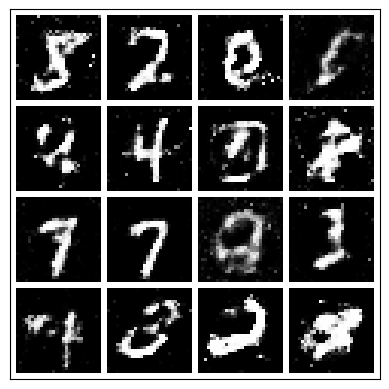

-------------------------------------
                Epoch 43:
                Step: 500 |
                D_real Loss: 0.5436 |
                D_fake Loss: 0.4122 |
                D_total Loss: 0.9558 |
                G_Loss: 1.081 |
                Real_score 0.611 |
                Fake_score 0.323
            


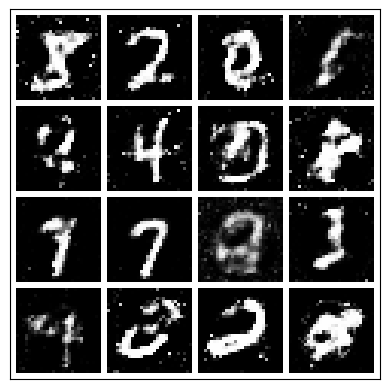

-------------------------------------
                Epoch 43:
                Step: 1000 |
                D_real Loss: 0.6795 |
                D_fake Loss: 0.4889 |
                D_total Loss: 1.1683 |
                G_Loss: 1.234 |
                Real_score 0.555 |
                Fake_score 0.353
            


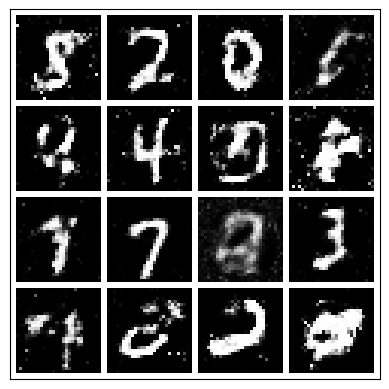

-------------------------------------
                Epoch 43:
                Step: 1500 |
                D_real Loss: 0.6992 |
                D_fake Loss: 0.4890 |
                D_total Loss: 1.1883 |
                G_Loss: 0.854 |
                Real_score 0.524 |
                Fake_score 0.366
            


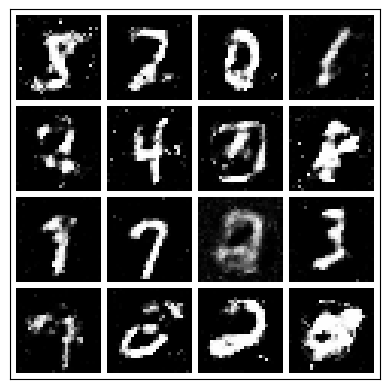

-------------------------------------
                Epoch 43:
                Step: 2000 |
                D_real Loss: 0.4499 |
                D_fake Loss: 0.7790 |
                D_total Loss: 1.2289 |
                G_Loss: 0.855 |
                Real_score 0.669 |
                Fake_score 0.466
            


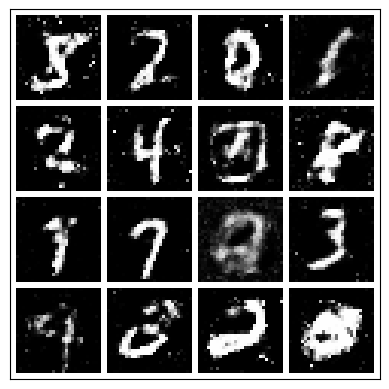

-------------------------------------
                Epoch 43:
                Step: 2500 |
                D_real Loss: 0.4543 |
                D_fake Loss: 0.7373 |
                D_total Loss: 1.1916 |
                G_Loss: 1.061 |
                Real_score 0.668 |
                Fake_score 0.464
            


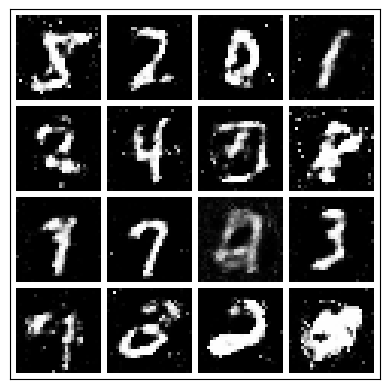

-------------------------------------
                Epoch 43:
                Step: 3000 |
                D_real Loss: 0.5992 |
                D_fake Loss: 0.4856 |
                D_total Loss: 1.0848 |
                G_Loss: 1.309 |
                Real_score 0.613 |
                Fake_score 0.361
            


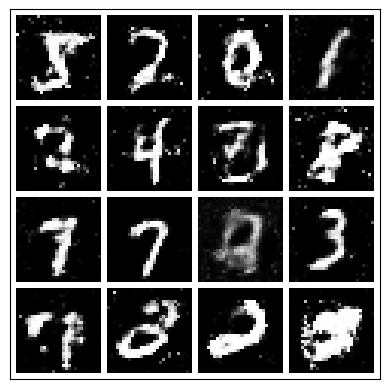

-------------------------------------
                Epoch 43:
                Step: 3500 |
                D_real Loss: 0.5631 |
                D_fake Loss: 0.5527 |
                D_total Loss: 1.1158 |
                G_Loss: 1.066 |
                Real_score 0.604 |
                Fake_score 0.394
            


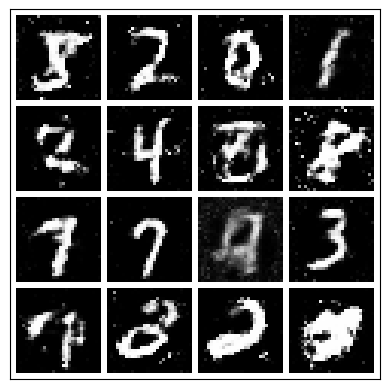

 86%|██████████████████████████████████████████████████████████████████████▌           | 43/50 [47:37<07:25, 63.64s/it]

-------------------------------------
                Epoch 44:
                Step: 0 |
                D_real Loss: 0.5704 |
                D_fake Loss: 0.6166 |
                D_total Loss: 1.1870 |
                G_Loss: 0.984 |
                Real_score 0.602 |
                Fake_score 0.443
            


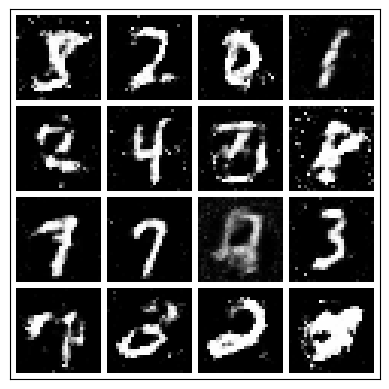

-------------------------------------
                Epoch 44:
                Step: 500 |
                D_real Loss: 0.7170 |
                D_fake Loss: 0.6566 |
                D_total Loss: 1.3735 |
                G_Loss: 0.912 |
                Real_score 0.549 |
                Fake_score 0.435
            


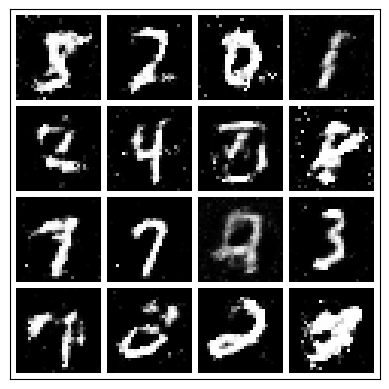

-------------------------------------
                Epoch 44:
                Step: 1000 |
                D_real Loss: 0.3041 |
                D_fake Loss: 0.6269 |
                D_total Loss: 0.9309 |
                G_Loss: 1.084 |
                Real_score 0.765 |
                Fake_score 0.425
            


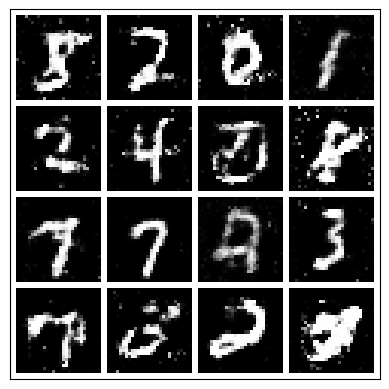

-------------------------------------
                Epoch 44:
                Step: 1500 |
                D_real Loss: 0.6104 |
                D_fake Loss: 0.7138 |
                D_total Loss: 1.3242 |
                G_Loss: 1.112 |
                Real_score 0.624 |
                Fake_score 0.440
            


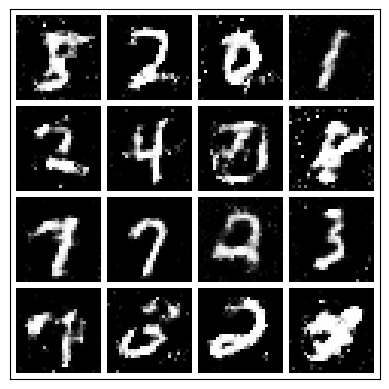

-------------------------------------
                Epoch 44:
                Step: 2000 |
                D_real Loss: 0.7696 |
                D_fake Loss: 0.6254 |
                D_total Loss: 1.3950 |
                G_Loss: 1.032 |
                Real_score 0.491 |
                Fake_score 0.430
            


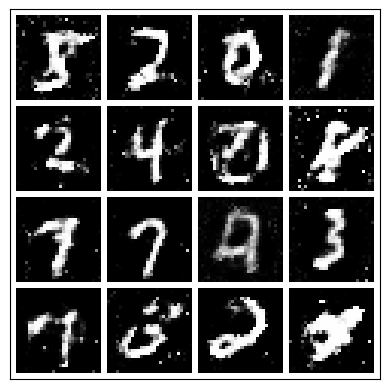

-------------------------------------
                Epoch 44:
                Step: 2500 |
                D_real Loss: 0.5760 |
                D_fake Loss: 0.8008 |
                D_total Loss: 1.3768 |
                G_Loss: 0.846 |
                Real_score 0.600 |
                Fake_score 0.516
            


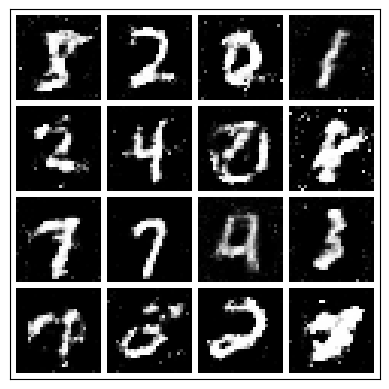

-------------------------------------
                Epoch 44:
                Step: 3000 |
                D_real Loss: 0.6628 |
                D_fake Loss: 0.5645 |
                D_total Loss: 1.2273 |
                G_Loss: 1.144 |
                Real_score 0.569 |
                Fake_score 0.418
            


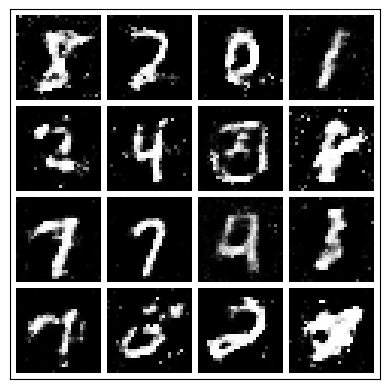

-------------------------------------
                Epoch 44:
                Step: 3500 |
                D_real Loss: 0.6663 |
                D_fake Loss: 0.3987 |
                D_total Loss: 1.0650 |
                G_Loss: 1.185 |
                Real_score 0.530 |
                Fake_score 0.323
            


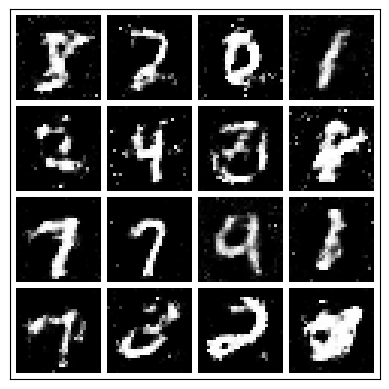

 88%|████████████████████████████████████████████████████████████████████████▏         | 44/50 [48:41<06:21, 63.66s/it]

-------------------------------------
                Epoch 45:
                Step: 0 |
                D_real Loss: 0.7245 |
                D_fake Loss: 0.6719 |
                D_total Loss: 1.3964 |
                G_Loss: 0.954 |
                Real_score 0.512 |
                Fake_score 0.450
            


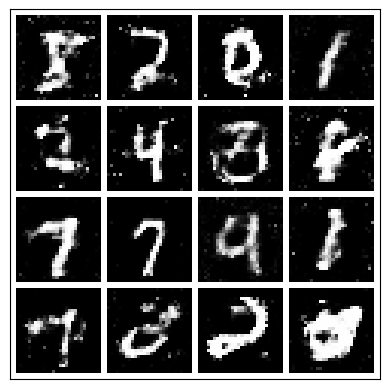

-------------------------------------
                Epoch 45:
                Step: 500 |
                D_real Loss: 0.4511 |
                D_fake Loss: 0.5465 |
                D_total Loss: 0.9976 |
                G_Loss: 0.855 |
                Real_score 0.661 |
                Fake_score 0.409
            


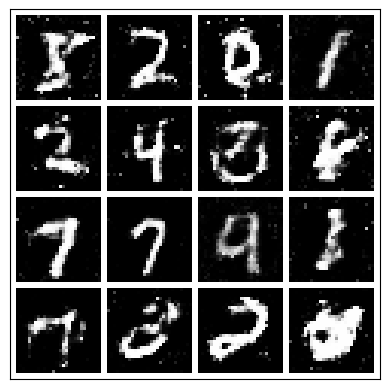

-------------------------------------
                Epoch 45:
                Step: 1000 |
                D_real Loss: 0.8559 |
                D_fake Loss: 0.5208 |
                D_total Loss: 1.3767 |
                G_Loss: 0.898 |
                Real_score 0.486 |
                Fake_score 0.385
            


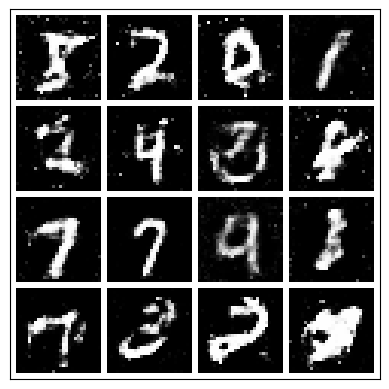

-------------------------------------
                Epoch 45:
                Step: 1500 |
                D_real Loss: 0.7433 |
                D_fake Loss: 0.6949 |
                D_total Loss: 1.4382 |
                G_Loss: 1.177 |
                Real_score 0.509 |
                Fake_score 0.462
            


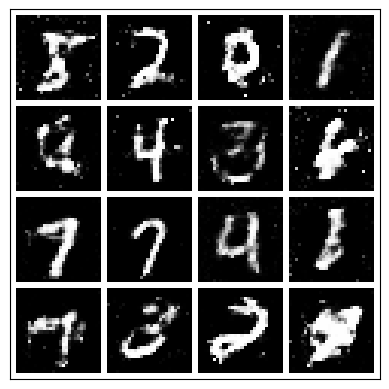

-------------------------------------
                Epoch 45:
                Step: 2000 |
                D_real Loss: 0.5805 |
                D_fake Loss: 0.3945 |
                D_total Loss: 0.9750 |
                G_Loss: 1.207 |
                Real_score 0.595 |
                Fake_score 0.315
            


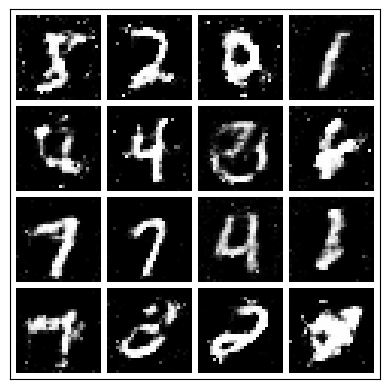

-------------------------------------
                Epoch 45:
                Step: 2500 |
                D_real Loss: 0.5767 |
                D_fake Loss: 0.4989 |
                D_total Loss: 1.0756 |
                G_Loss: 1.020 |
                Real_score 0.598 |
                Fake_score 0.370
            


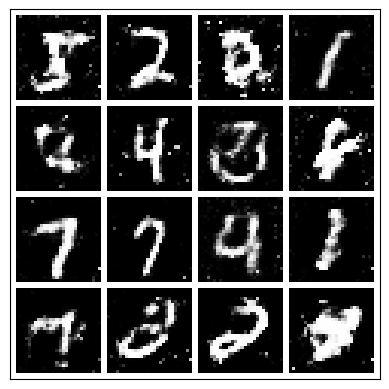

-------------------------------------
                Epoch 45:
                Step: 3000 |
                D_real Loss: 0.6025 |
                D_fake Loss: 0.5411 |
                D_total Loss: 1.1436 |
                G_Loss: 1.048 |
                Real_score 0.583 |
                Fake_score 0.401
            


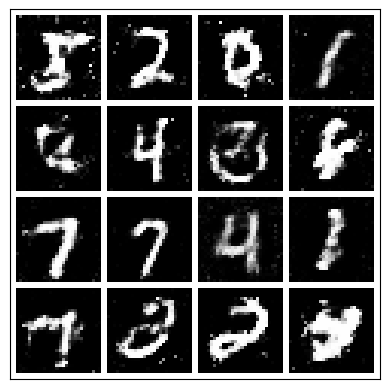

-------------------------------------
                Epoch 45:
                Step: 3500 |
                D_real Loss: 0.5297 |
                D_fake Loss: 0.8185 |
                D_total Loss: 1.3483 |
                G_Loss: 0.807 |
                Real_score 0.636 |
                Fake_score 0.476
            


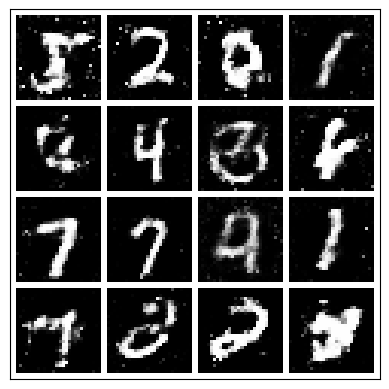

 90%|█████████████████████████████████████████████████████████████████████████▊        | 45/50 [49:44<05:18, 63.63s/it]

-------------------------------------
                Epoch 46:
                Step: 0 |
                D_real Loss: 0.5825 |
                D_fake Loss: 0.5692 |
                D_total Loss: 1.1517 |
                G_Loss: 0.798 |
                Real_score 0.631 |
                Fake_score 0.403
            


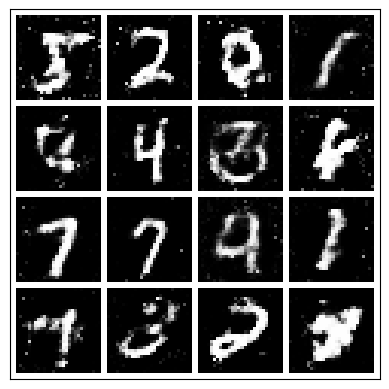

-------------------------------------
                Epoch 46:
                Step: 500 |
                D_real Loss: 0.5412 |
                D_fake Loss: 0.7938 |
                D_total Loss: 1.3350 |
                G_Loss: 0.867 |
                Real_score 0.656 |
                Fake_score 0.494
            


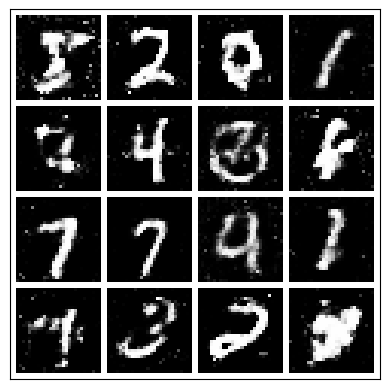

-------------------------------------
                Epoch 46:
                Step: 1000 |
                D_real Loss: 0.7086 |
                D_fake Loss: 0.5099 |
                D_total Loss: 1.2185 |
                G_Loss: 1.085 |
                Real_score 0.538 |
                Fake_score 0.369
            


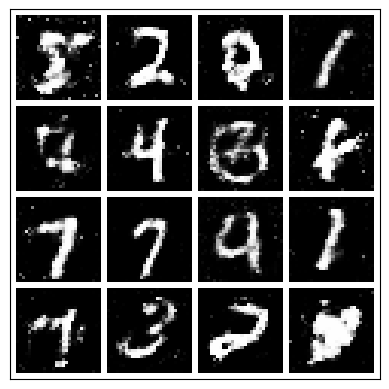

-------------------------------------
                Epoch 46:
                Step: 1500 |
                D_real Loss: 0.3991 |
                D_fake Loss: 0.6527 |
                D_total Loss: 1.0519 |
                G_Loss: 0.950 |
                Real_score 0.708 |
                Fake_score 0.457
            


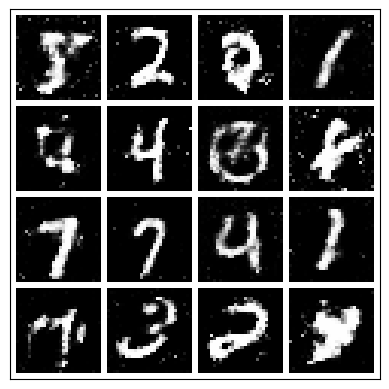

-------------------------------------
                Epoch 46:
                Step: 2000 |
                D_real Loss: 0.5200 |
                D_fake Loss: 0.5538 |
                D_total Loss: 1.0738 |
                G_Loss: 0.801 |
                Real_score 0.630 |
                Fake_score 0.407
            


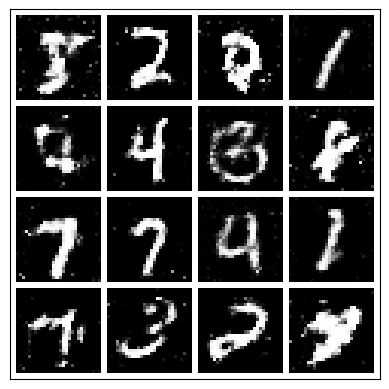

-------------------------------------
                Epoch 46:
                Step: 2500 |
                D_real Loss: 0.6582 |
                D_fake Loss: 0.5936 |
                D_total Loss: 1.2518 |
                G_Loss: 1.051 |
                Real_score 0.558 |
                Fake_score 0.411
            


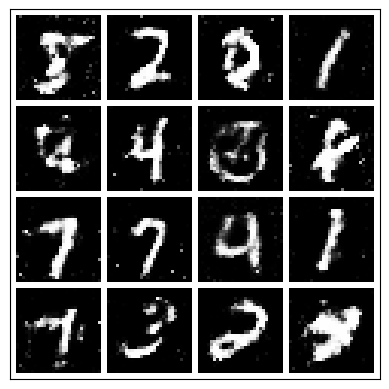

-------------------------------------
                Epoch 46:
                Step: 3000 |
                D_real Loss: 0.3869 |
                D_fake Loss: 0.9431 |
                D_total Loss: 1.3300 |
                G_Loss: 0.934 |
                Real_score 0.710 |
                Fake_score 0.545
            


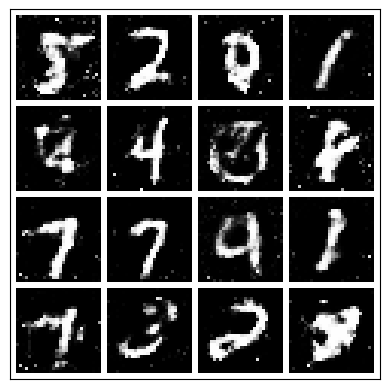

-------------------------------------
                Epoch 46:
                Step: 3500 |
                D_real Loss: 0.5558 |
                D_fake Loss: 0.6061 |
                D_total Loss: 1.1619 |
                G_Loss: 0.914 |
                Real_score 0.595 |
                Fake_score 0.439
            


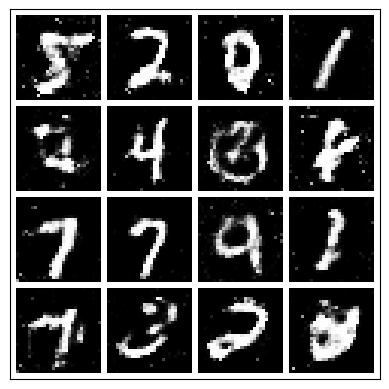

 92%|███████████████████████████████████████████████████████████████████████████▍      | 46/50 [50:48<04:14, 63.64s/it]

-------------------------------------
                Epoch 47:
                Step: 0 |
                D_real Loss: 0.6554 |
                D_fake Loss: 0.5394 |
                D_total Loss: 1.1949 |
                G_Loss: 0.929 |
                Real_score 0.572 |
                Fake_score 0.398
            


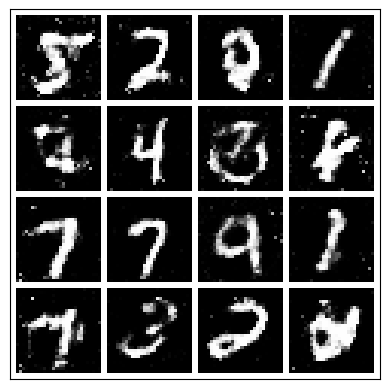

-------------------------------------
                Epoch 47:
                Step: 500 |
                D_real Loss: 0.7188 |
                D_fake Loss: 0.5597 |
                D_total Loss: 1.2785 |
                G_Loss: 0.877 |
                Real_score 0.520 |
                Fake_score 0.410
            


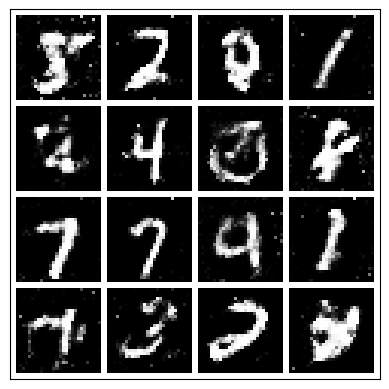

-------------------------------------
                Epoch 47:
                Step: 1000 |
                D_real Loss: 0.6950 |
                D_fake Loss: 0.6788 |
                D_total Loss: 1.3738 |
                G_Loss: 0.973 |
                Real_score 0.557 |
                Fake_score 0.470
            


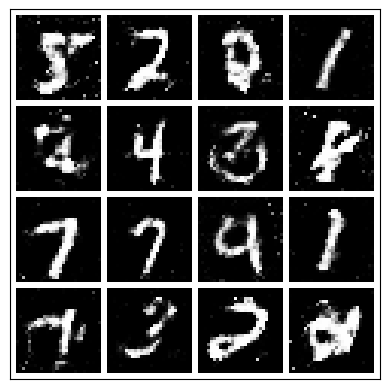

-------------------------------------
                Epoch 47:
                Step: 1500 |
                D_real Loss: 0.6063 |
                D_fake Loss: 0.6348 |
                D_total Loss: 1.2411 |
                G_Loss: 1.026 |
                Real_score 0.591 |
                Fake_score 0.431
            


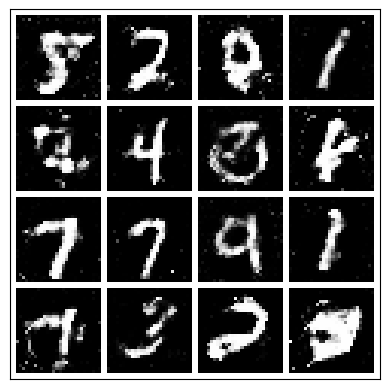

-------------------------------------
                Epoch 47:
                Step: 2000 |
                D_real Loss: 0.5106 |
                D_fake Loss: 0.4813 |
                D_total Loss: 0.9919 |
                G_Loss: 1.195 |
                Real_score 0.646 |
                Fake_score 0.368
            


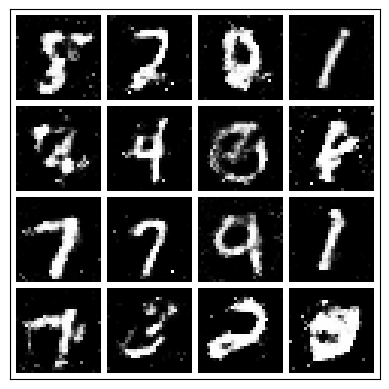

-------------------------------------
                Epoch 47:
                Step: 2500 |
                D_real Loss: 0.4971 |
                D_fake Loss: 0.5298 |
                D_total Loss: 1.0269 |
                G_Loss: 0.960 |
                Real_score 0.651 |
                Fake_score 0.395
            


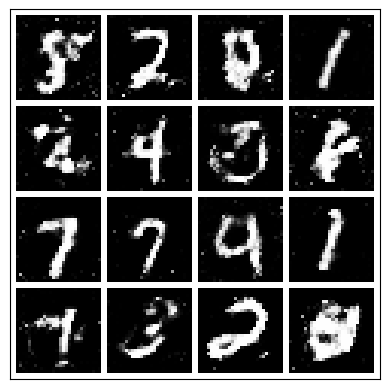

-------------------------------------
                Epoch 47:
                Step: 3000 |
                D_real Loss: 0.5908 |
                D_fake Loss: 0.5569 |
                D_total Loss: 1.1477 |
                G_Loss: 1.027 |
                Real_score 0.587 |
                Fake_score 0.405
            


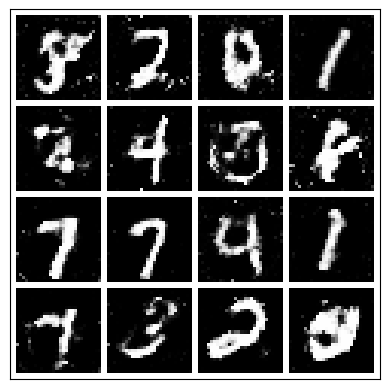

-------------------------------------
                Epoch 47:
                Step: 3500 |
                D_real Loss: 0.5206 |
                D_fake Loss: 0.7364 |
                D_total Loss: 1.2570 |
                G_Loss: 0.939 |
                Real_score 0.629 |
                Fake_score 0.457
            


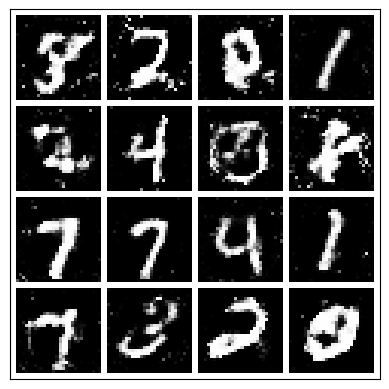

 94%|█████████████████████████████████████████████████████████████████████████████     | 47/50 [51:53<03:11, 63.87s/it]

-------------------------------------
                Epoch 48:
                Step: 0 |
                D_real Loss: 0.6014 |
                D_fake Loss: 0.5038 |
                D_total Loss: 1.1051 |
                G_Loss: 1.129 |
                Real_score 0.572 |
                Fake_score 0.360
            


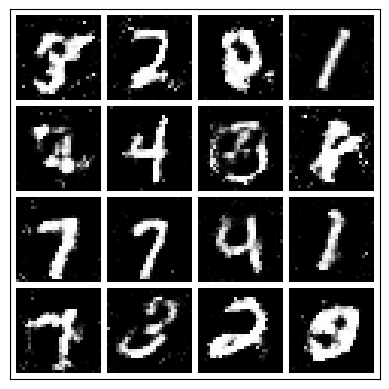

-------------------------------------
                Epoch 48:
                Step: 500 |
                D_real Loss: 0.5345 |
                D_fake Loss: 0.6877 |
                D_total Loss: 1.2222 |
                G_Loss: 1.009 |
                Real_score 0.625 |
                Fake_score 0.418
            


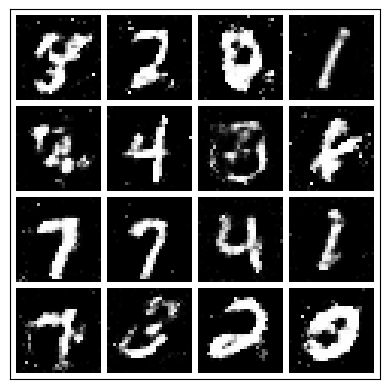

-------------------------------------
                Epoch 48:
                Step: 1000 |
                D_real Loss: 0.6663 |
                D_fake Loss: 0.4701 |
                D_total Loss: 1.1364 |
                G_Loss: 1.061 |
                Real_score 0.545 |
                Fake_score 0.328
            


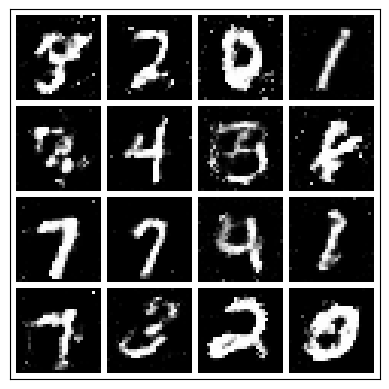

-------------------------------------
                Epoch 48:
                Step: 1500 |
                D_real Loss: 0.7785 |
                D_fake Loss: 0.5683 |
                D_total Loss: 1.3468 |
                G_Loss: 1.010 |
                Real_score 0.502 |
                Fake_score 0.392
            


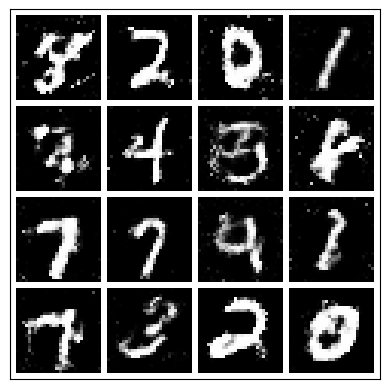

-------------------------------------
                Epoch 48:
                Step: 2000 |
                D_real Loss: 0.4903 |
                D_fake Loss: 0.4907 |
                D_total Loss: 0.9811 |
                G_Loss: 1.025 |
                Real_score 0.645 |
                Fake_score 0.370
            


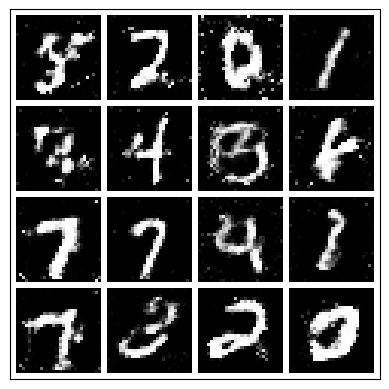

-------------------------------------
                Epoch 48:
                Step: 2500 |
                D_real Loss: 0.6098 |
                D_fake Loss: 0.7486 |
                D_total Loss: 1.3584 |
                G_Loss: 0.833 |
                Real_score 0.608 |
                Fake_score 0.494
            


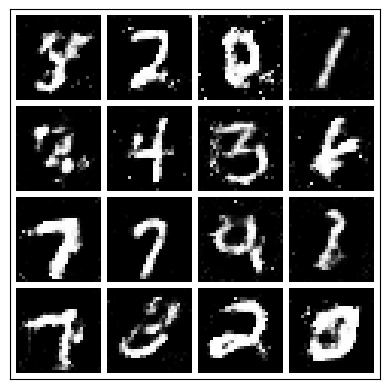

-------------------------------------
                Epoch 48:
                Step: 3000 |
                D_real Loss: 0.6317 |
                D_fake Loss: 0.4575 |
                D_total Loss: 1.0892 |
                G_Loss: 1.109 |
                Real_score 0.584 |
                Fake_score 0.350
            


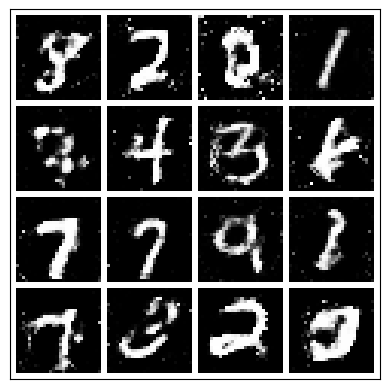

-------------------------------------
                Epoch 48:
                Step: 3500 |
                D_real Loss: 0.7455 |
                D_fake Loss: 0.6700 |
                D_total Loss: 1.4155 |
                G_Loss: 0.944 |
                Real_score 0.512 |
                Fake_score 0.453
            


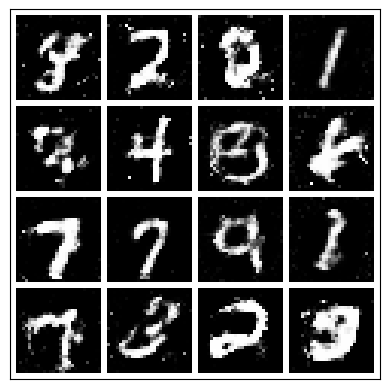

 96%|██████████████████████████████████████████████████████████████████████████████▋   | 48/50 [52:57<02:07, 63.92s/it]

-------------------------------------
                Epoch 49:
                Step: 0 |
                D_real Loss: 0.6522 |
                D_fake Loss: 0.6236 |
                D_total Loss: 1.2758 |
                G_Loss: 1.034 |
                Real_score 0.554 |
                Fake_score 0.422
            


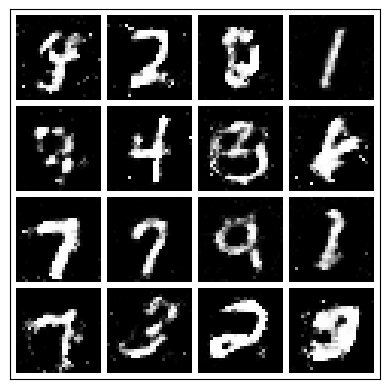

-------------------------------------
                Epoch 49:
                Step: 500 |
                D_real Loss: 0.4387 |
                D_fake Loss: 0.4849 |
                D_total Loss: 0.9236 |
                G_Loss: 1.131 |
                Real_score 0.674 |
                Fake_score 0.373
            


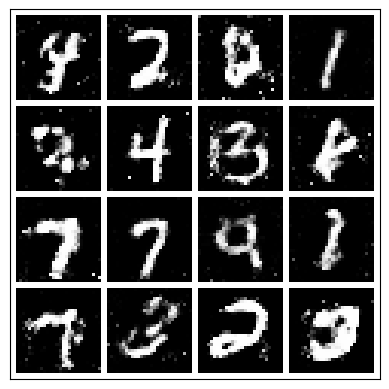

-------------------------------------
                Epoch 49:
                Step: 1000 |
                D_real Loss: 0.4662 |
                D_fake Loss: 0.6196 |
                D_total Loss: 1.0858 |
                G_Loss: 0.976 |
                Real_score 0.656 |
                Fake_score 0.447
            


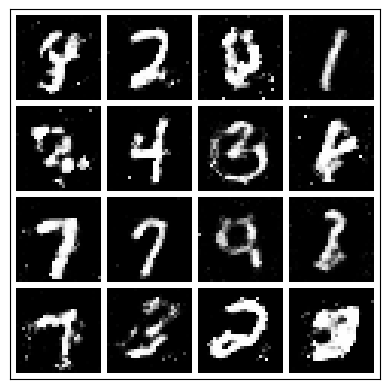

-------------------------------------
                Epoch 49:
                Step: 1500 |
                D_real Loss: 0.6481 |
                D_fake Loss: 0.5043 |
                D_total Loss: 1.1523 |
                G_Loss: 0.896 |
                Real_score 0.580 |
                Fake_score 0.381
            


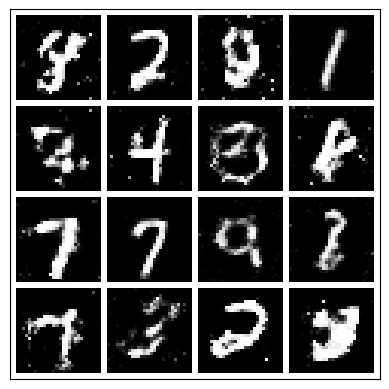

-------------------------------------
                Epoch 49:
                Step: 2000 |
                D_real Loss: 0.4268 |
                D_fake Loss: 0.5433 |
                D_total Loss: 0.9701 |
                G_Loss: 1.116 |
                Real_score 0.682 |
                Fake_score 0.366
            


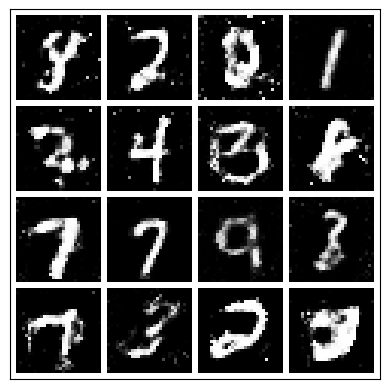

-------------------------------------
                Epoch 49:
                Step: 2500 |
                D_real Loss: 0.5816 |
                D_fake Loss: 0.5591 |
                D_total Loss: 1.1407 |
                G_Loss: 0.929 |
                Real_score 0.602 |
                Fake_score 0.410
            


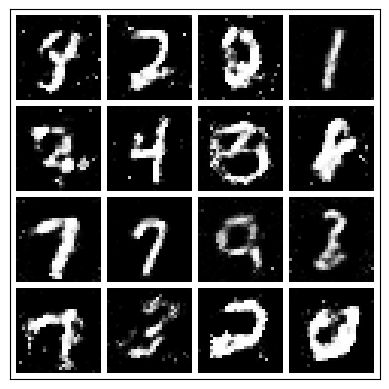

-------------------------------------
                Epoch 49:
                Step: 3000 |
                D_real Loss: 0.5967 |
                D_fake Loss: 0.5316 |
                D_total Loss: 1.1283 |
                G_Loss: 0.804 |
                Real_score 0.586 |
                Fake_score 0.397
            


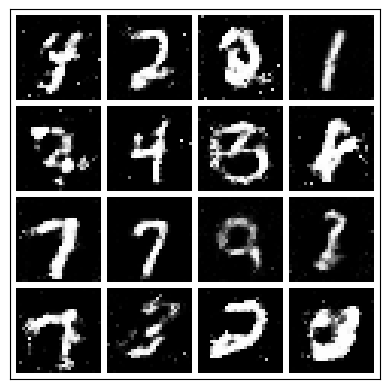

-------------------------------------
                Epoch 49:
                Step: 3500 |
                D_real Loss: 0.7040 |
                D_fake Loss: 0.5785 |
                D_total Loss: 1.2824 |
                G_Loss: 1.146 |
                Real_score 0.533 |
                Fake_score 0.408
            


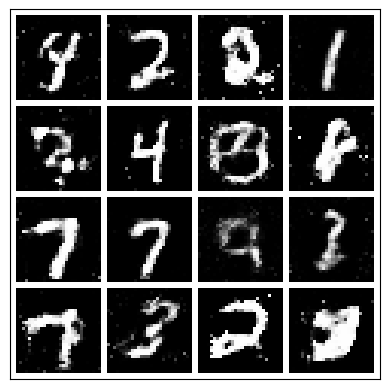

 98%|████████████████████████████████████████████████████████████████████████████████▎ | 49/50 [54:00<01:03, 63.81s/it]

-------------------------------------
                Epoch 50:
                Step: 0 |
                D_real Loss: 0.6293 |
                D_fake Loss: 0.5492 |
                D_total Loss: 1.1785 |
                G_Loss: 0.884 |
                Real_score 0.577 |
                Fake_score 0.411
            


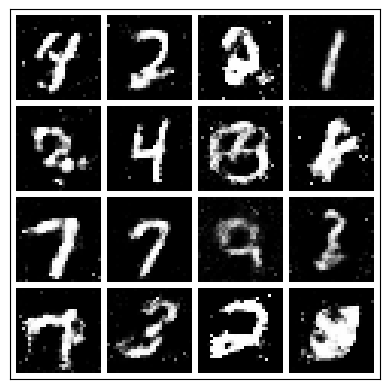

-------------------------------------
                Epoch 50:
                Step: 500 |
                D_real Loss: 0.5709 |
                D_fake Loss: 0.6557 |
                D_total Loss: 1.2266 |
                G_Loss: 1.066 |
                Real_score 0.603 |
                Fake_score 0.419
            


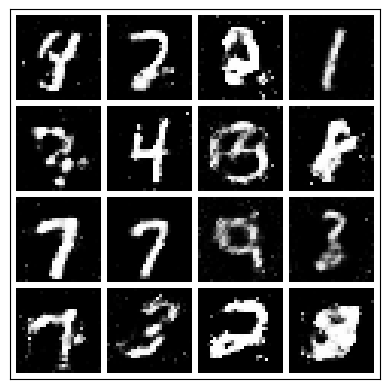

-------------------------------------
                Epoch 50:
                Step: 1000 |
                D_real Loss: 0.5743 |
                D_fake Loss: 0.6145 |
                D_total Loss: 1.1888 |
                G_Loss: 0.929 |
                Real_score 0.579 |
                Fake_score 0.426
            


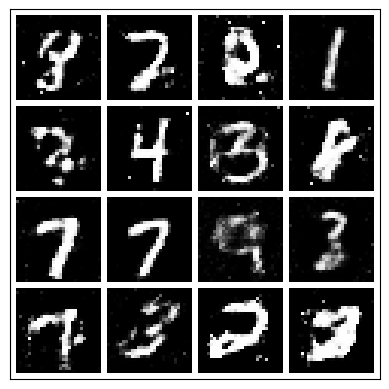

-------------------------------------
                Epoch 50:
                Step: 1500 |
                D_real Loss: 0.6734 |
                D_fake Loss: 0.7549 |
                D_total Loss: 1.4283 |
                G_Loss: 0.667 |
                Real_score 0.557 |
                Fake_score 0.456
            


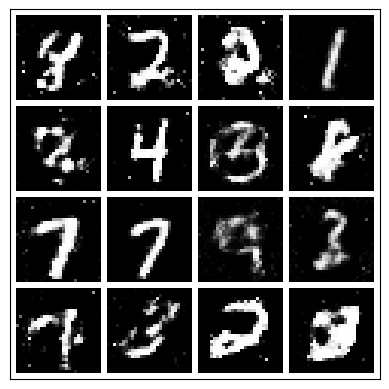

-------------------------------------
                Epoch 50:
                Step: 2000 |
                D_real Loss: 0.6699 |
                D_fake Loss: 0.5581 |
                D_total Loss: 1.2280 |
                G_Loss: 1.167 |
                Real_score 0.546 |
                Fake_score 0.415
            


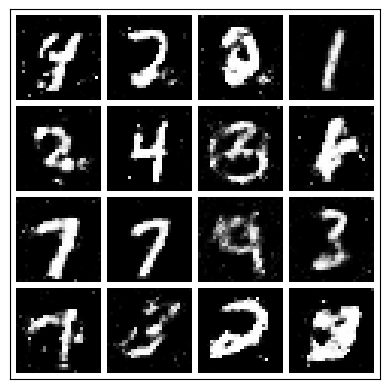

-------------------------------------
                Epoch 50:
                Step: 2500 |
                D_real Loss: 0.6799 |
                D_fake Loss: 0.5612 |
                D_total Loss: 1.2411 |
                G_Loss: 1.092 |
                Real_score 0.545 |
                Fake_score 0.396
            


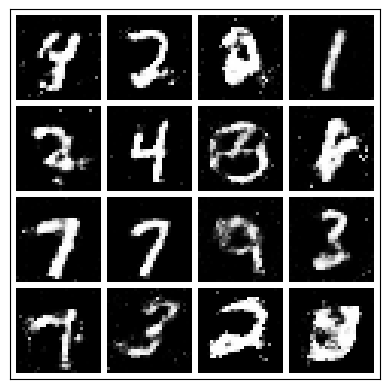

-------------------------------------
                Epoch 50:
                Step: 3000 |
                D_real Loss: 0.5224 |
                D_fake Loss: 0.7316 |
                D_total Loss: 1.2540 |
                G_Loss: 0.755 |
                Real_score 0.651 |
                Fake_score 0.476
            


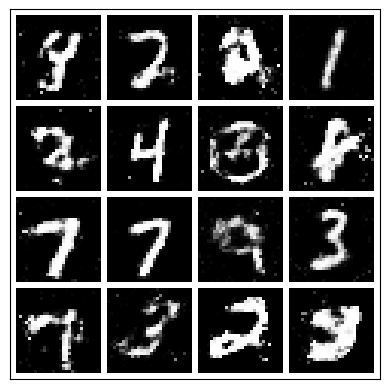

-------------------------------------
                Epoch 50:
                Step: 3500 |
                D_real Loss: 0.4907 |
                D_fake Loss: 0.4636 |
                D_total Loss: 0.9544 |
                G_Loss: 0.848 |
                Real_score 0.631 |
                Fake_score 0.360
            


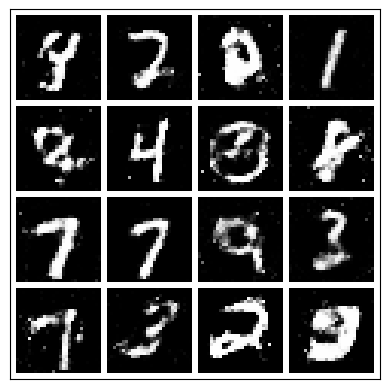

-------------------------------------
                Epoch 50:
                Step: 3749 |
                D_real Loss: 0.7394 |
                D_fake Loss: 0.6686 |
                D_total Loss: 1.4080 |
                G_Loss: 0.947 |
                Real_score 0.535 |
                Fake_score 0.456
            


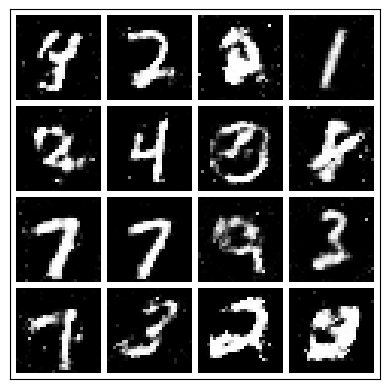

100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [55:04<00:00, 66.09s/it]


In [40]:
losses_G = []
losses_D = []

real_score_list = []
fake_score_list = []

num_epochs = 50

generator.train()
discriminator.train()

for epoch in tqdm(range(num_epochs)):

    for i, (data, _) in enumerate(mnist_dataloader, 0):

        discriminator.zero_grad()

        real_images = data.reshape(batch_size, 1, 784)

        output = discriminator(real_images).view(-1)

        real_loss_D = criterion(output, real_image_labels)

        real_loss_D.backward()

        real_score_D = output.mean().item()

        noise = torch.randn(batch_size, latent_noise_size)

        fake_images = generator(noise)

        output = discriminator(fake_images.detach()).view(-1)

        fake_loss_D = criterion(output, fake_image_labels)

        fake_loss_D.backward()

        fake_score_D = output.mean().item()

        total_loss_D = real_loss_D + fake_loss_D

        optimizer_D.step()


        generator.zero_grad()

        output = discriminator(fake_images).view(-1)

        loss_G = criterion(output, real_image_labels)

        loss_G.backward()

        optimizer_G.step()

        if (i % 500 == 0) or ((epoch == num_epochs - 1) and (i == len(mnist_dataloader) - 1)):
            print(f"""-------------------------------------
                Epoch {epoch + 1}:
                Step: {i} |
                D_real Loss: {real_loss_D:.4f} |
                D_fake Loss: {fake_loss_D:.4f} |
                D_total Loss: {total_loss_D:.4f} |
                G_Loss: {loss_G:.3f} |
                Real_score {real_score_D:.3f} |
                Fake_score {fake_score_D:.3f}
            """)

            with torch.no_grad():
                generated_images = generator(fixed_noise).reshape(batch_size, 1, 28, 28).detach().cpu()
                display(make_grid(generated_images, nrow = 4, pad_value = 1.0))

        losses_G.append(loss_G.item())
        losses_D.append(total_loss_D.item())

        real_score_list.append(real_score_D)
        fake_score_list.append(fake_score_D)

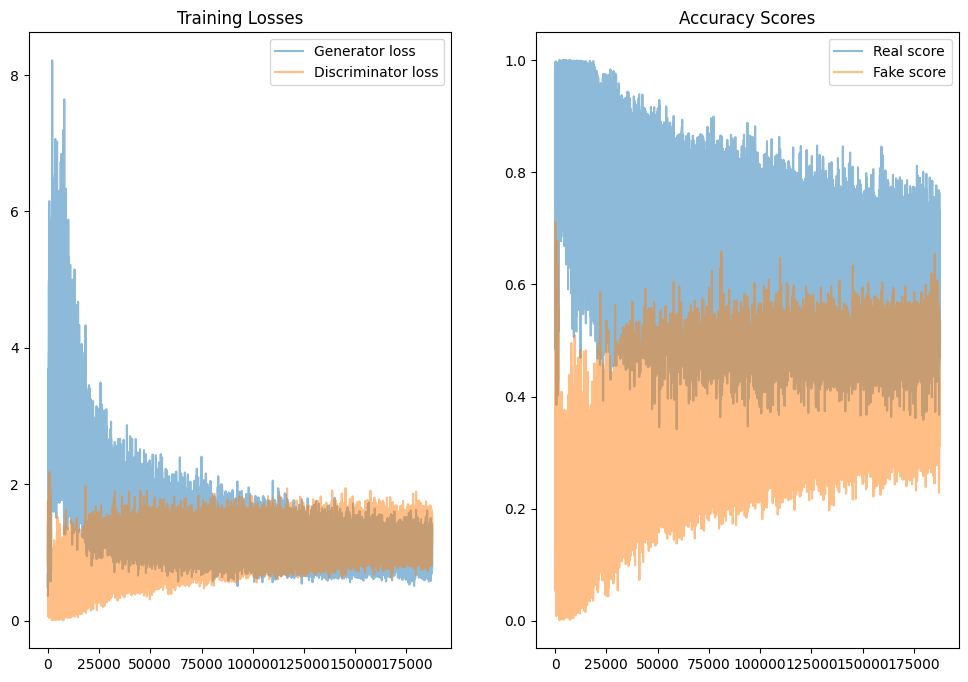

In [41]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (12, 8))

ax1.plot(losses_G, label = 'Generator loss', alpha = 0.5)
ax1.plot(losses_D, label = 'Discriminator loss', alpha = 0.5)
ax1.legend()

ax1.set_title('Training Losses')
ax2.plot(real_score_list, label = 'Real score', alpha = 0.5)
ax2.plot(fake_score_list, label = 'Fake score', alpha = 0.5)
ax2.set_title('Accuracy Scores')

ax2.legend()